<a href="https://colab.research.google.com/github/pietrotaliento/MLandDataMiningGroup14/blob/main/F21DL_Group_CW_14_2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **R2 EDA**

###Common Imports

In [ ]:
import sys
assert sys.version_info >= (3, 5)

In [ ]:
import sklearn
assert sklearn.__version__ >= "0.20"

In [ ]:

import numpy as np
import tarfile
import urllib
import pandas as pd
import urllib.request


In [ ]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

###Load Dataset

In [ ]:
# Load the dataset
credit = pd.read_csv('cs-training.csv')

###Information about the dataset

In [ ]:
import pandas as pd

# Check the unique classes in the dataset
num_classes = credit['SeriousDlqin2yrs'].nunique()

# Print the number of unique classes in the dataset
print(f'The dataset has {num_classes} unique classes.')


The dataset has 2 unique classes.


Dataset has 11 different features including index column with unique numbers  and 1 column for outcome (label) that makes our data set suitable for classification problem for supervised learning.

In [ ]:
# Label the classes based on their meaning
label_mapping = {0: "No Delinquency in 2 Years", 1: "Serious Delinquency in 2 Years"}

# Get the number of instances for each class
unique_classes = credit['SeriousDlqin2yrs'].value_counts()
print("Unique Classes and their counts with labels:")
for class_value, count in unique_classes.items():
    print(f"Class {class_value} ({label_mapping[class_value]}): {count} instances")


Unique Classes and their counts with labels:
Class 0 (No Delinquency in 2 Years): 139974 instances
Class 1 (Serious Delinquency in 2 Years): 10026 instances


In [ ]:
# Display the first five rows of the DataFrame
credit.head()

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [ ]:
#Print information about the DataFrame and data type of each feature
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 12 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   Unnamed: 0                            150000 non-null  int64  
 1   SeriousDlqin2yrs                      150000 non-null  int64  
 2   RevolvingUtilizationOfUnsecuredLines  150000 non-null  float64
 3   age                                   150000 non-null  int64  
 4   NumberOfTime30-59DaysPastDueNotWorse  150000 non-null  int64  
 5   DebtRatio                             150000 non-null  float64
 6   MonthlyIncome                         120269 non-null  float64
 7   NumberOfOpenCreditLinesAndLoans       150000 non-null  int64  
 8   NumberOfTimes90DaysLate               150000 non-null  int64  
 9   NumberRealEstateLoansOrLines          150000 non-null  int64  
 10  NumberOfTime60-89DaysPastDueNotWorse  150000 non-null  int64  
 11  

In [ ]:
#Display information about feature's values
credit.describe()

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,75000.500000,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,43301.414527,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37500.750000,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,75000.500000,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,112500.250000,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,150000.000000,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [ ]:
#simpler visualization
credit.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,150000.0,75000.500000,43301.414527,1.0,37500.750000,75000.500000,112500.250000,150000.0
SeriousDlqin2yrs,150000.0,0.066840,0.249746,0.0,0.000000,0.000000,0.000000,1.0
RevolvingUtilizationOfUnsecuredLines,150000.0,6.048438,249.755371,0.0,0.029867,0.154181,0.559046,50708.0
age,150000.0,52.295207,14.771866,0.0,41.000000,52.000000,63.000000,109.0
NumberOfTime30-59DaysPastDueNotWorse,150000.0,0.421033,4.192781,0.0,0.000000,0.000000,0.000000,98.0
DebtRatio,150000.0,353.005076,2037.818523,0.0,0.175074,0.366508,0.868254,329664.0
MonthlyIncome,120269.0,6670.221237,14384.674215,0.0,3400.000000,5400.000000,8249.000000,3008750.0
NumberOfOpenCreditLinesAndLoans,150000.0,8.452760,5.145951,0.0,5.000000,8.000000,11.000000,58.0
NumberOfTimes90DaysLate,150000.0,0.265973,4.169304,0.0,0.000000,0.000000,0.000000,98.0
NumberRealEstateLoansOrLines,150000.0,1.018240,1.129771,0.0,0.000000,1.000000,2.000000,54.0


In [ ]:
# Classify each feature's level of measurement
def classify_measurement_level(column, unique_values):
    # Check data types
    if pd.api.types.is_bool_dtype(column):
        return "Binary"
    elif pd.api.types.is_numeric_dtype(column):
        if unique_values <= 10:
            return "Ordinal"  # Numeric but small range
        else:
            # Further classify numeric types
            if (column.min() == 0 or column.min() > 0):
                return "Ratio"  # Has a meaningful zero point
            else:
                return "Interval"  # Doesn't have meaningful zero point
    elif pd.api.types.is_string_dtype(column):
        if unique_values <= 10:
            return "Nominal"  # Non-numeric small set of categories
        else:
            return "Nominal"  # Many unique strings
    elif pd.api.types.is_categorical_dtype(column):
        return "Ordinal" if column.ordered else "Nominal"  # If there is a specific order, it's Ordinal
    else:
        return "Unknown"

# Function to analyze dataset
def analyze_dataset(df, dataset_name):
    print(f"\n--- Analyzing {dataset_name} ---")

    # Display number of attributes and instances of the dataset
    print(f"Number of instances (rows): {df.shape[0]}")
    print(f"Number of attributes (columns): {df.shape[1]}")

    # Display dataset's first five rows
    print("\nFirst five rows of the dataset:")
    print(df.head())

    # Check for the unique values in each column and classify the measurement level of each attribute
    print("\nColumn Measurement Level Classification:")
    for column in df.columns:
        unique_values = df[column].nunique()
        measurement_level = classify_measurement_level(df[column], unique_values)
        print(f"Column '{column}': {measurement_level}, Unique Values: {unique_values}")

    # Summary statistics for continuous variables
    print("\nSummary statistics for continuous variables:")
    print(credit.describe())

    # Check for missing values
    print("\nMissing values in the dataset:")
    print(credit.isnull().sum())
    # Display rows with missing values
    print("\nRows with missing values:")
    print(credit[credit.isnull().any(axis=1)])

# Analyze dataset
analyze_dataset(credit, "First Dataset")



--- Analyzing First Dataset ---
Number of instances (rows): 150000
Number of attributes (columns): 12

First five rows of the dataset:
   Unnamed: 0  SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines  age  \
0           1                 1                              0.766127   45   
1           2                 0                              0.957151   40   
2           3                 0                              0.658180   38   
3           4                 0                              0.233810   30   
4           5                 0                              0.907239   49   

   NumberOfTime30-59DaysPastDueNotWorse  DebtRatio  MonthlyIncome  \
0                                     2   0.802982         9120.0   
1                                     0   0.121876         2600.0   
2                                     1   0.085113         3042.0   
3                                     0   0.036050         3300.0   
4                                     1   0.024926

###Preliminary Visualization

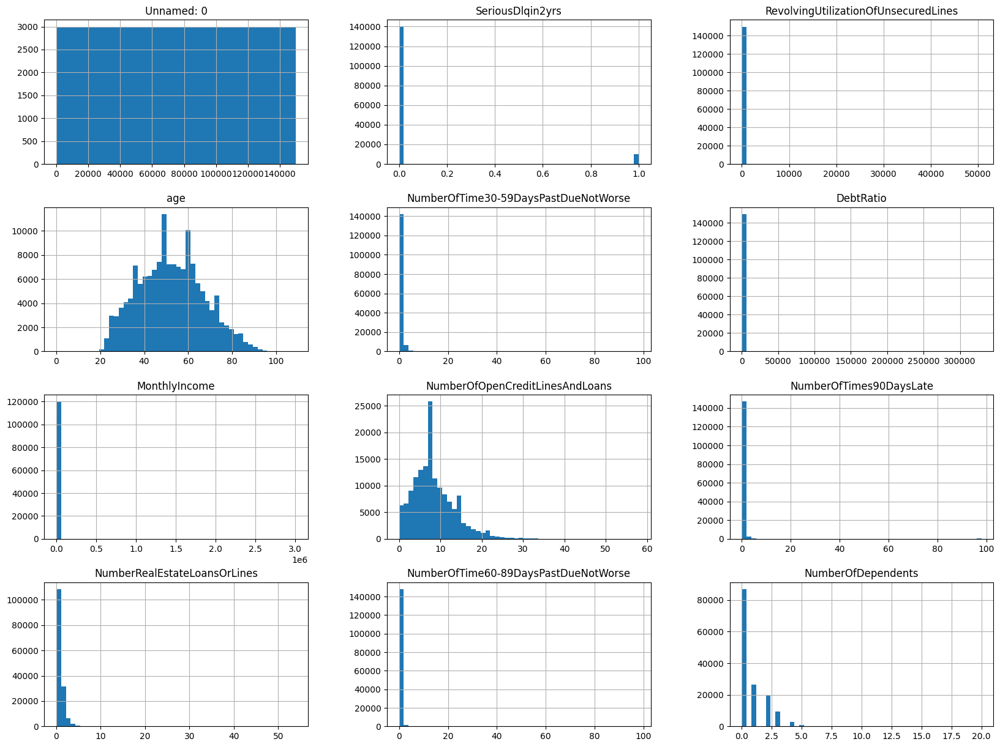

In [ ]:
#Plot histogram for each numerical attribute
credit.hist(bins=50, figsize=(20,15))
plt.show()

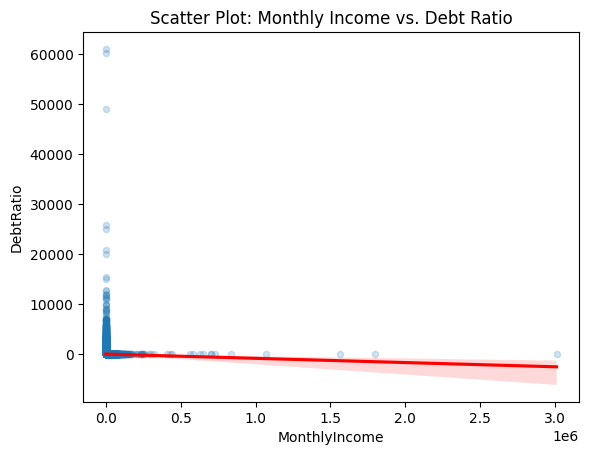

In [ ]:
import seaborn as sns

#Scatter plot with regression line for DebtRatio and MonthlyIncome
credit.plot(kind="scatter", x="MonthlyIncome", y="DebtRatio", alpha=0.2)
plt.title("Scatter Plot: Monthly Income vs. Debt Ratio")
plt.xlabel("Monthly Income")
plt.ylabel("Debt Ratio")

sns.regplot(x="MonthlyIncome", y="DebtRatio", data=credit, scatter=False, color="red")
plt.show()

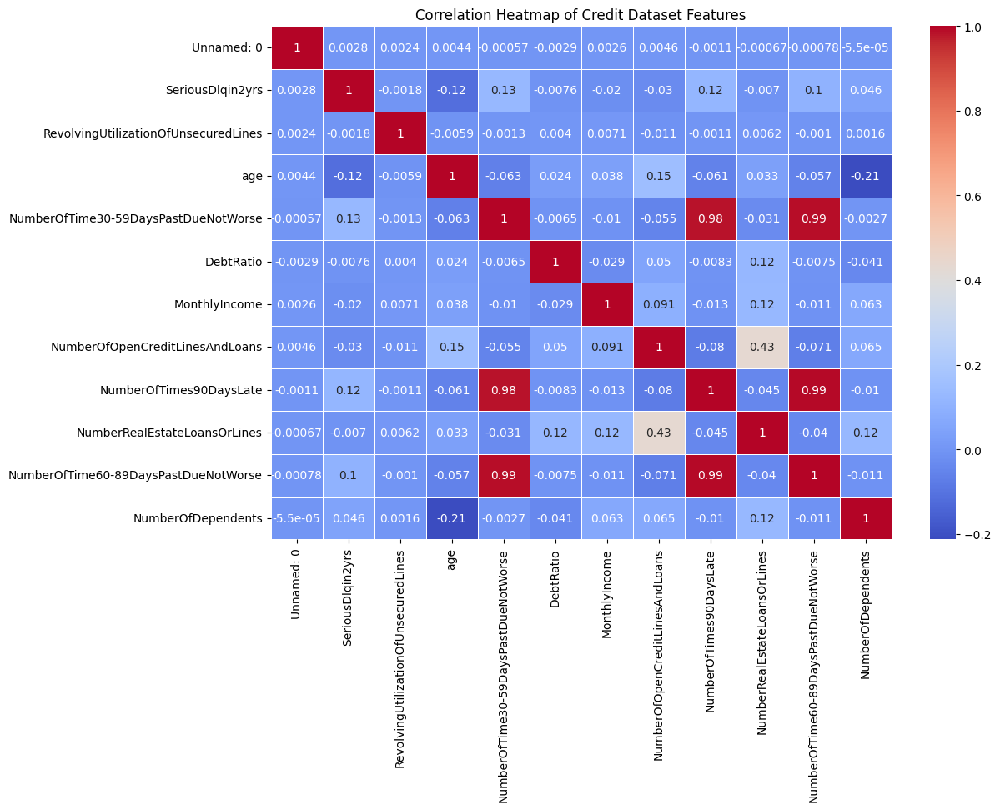

In [ ]:
import seaborn as sns

# Compute the correlation matrix for the credit dataset
corr_matrix = credit.corr()

# Create a heatmap of the correlation matrix between features
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap of Credit Dataset Features")
plt.show()

Negative correlation was obtained as -21% between “age” and “number of depended” and highest correlation was obtained as 15% between ‘NumberofOpenCreditLineAndLoans’ and ‘age’.However as we understood the each features are generally independent and no specific high correlation was observed.

###Missing Values

In [ ]:
# display some rows with missing values
sample_incomplete_rows = credit[credit.isnull().any(axis=1)].head()
sample_incomplete_rows


,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
6,7,0,0.305682,57,0,5710.0,NaN,8,0,3,0,0.0
8,9,0,0.116951,27,0,46.0,NaN,2,0,0,0,NaN
16,17,0,0.061086,78,0,2058.0,NaN,10,0,2,0,0.0
32,33,0,0.083418,62,0,977.0,NaN,6,0,1,0,0.0
41,42,0,0.072898,81,0,75.0,NaN,7,0,0,0,0.0


We have a couple of options to deal with the *missing values*:



1.Drop the rows with incomplete values:

*   Pros: Doesn't alter the distribution of remaining data; In our case, we would still have a representative amouunt of data remaining
*   Cons: We would miss out on thousand of rows with all the other attributes, which can be very useful information

2.Drop the attribute with missing values:


*   Pros: Eliminates the need to handle a problematic feature; We can preserve all the values for the other attributes
*   Cons: 'Monthly Income' can be a very important feature to understand our profiles, which makes this the less valuable option

3.Mean Imputation:


*   Pros: Keeps the dataset size unchanged and all the features available
*   Cons: Could introduce bias; It's less effective for highly correlated feature

4.Median Imputation:



*   Pros: More than Mean Imputation, this method is robust to Outliers (Extreme Values)
*   Cons: Could also introduce bias; ignores relationships between variables


We learned about missing values in the ‘NumberOfDependents’ column and  mostly in the ‘MonthlyIncome’ column, which needed to be handled. Since this attributes are crucial in the analysis,  we decide to impute both with a mean, in order to maintain the integrity of the data.









In [ ]:
# option 1
sample_incomplete_rows.dropna(subset=["MonthlyIncome"])

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents


In [ ]:
# option 2
sample_incomplete_rows.drop("MonthlyIncome", axis=1)

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
6,7,0,0.305682,57,0,5710.0,8,0,3,0,0.0
8,9,0,0.116951,27,0,46.0,2,0,0,0,NaN
16,17,0,0.061086,78,0,2058.0,10,0,2,0,0.0
32,33,0,0.083418,62,0,977.0,6,0,1,0,0.0
41,42,0,0.072898,81,0,75.0,7,0,0,0,0.0


In [ ]:
#To better understand the importance of each feature in the final result, in order to make a decision, we create a Feature Score Table
import pandas as pd
from sklearn.feature_selection import SelectKBest, f_classif

# X contains all the features except our target variable, 'SeriousDlqin2yrs'
# y is our target variable
X = credit.drop("SeriousDlqin2yrs", axis=1)
y = credit["SeriousDlqin2yrs"]
# Drop the rows with missing values, for both X and y
X_dropped = X.dropna()
y_dropped = y.loc[X_dropped.index]

# Apply SelectKBest to evaluate the highest correlations with the target variable
best_features = SelectKBest(score_func=f_classif, k=10)
fit = best_features.fit(X_dropped, y_dropped)

# Create the Feature Score Table
feature_scores = pd.DataFrame({'Feature': X.columns, 'Score': fit.scores_})
print(feature_scores.sort_values(by='Score', ascending=False))

                                 Feature        Score
3   NumberOfTime30-59DaysPastDueNotWorse  1852.321988
7                NumberOfTimes90DaysLate  1504.384585
2                                    age  1281.630144
9   NumberOfTime60-89DaysPastDueNotWorse  1068.379731
10                    NumberOfDependents   262.909343
6        NumberOfOpenCreditLinesAndLoans    90.654065
5                          MonthlyIncome    46.908783
0                             Unnamed: 0     2.748860
4                              DebtRatio     1.302832
8           NumberRealEstateLoansOrLines     1.086088
1   RevolvingUtilizationOfUnsecuredLines     0.684401


Unnamed: 0                                  0
SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64


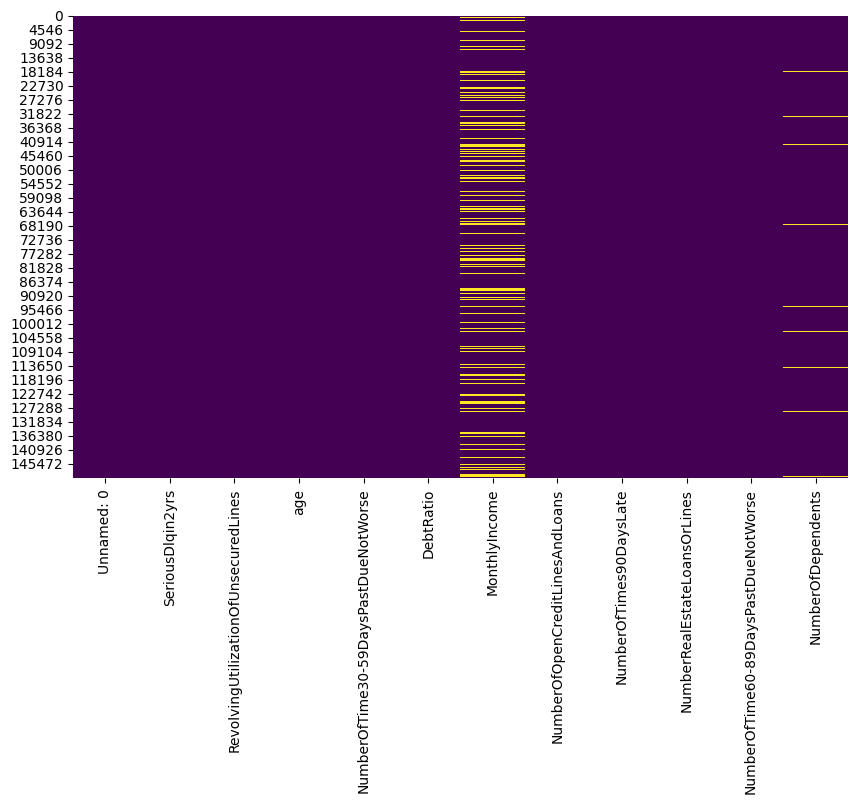

<class 'pandas.core.frame.DataFrame'>
Index: 90397 entries, 1 to 149999
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   SeriousDlqin2yrs                      90397 non-null  int64  
 1   RevolvingUtilizationOfUnsecuredLines  90397 non-null  float64
 2   age                                   90397 non-null  int64  
 3   NumberOfTime30-59DaysPastDueNotWorse  90397 non-null  int64  
 4   DebtRatio                             90397 non-null  float64
 5   MonthlyIncome                         90397 non-null  float64
 6   NumberOfOpenCreditLinesAndLoans       90397 non-null  int64  
 7   NumberOfTimes90DaysLate               90397 non-null  int64  
 8   NumberRealEstateLoansOrLines          90397 non-null  int64  
 9   NumberOfTime60-89DaysPastDueNotWorse  90397 non-null  int64  
 10  NumberOfDependents                    90397 non-null  float64
dtypes: float64(4), int6

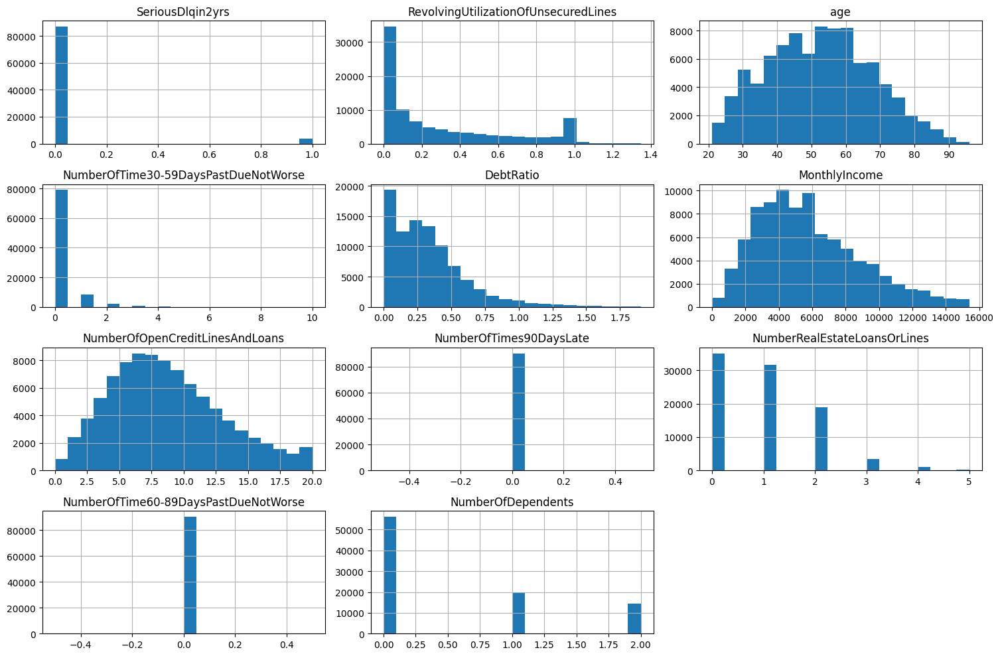

       SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines           age  \
count      90397.000000                          90397.000000  90397.000000   
mean           0.039161                              0.294770     52.346925   
std            0.193978                              0.333021     15.212782   
min            0.000000                              0.000000     21.000000   
25%            0.000000                              0.026957     41.000000   
50%            0.000000                              0.138972     52.000000   
75%            0.000000                              0.492133     63.000000   
max            1.000000                              1.347578     96.000000   

       NumberOfTime30-59DaysPastDueNotWorse     DebtRatio  MonthlyIncome  \
count                          90397.000000  90397.000000   90397.000000   
mean                               0.176012      0.330158    5788.111298   
std                                0.544905      0.286840   

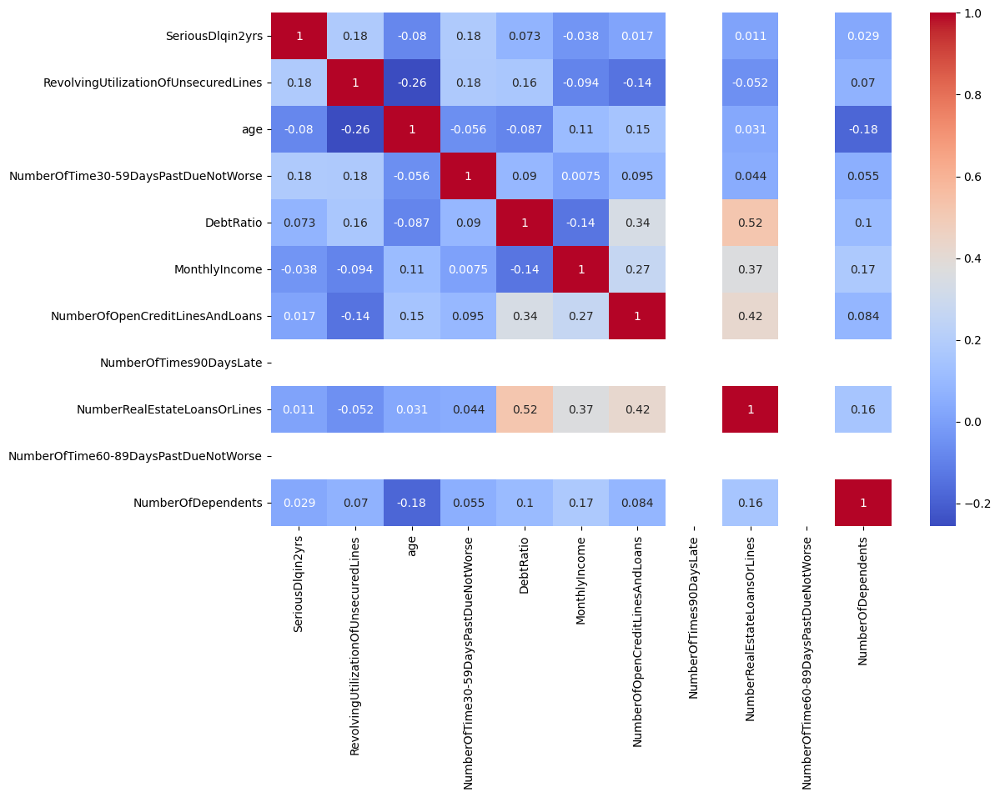

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
credit = pd.read_csv('cs-training.csv')

# Print number of missing values
print(credit.isnull().sum())

# Visualize missing data with a plot
plt.figure(figsize=(10, 6))
sns.heatmap(credit.isnull(), cbar=False, cmap='viridis')
plt.show()

# Handle missing values with a Median Imputation
credit.fillna(credit.median(), inplace=True)

# Drop the index column
if 'Unnamed: 0' in credit.columns:
    credit.drop(columns=['Unnamed: 0'], inplace=True)

# Identify and remove outliers in numerical columns
num_columns = ['RevolvingUtilizationOfUnsecuredLines', 'age', 'DebtRatio', 'MonthlyIncome',
               'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
               'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
               'NumberOfDependents']

for col in num_columns:
    Q1 = credit[col].quantile(0.25)
    Q3 = credit[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    credit = credit[(credit[col] >= lower_bound) & (credit[col] <= upper_bound)]

# Verify the data cleanliness after outlier removal and missing value handling
print(credit.info())

# Visualize histogram after cleaning
credit.hist(bins=20, figsize=(15,10))
plt.tight_layout()
plt.show()

# Check the summary statistics after cleaning
print(credit.describe())

# Check updated correlation matrix
plt.figure(figsize=(12,8))
sns.heatmap(credit.corr(), annot=True, cmap='coolwarm')
plt.show()


Handling missing Values

Missing values before imputation:
Unnamed: 0                                  0
SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64

Missing values after imputation:
Unnamed: 0                              0
SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate        

<ipython-input-22-93f9c561729b>:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  credit['MonthlyIncome'].fillna(credit['MonthlyIncome'].mean(), inplace=True)
<ipython-input-22-93f9c561729b>:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(v

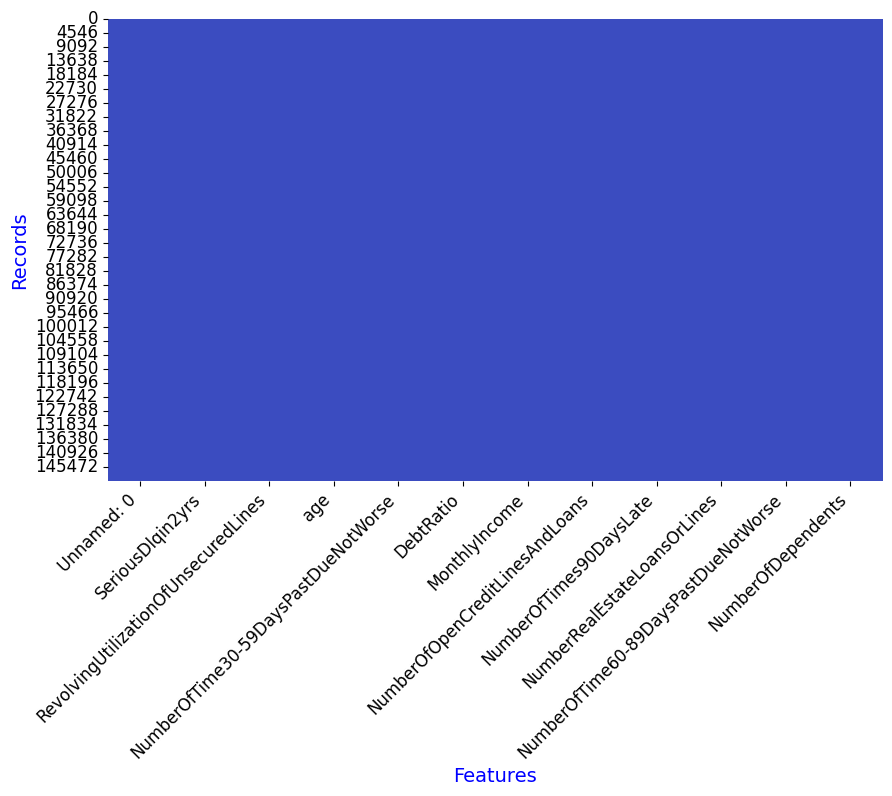


Missing values after dropping rows:
Unnamed: 0                              0
SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfTime60-89DaysPastDueNotWorse    0
NumberOfDependents                      0
dtype: int64

Data saved as 'credit_cleaned'


,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
ID,,,,,,,,,,,
1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
credit = pd.read_csv('cs-training.csv')

# Display missing values before imputation
print("Missing values before imputation:")
print(credit.isnull().sum())

# Handle missing values with mean imputation for MonthlyIncome and NumberOfDependents
# credit['MonthlyIncome'].fillna(credit['MonthlyIncome'].median(), inplace=True)
credit['MonthlyIncome'].fillna(credit['MonthlyIncome'].mean(), inplace=True)
# credit['NumberOfDependents'].fillna(credit['NumberOfDependents'].median(), inplace=True)
credit['NumberOfDependents'].fillna(credit['NumberOfDependents'].mean(), inplace=True)

# Check for missing values after imputation
print("\nMissing values after imputation:")
print(credit.isnull().sum())

# Visualize missing values after imputation
plt.figure(figsize=(10, 6))
sns.heatmap(credit.isnull(), cbar=False, cmap='coolwarm')

# Customize the axis labels
plt.xticks(rotation=45, ha='right', fontsize=12, color='black')
plt.yticks(fontsize=12, color='black')

# Customize heatmap labels
plt.xlabel('Features', fontsize=14, color='blue')
plt.ylabel('Records', fontsize=14, color='blue')

# Show the plot
plt.show()

# Drop remaining rows with missing values
credit.dropna(inplace=True)

# Check for missing values after removing rows, there shouldn't be any
print("\nMissing values after dropping rows:")
print(credit.isnull().sum())

#Saving Cleaned Dataset
credit_cleaned = credit
#credit.to_csv('credit_cleaned.csv', index=True)
print("\nData saved as 'credit_cleaned'")

# after handling null values
credit_cleaned.isnull().sum()

# renaming unnamed column and setting it as index colum
credit_cleaned.rename(columns={'Unnamed: 0': 'ID'}, inplace=True)
credit_cleaned.set_index('ID',inplace=True)

credit_cleaned.head()

<ipython-input-23-f0233c00de65>:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  credit['MonthlyIncome'].fillna(credit['MonthlyIncome'].median(), inplace=True)
<ipython-input-23-f0233c00de65>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method


Missing values after imputation:
SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfTime60-89DaysPastDueNotWorse    0
NumberOfDependents                      0
dtype: int64


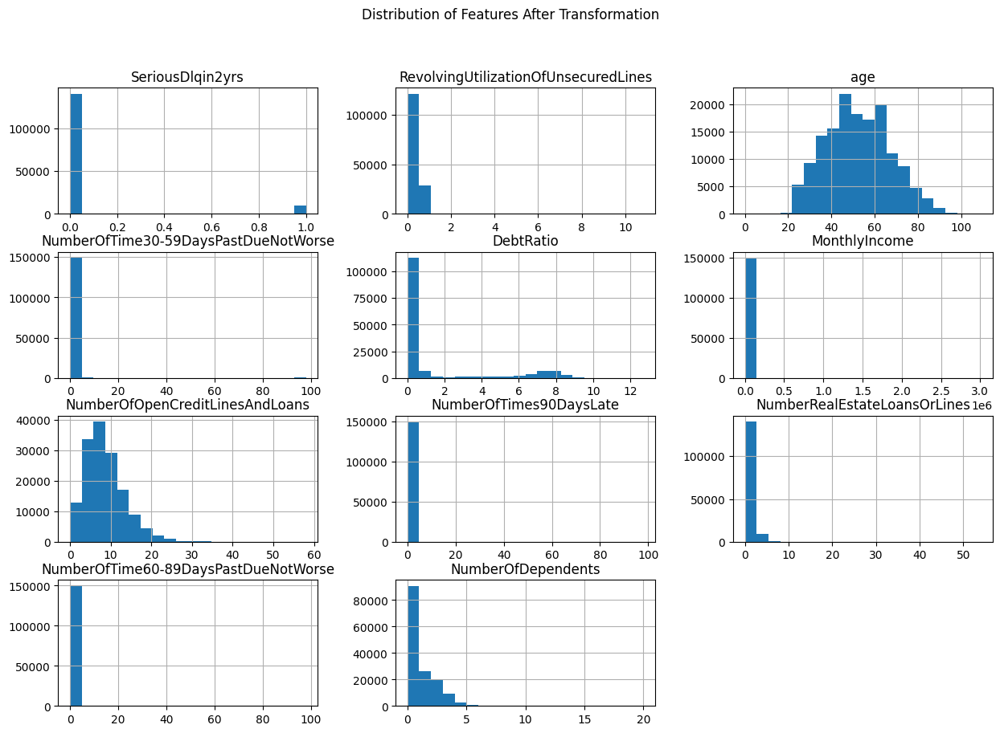

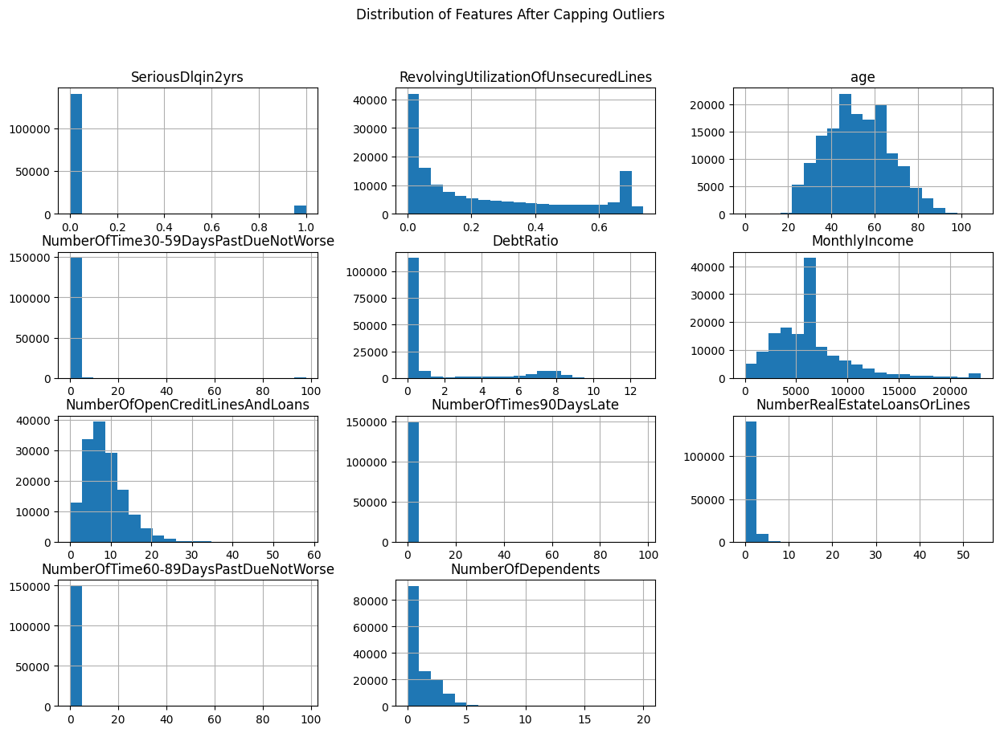

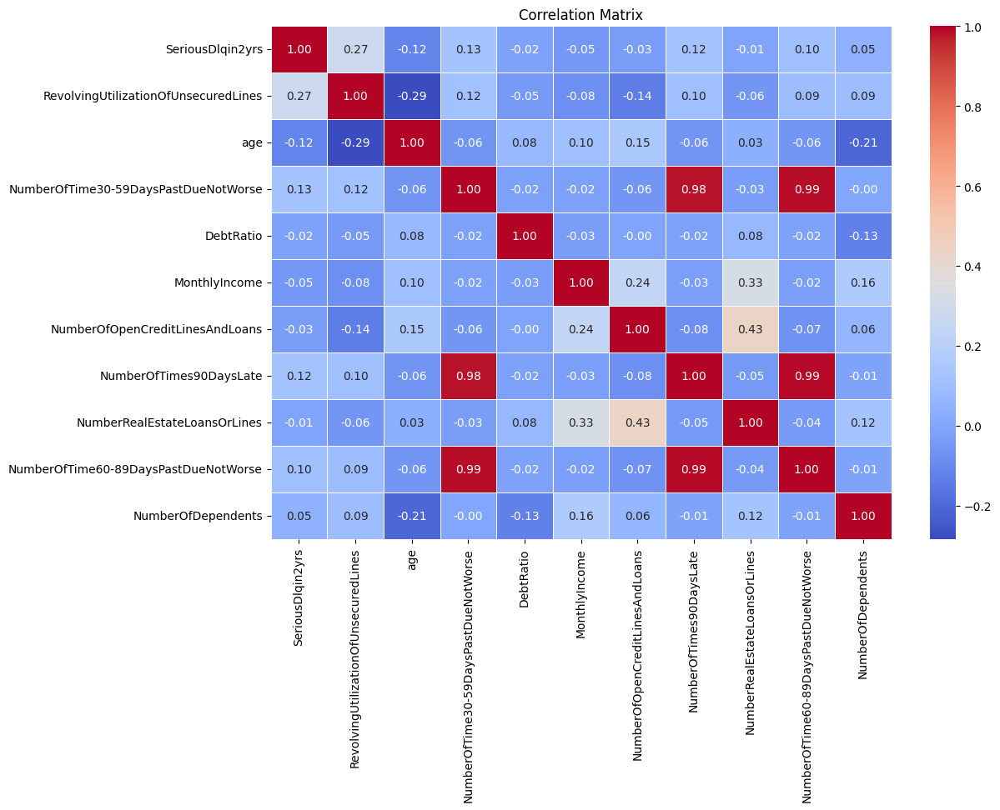


Columns after dropping correlated features:
Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfDependents'],
      dtype='object')

Final missing values check:
SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfDependents                      0
dtype: int64

Summary statistics after data cleansing:
       SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines            age  \
count     150000.000000                         150000.000000  1500

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
# Here, we have the entire work for data cleaning and preprocessing, as well as the final check

#### Missing Values Imputation

# Handle missing values with median imputation for MonthlyIncome and NumberOfDependents
credit['MonthlyIncome'].fillna(credit['MonthlyIncome'].median(), inplace=True)
credit['NumberOfDependents'].fillna(credit['NumberOfDependents'].median(), inplace=True)

# Check for missing values after imputation
print("\nMissing values after imputation:")
print(credit.isnull().sum())

#### Skewness Handled with Log Transformation

# Apply log transformation to reduce skewness for 'RevolvingUtilizationOfUnsecuredLines' and 'DebtRatio', which we noticed to be very skewed in the histograms
credit['RevolvingUtilizationOfUnsecuredLines'] = np.log1p(credit['RevolvingUtilizationOfUnsecuredLines'])
credit['DebtRatio'] = np.log1p(credit['DebtRatio'])

# Check the updated histograms
credit_cleaned.hist(bins=20, figsize=(15, 10))
plt.suptitle('Distribution of Features After Transformation')
plt.show()

#### Outliers Handled by Capping at the 99th Percentile

# Function to cap outliers at the 99th percentile
def cap_outliers(df, column):
    upper_limit = df[column].quantile(0.99)
    df[column] = np.where(df[column] > upper_limit, upper_limit, df[column])

# Apply capping to the colums with most visible outliers 'MonthlyIncome' and 'RevolvingUtilizationOfUnsecuredLines'
cap_outliers(credit_cleaned, 'MonthlyIncome')
cap_outliers(credit_cleaned, 'RevolvingUtilizationOfUnsecuredLines')

# Check the updated histograms to see the effect of capping
credit_cleaned.hist(bins=20, figsize=(15, 10))
plt.suptitle('Distribution of Features After Capping Outliers')
plt.show()

#### Correlated Features Handled dropping the highest correlated one

# Compute the updated correlation matrix
correlation_matrix = credit_cleaned.corr()

# Plot the updated correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# Drop one of the highly correlated features to reduce molticollinearity, which can negatively impact model preformance
credit_cleaned.drop(columns=['NumberOfTime60-89DaysPastDueNotWorse'], inplace=True)

# Check the columns after dropping highly correlated features
print("\nColumns after dropping correlated features:")
print(credit_cleaned.columns)

#### Final Data Check

# Check if the dataset has no more missing values and is ready for modeling
print("\nFinal missing values check:")
print(credit_cleaned.isnull().sum())

# Print summary statistics to ensure everything is in the expected range
print("\nSummary statistics after data cleansing:")
print(credit_cleaned.describe())


**Data Cleaning Conclusions**

After careful consideration, we chose median imputation to handle missing values, as the missing data was concentrated in only two key features that were essential to our analysis. Given the presence of outliers and the importance of these features, we calculated the median for each affected column. This approach allowed us to retain as much data as possible while minimizing the influence of outliers. We then removed any rows with remaining missing values and re-examined the data through updated visualizations to ensure everything was in order. This strategy resulted in a complete and more consistent DataFrame, providing a solid foundation for generating meaningful visualizations and drawing valuable insights

###Plots

Dataset loaded successfully.
Descriptive statistics:
          Unnamed: 0  SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines  \
count  120269.000000     120269.000000                         120269.000000   
mean    75026.012514          0.069486                              5.899873   
std     43286.029117          0.254280                            257.040685   
min         1.000000          0.000000                              0.000000   
25%     37678.000000          0.000000                              0.035084   
50%     74969.000000          0.000000                              0.177282   
75%    112494.000000          0.000000                              0.579428   
max    150000.000000          1.000000                          50708.000000   

                 age  NumberOfTime30-59DaysPastDueNotWorse      DebtRatio  \
count  120269.000000                         120269.000000  120269.000000   
mean       51.289792                              0.381769      26.59877

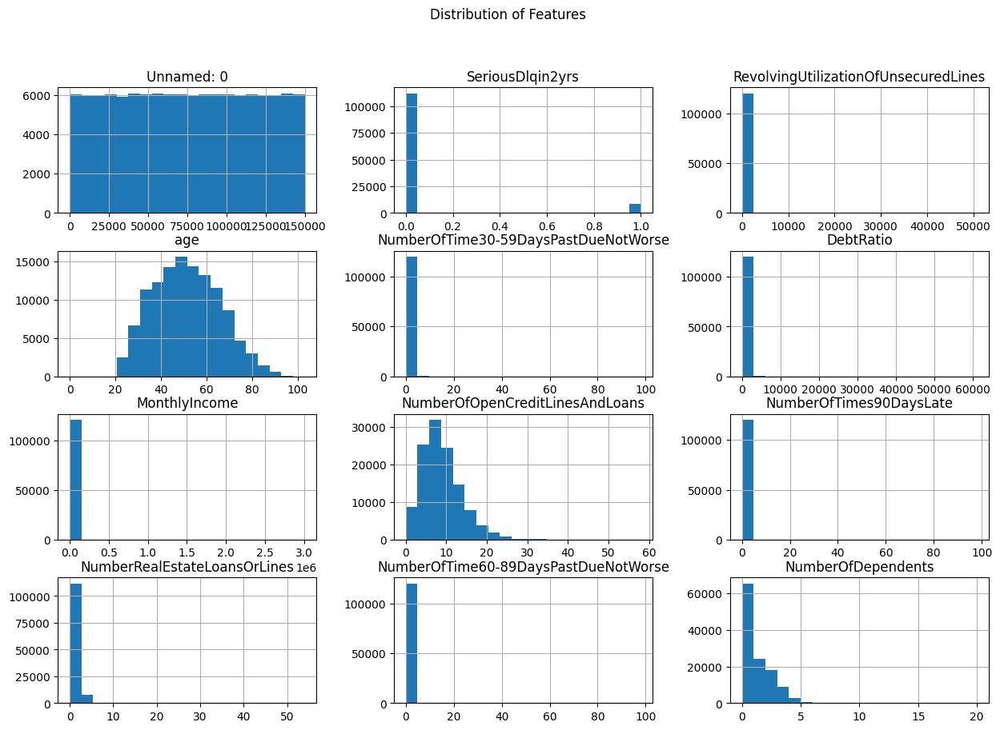

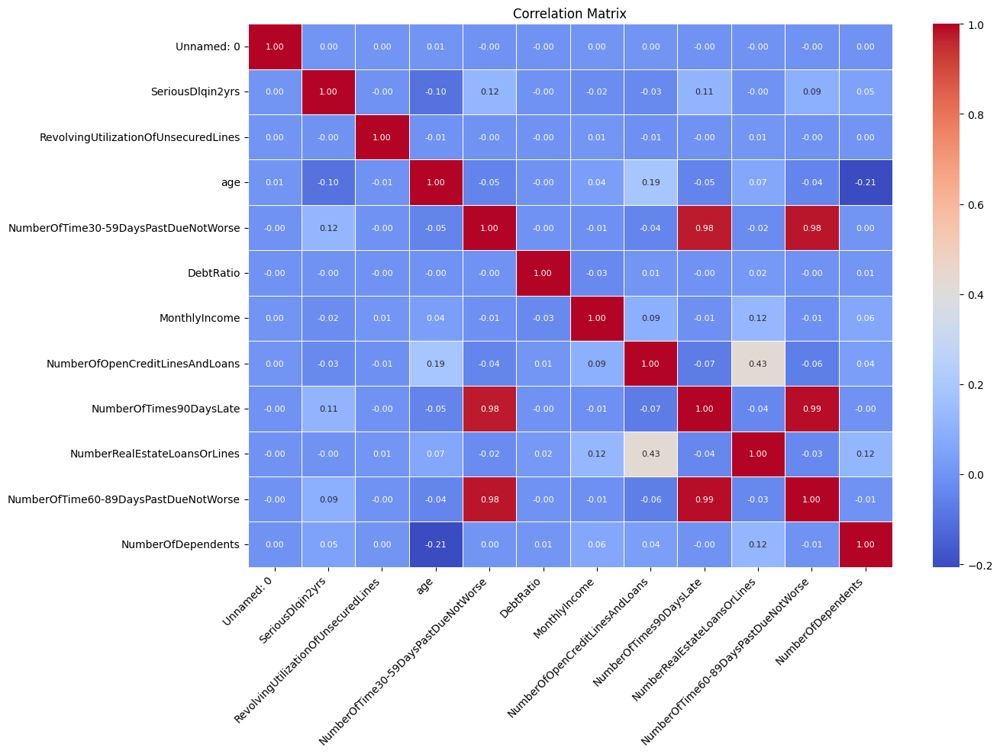

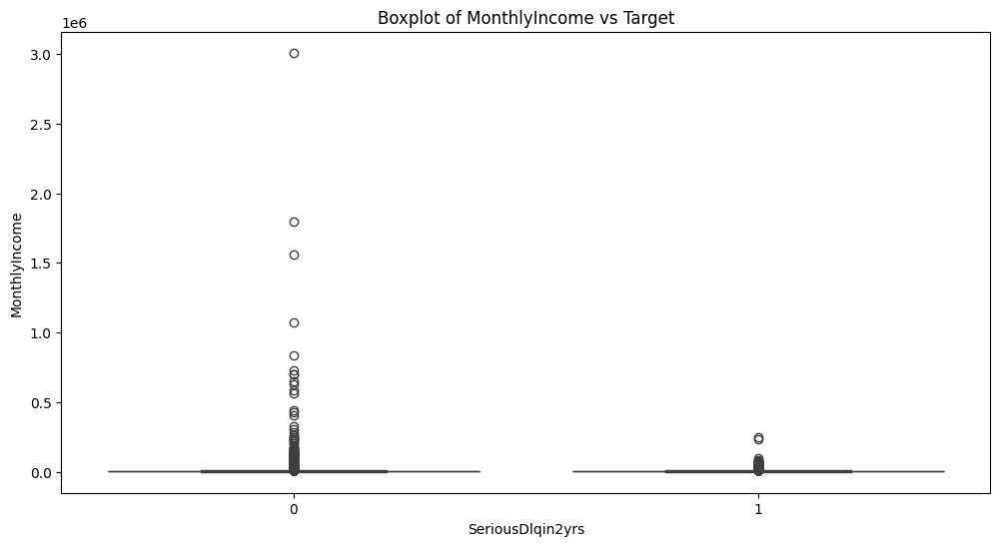

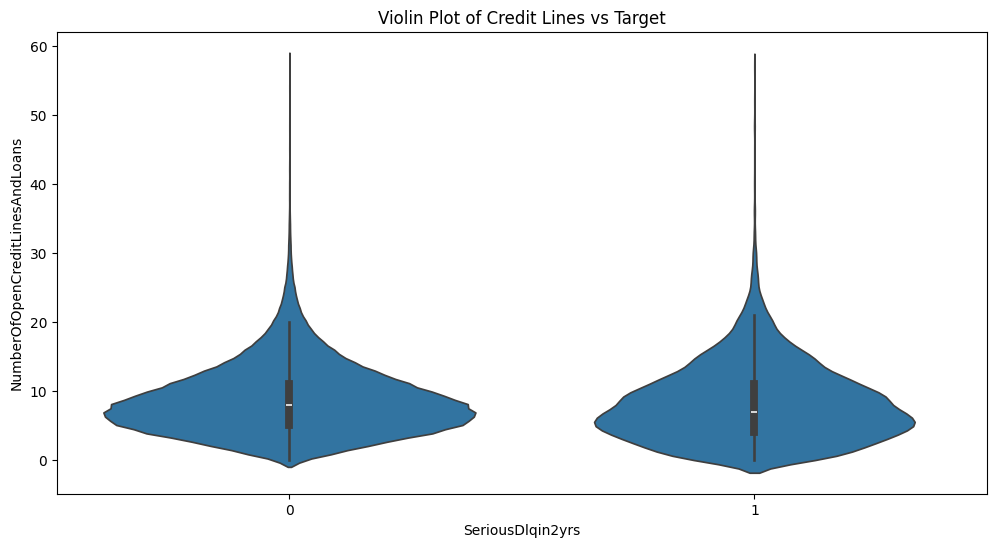

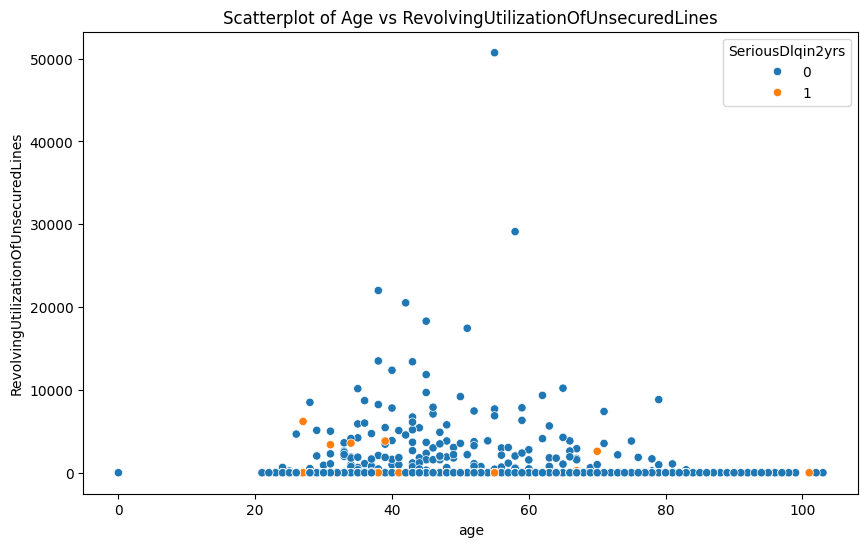

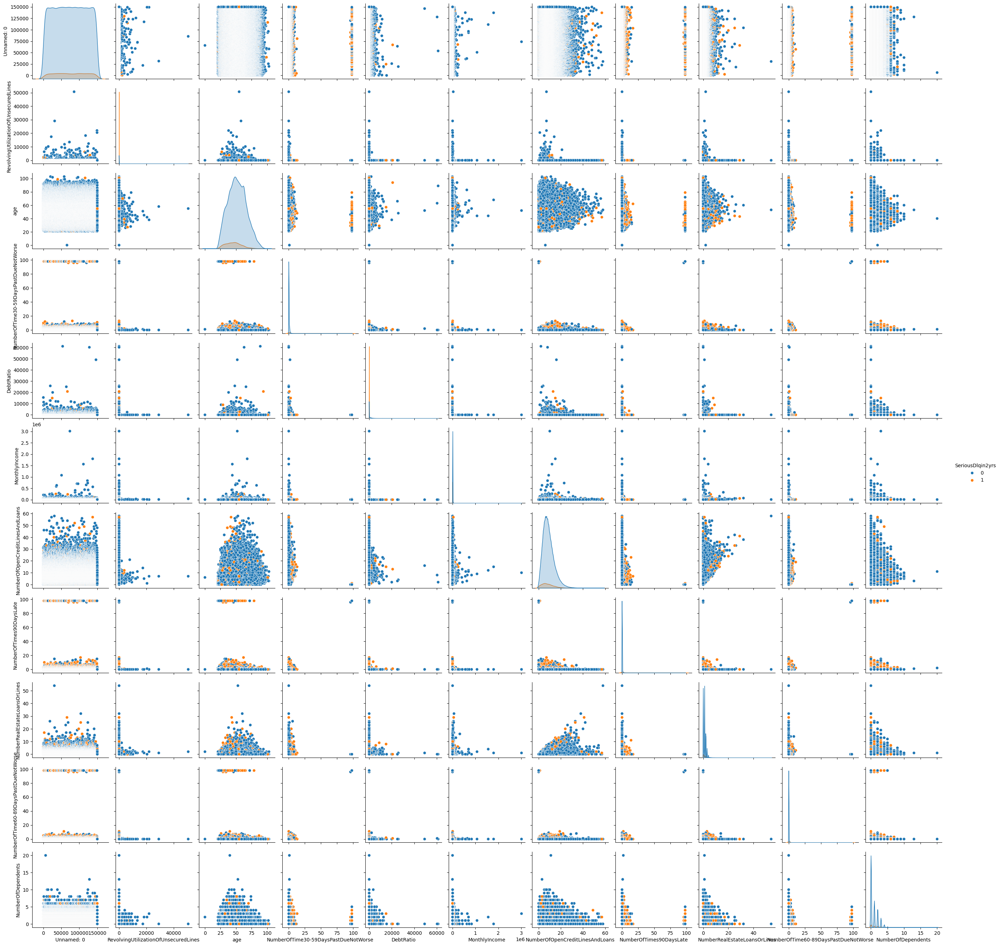

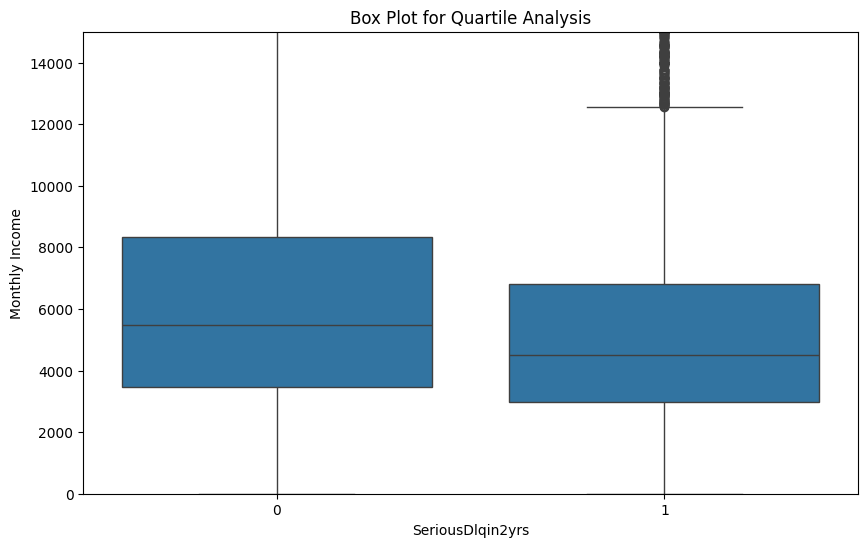

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Load clean dataset
file_path = 'cs-training.csv'
try:
    credit_cleaned = pd.read_csv(file_path)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Dataset file not found. Ensure the file path is correct.")

# Check and preprocess the data
if 'credit_cleaned' in locals():
    # Replace infinite values with NaN and drop all rows with NaN values
    credit_cleaned.replace([np.inf, -np.inf], np.nan, inplace=True)
    credit_cleaned.dropna(inplace=True)

    # Descriptive statistics of the clean data
    print("Descriptive statistics:")
    print(credit_cleaned.describe())

    # Visualizing the Distributions of Each Feature with Histograms
    credit_cleaned.hist(bins=20, figsize=(15,10))
    plt.suptitle('Distribution of Features')
    plt.show()

    # Correlation Analysis and Heatmap
    correlation_matrix = credit_cleaned.corr()
    plt.figure(figsize=(14, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
    plt.title('Correlation Matrix')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    ### Specific visualization of relationships between Features and Target

    # These Boxplot and Violin plot show the distribution of 2 key features in relation to the target variable, revealing any significant differences in distributions across the target classes

    # Boxplot of 'MonthlyIncome' vs Target
    plt.figure(figsize=(12,6))
    sns.boxplot(x='SeriousDlqin2yrs', y='MonthlyIncome', data=credit_cleaned)
    plt.title('Boxplot of MonthlyIncome vs Target')
    plt.show()

    # Violin plot of 'NumberOfOpenCreditLinesAndLoans' vs Target
    plt.figure(figsize=(12,6))
    sns.violinplot(x='SeriousDlqin2yrs', y='NumberOfOpenCreditLinesAndLoans', data=credit_cleaned)
    plt.title('Violin Plot of Credit Lines vs Target')
    plt.show()

    # Scatterplot and pair plots might help visualize the spread of these features across target classes, which might help us to understand patterns and separation that might help classification

    # Scatterplot between age and RevolvingUtilizationOfUnsecuredLines
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='age', y='RevolvingUtilizationOfUnsecuredLines', hue='SeriousDlqin2yrs', data=credit_cleaned)
    plt.title('Scatterplot of Age vs RevolvingUtilizationOfUnsecuredLines')
    plt.show()

    # Pair Plot for Overall Relationship Visualization
    sns.pairplot(credit_cleaned, hue='SeriousDlqin2yrs', diag_kind='kde')
    plt.show()

    # Box Plot for Quartile Analysis, shows the distribution of 'Monthly Income against the target'
    plt.figure(figsize=(10,6))
    sns.boxplot(data=credit_cleaned, x='SeriousDlqin2yrs', y='MonthlyIncome')
    plt.title("Box Plot for Quartile Analysis")
    plt.xlabel("SeriousDlqin2yrs")
    plt.ylabel("Monthly Income")
    plt.ylim(0, 15000)
    plt.show()

else:
    print("The script cannot proceed without the dataset.")


###Outlier Detection Using Boxplots

Dataset loaded successfully.

Descriptive statistics:
          Unnamed: 0  SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines  \
count  120269.000000     120269.000000                         120269.000000   
mean    75026.012514          0.069486                              5.899873   
std     43286.029117          0.254280                            257.040685   
min         1.000000          0.000000                              0.000000   
25%     37678.000000          0.000000                              0.035084   
50%     74969.000000          0.000000                              0.177282   
75%    112494.000000          0.000000                              0.579428   
max    150000.000000          1.000000                          50708.000000   

                 age  NumberOfTime30-59DaysPastDueNotWorse      DebtRatio  \
count  120269.000000                         120269.000000  120269.000000   
mean       51.289792                              0.381769      26.5987

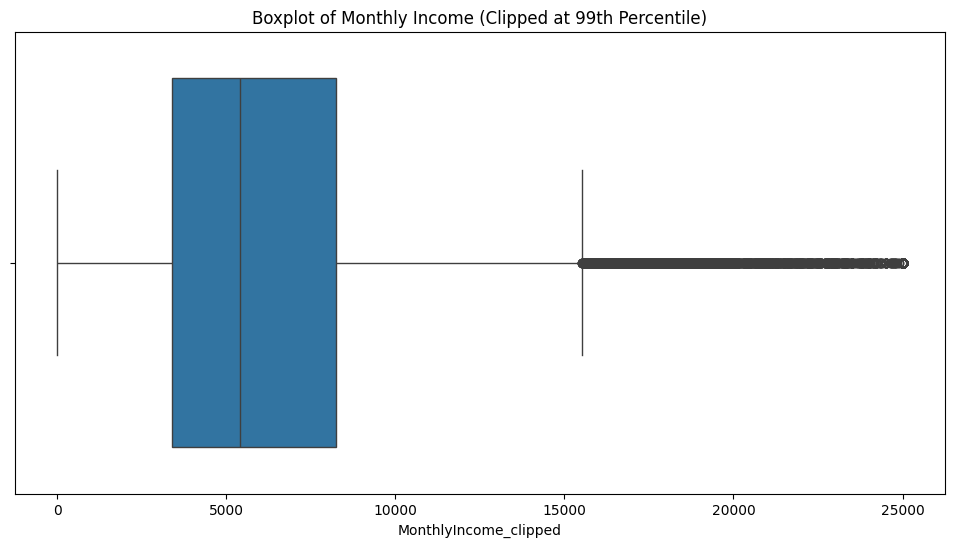

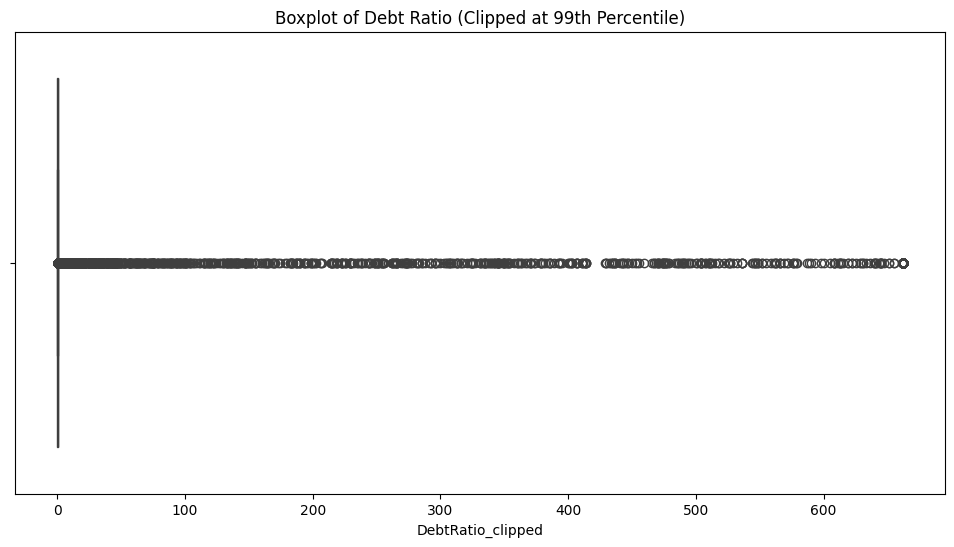

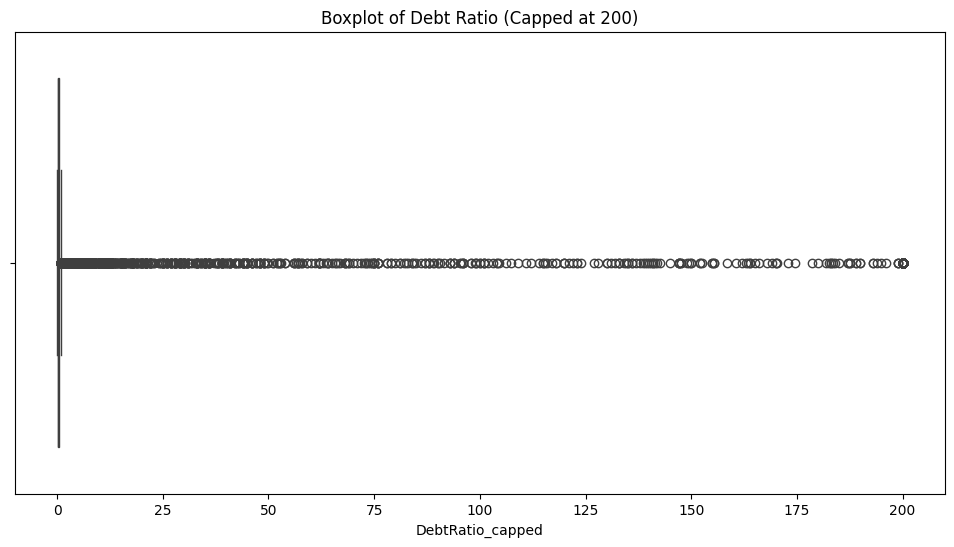

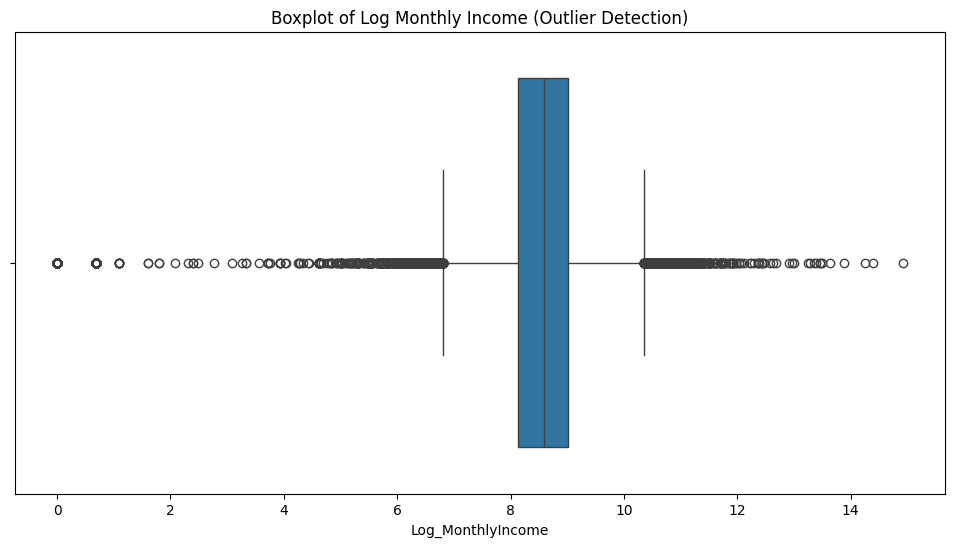

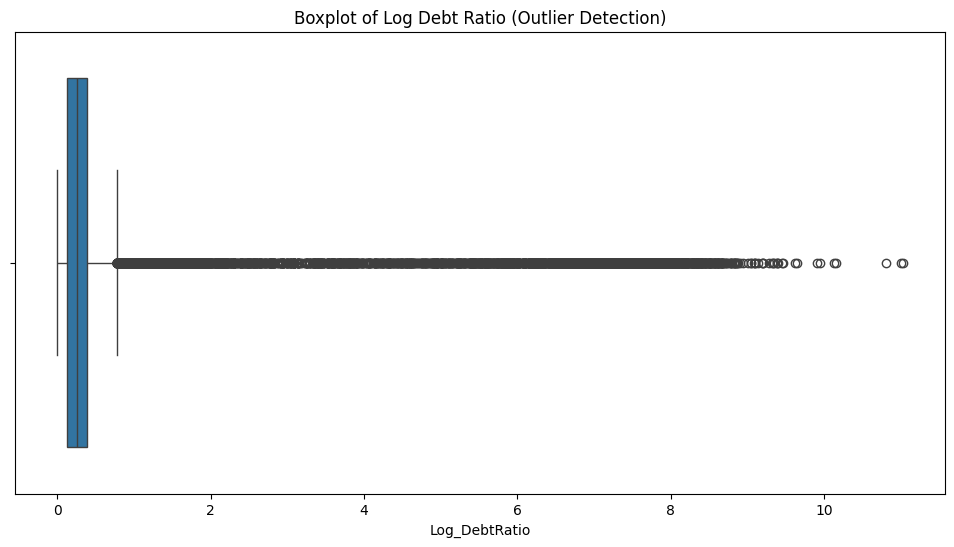


Number of records after removing outliers: 108262


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset
file_path = 'cs-training.csv'
try:
    credit_data = pd.read_csv(file_path)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Dataset file not found. Ensure the file path is correct.")

# Check and preprocess the data
if 'credit_data' in locals():
    # Replace infinite values with NaN and drop all rows with NaN values
    credit_data.replace([np.inf, -np.inf], np.nan, inplace=True)
    credit_data.dropna(inplace=True)

    # Descriptive Statistics of each feature
    print("\nDescriptive statistics:")
    print(credit_data.describe())

    #Function to detect outliers using the IQR method
    def detect_outliers(data, column):
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
        print(f"\nOutliers detected in '{column}': {len(outliers)}")
        return outliers

    # Number of outlier detected for 'MonthlyIncome' and 'DebtRatio'
    monthly_income_outliers = detect_outliers(credit_data, 'MonthlyIncome')
    debt_ratio_outliers = detect_outliers(credit_data, 'DebtRatio')

    # Clip 'MonthlyIncome' and 'DebtRatio' at the 99th percentile for better visualization
    credit_data['MonthlyIncome_clipped'] = credit_data['MonthlyIncome'].clip(upper=credit_data['MonthlyIncome'].quantile(0.99))
    credit_data['DebtRatio_clipped'] = credit_data['DebtRatio'].clip(upper=credit_data['DebtRatio'].quantile(0.99))

    ## Boxplots of features clipped at 99th percentile

    # Boxplot for 'MonthlyIncome' with x-axis limit
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=credit_data, x='MonthlyIncome_clipped')
    plt.title('Boxplot of Monthly Income (Clipped at 99th Percentile)')
    plt.show()

    # Boxplot for 'DebtRatio' with x-axis limit
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=credit_data, x='DebtRatio_clipped')
    plt.title('Boxplot of Debt Ratio (Clipped at 99th Percentile)')
    plt.show()

    ## Cap DebtRatio at a maximum value of 200

    credit_data['DebtRatio_capped'] = credit_data['DebtRatio'].clip(upper=200)

    # Boxplot for 'DebtRatio' after this further capping
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=credit_data, x='DebtRatio_capped')
    plt.title('Boxplot of Debt Ratio (Capped at 200)')
    plt.show()

    #Log Transformation for visualization purposes
    credit_data['Log_MonthlyIncome'] = np.log1p(credit_data['MonthlyIncome'])
    credit_data['Log_DebtRatio'] = np.log1p(credit_data['DebtRatio'])

    # Boxplot after log transformation for 'MonthlyIncome' and 'DebtRatio'
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=credit_data, x='Log_MonthlyIncome')
    plt.title('Boxplot of Log Monthly Income (Outlier Detection)')
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=credit_data, x='Log_DebtRatio')
    plt.title('Boxplot of Log Debt Ratio (Outlier Detection)')
    plt.show()

    # Function that removes outliers from the data for further analysis
    def remove_outliers(data, column):
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Keep only non-outlier rows
        cleaned_data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
        return cleaned_data

    credit_no_outliers = credit_data.copy()
    credit_no_outliers = remove_outliers(credit_no_outliers, 'MonthlyIncome')
    credit_no_outliers = remove_outliers(credit_no_outliers, 'DebtRatio')

    print(f"\nNumber of records after removing outliers: {len(credit_no_outliers)}")

else:
    print("The script cannot proceed without the dataset.")


###T-SNE Visualization

Dataset loaded successfully.


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


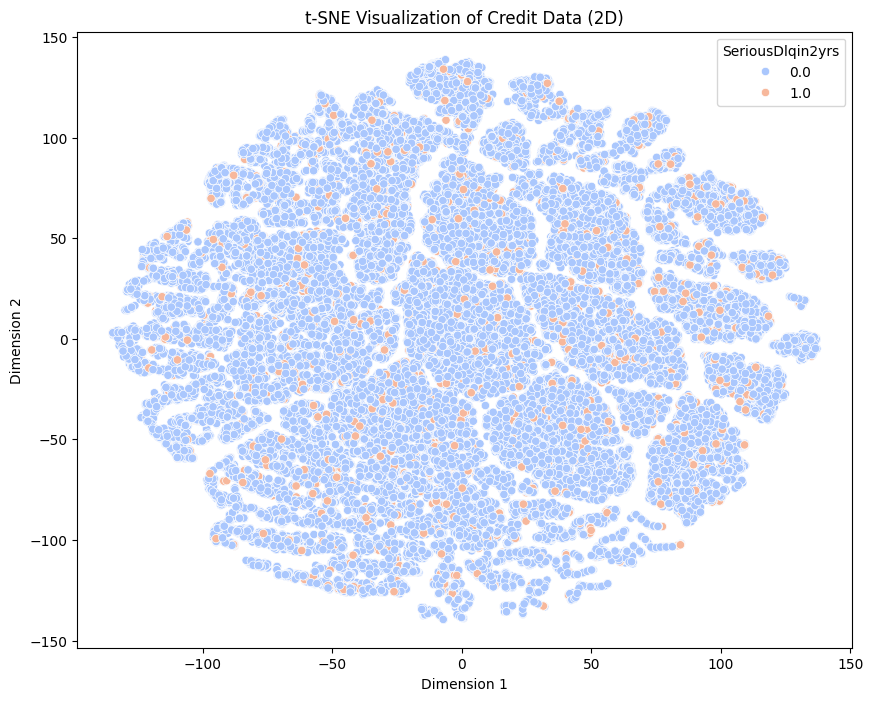

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Load dataset
file_path = 'cs-training.csv'
try:
    credit_data = pd.read_csv(file_path)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Dataset file not found. Ensure the file path is correct.")

# Check and preprocess the data
if 'credit_data' in locals():
    # Replace infinite values with NaN and drop rows with NaN values
    credit_data.replace([np.inf, -np.inf], np.nan, inplace=True)
    credit_data.dropna(inplace=True)

    # Select only numerical features for t-SNE
    numerical_features = ['RevolvingUtilizationOfUnsecuredLines', 'age', 'NumberOfTime30-59DaysPastDueNotWorse',
                          'DebtRatio', 'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans',
                          'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines',
                          'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents']


    credit_numerical = credit_data[numerical_features]

    # Standardize the data to have a mean of 0 and standard deviation of 1
    scaler = StandardScaler()
    credit_scaled = scaler.fit_transform(credit_numerical)

    # t-SNE for dimensionality reduction
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)  # n_components=2 for 2D visualization
    tsne_results = tsne.fit_transform(credit_scaled)

    # Create a DataFrame for t-SNE results
    tsne_df = pd.DataFrame(data=tsne_results, columns=['Dimension 1', 'Dimension 2'])

    # Add the target variable to visualize clusters
    tsne_df['SeriousDlqin2yrs'] = credit_data['SeriousDlqin2yrs']

    # Visualize the t-SNE results using a scatterplot
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='SeriousDlqin2yrs', data=tsne_df, palette='coolwarm', legend='full')
    plt.title('t-SNE Visualization of Credit Data (2D)')
    plt.show()

else:
    print("The script cannot proceed without the dataset.")


**Conclusions on data analysis**

From our data analysis, we found that we are dealing with a binary and fairly complex dataset. The main challenges we addressed, and partially dealt with, include


*   Clear Imbalance Between the Two Classes: Most individuals belong to class 0. We plan to address this imbalance using SMOTE
*   Disparity in Feature Magnitudes: We will resolve this issue by applying scaling techniques
*   Skewness in Certain Features: Features like 'RevolvingUtilizationOfUnsecuredLines' and 'DebtRatio' were skewed, but we handled this by applying log transformation
*   Presence of Outliers: Some outliers, possibly due to measurement errors or unique individuals, were clipped. However, we will need to remain cautious as we proceed. Notably, 'Monthly Income' and 'Debt Ratio' exhibit many outliers, and since these are important features, we must ensure they are properly handled

Considerations about feature include:


*   A high Debt Ratio suggests financial distress and may have a strong correlation with the target variable.
*   NumberOfOpenCreditLinesAndLoans appears to show non-linear relationships with delinquency risk. Having too many open lines could be risky, while too few may indicate limited credit experience. This non-linearity could make this feature well-suited for decision trees.
*   As anticipated, Monthly Income is a key feature for predicting financial distress, as shown in the boxplots against the target variable
*   eatures like NumberOfTime60-89DaysPastDueNotWorse indicate financial distress very clearly

###Alternative dataset

Similar to our main data set we applied the similar methods as we use median values for each feature to replace the missing values. Using median skewed the distribution and caused less distortion with skewness or outliers, preserving the central tendency closer to the actual "middle" of the data.

Dataset loaded successfully.

First 5 rows of the dataset:

    Loan_ID Gender Married Dependents     Education Self_Employed  \
0  LP001002   Male      No          0      Graduate            No   
1  LP001003   Male     Yes          1      Graduate            No   
2  LP001005   Male     Yes          0      Graduate           Yes   
3  LP001006   Male     Yes          0  Not Graduate            No   
4  LP001008   Male      No          0      Graduate            No   

   ApplicantIncome  CoapplicantIncome  LoanAmount  Loan_Amount_Term  \
0             5849                0.0         NaN             360.0   
1             4583             1508.0       128.0             360.0   
2             3000                0.0        66.0             360.0   
3             2583             2358.0       120.0             360.0   
4             6000                0.0       141.0             360.0   

   Credit_History Property_Area Loan_Status  
0             1.0         Urban           Y  
1     

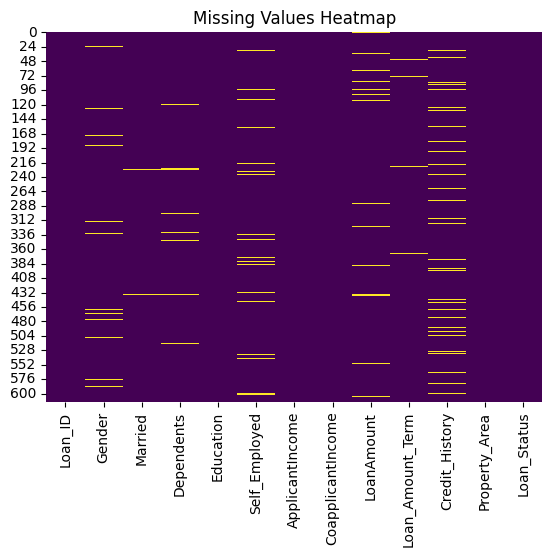

<ipython-input-9-b18af6ecfce8>:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  loan_data[column].fillna(loan_data[column].mode()[0], inplace=True)  # Impute categorical columns
<ipython-input-9-b18af6ecfce8>:40: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doin


Missing values after imputation:

Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64


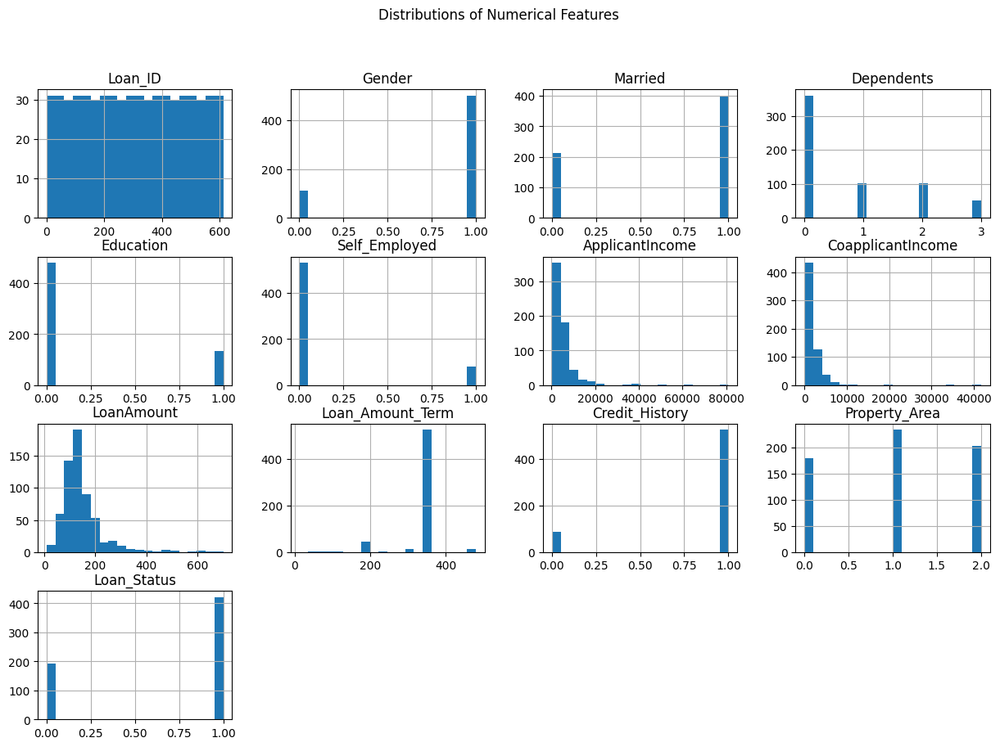

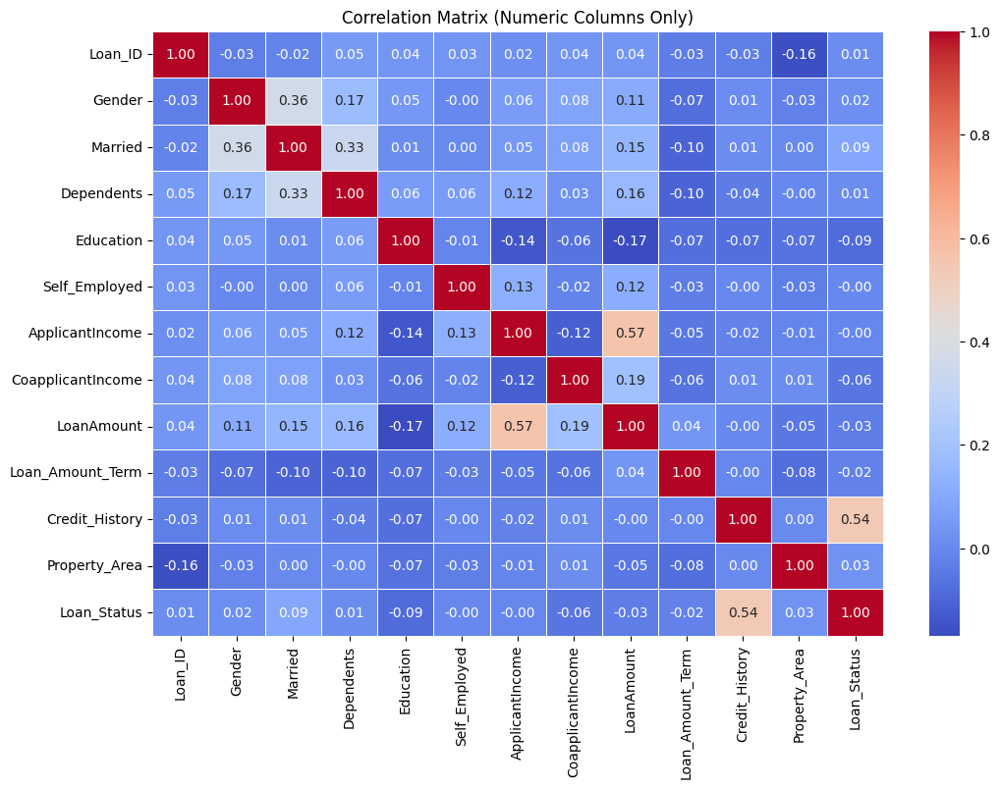

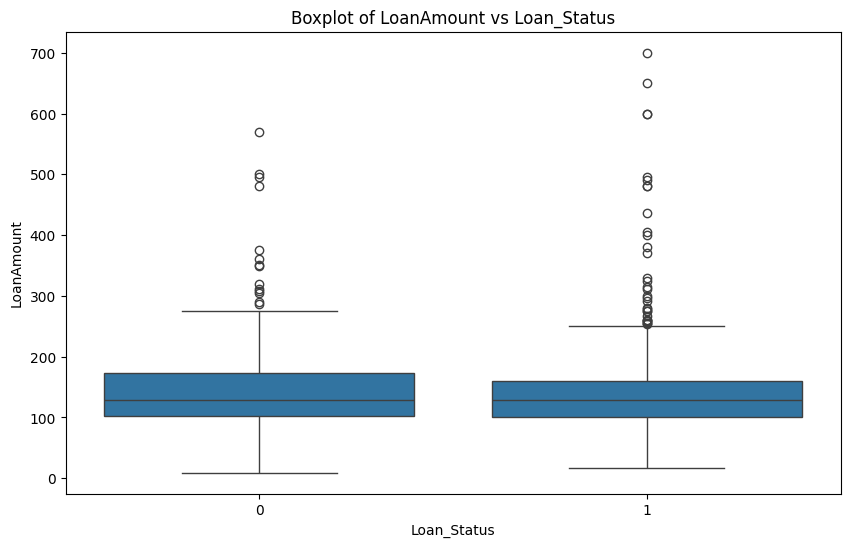


Outliers detected in 'LoanAmount': 41
Number of records after removing outliers: 573


<ipython-input-9-b18af6ecfce8>:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_cleaned[numerical_cols] = scaler.fit_transform(loan_data_cleaned[numerical_cols])
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


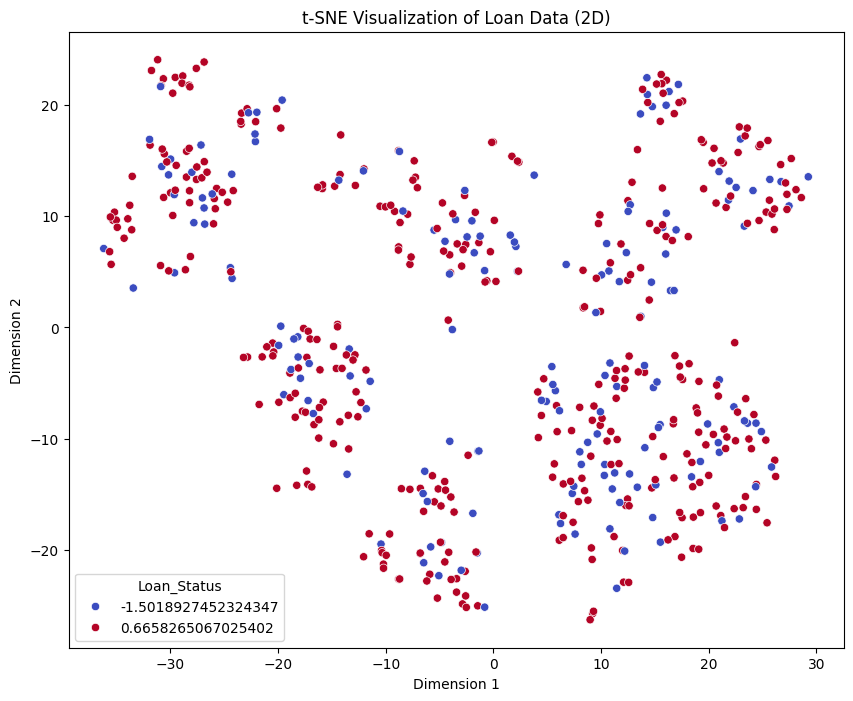

In [ ]:
# In this part of the code, we replicate every step for data visualization with the alternative dataset we chose

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.manifold import TSNE

# Load dataset
file_path = 'Loan_dataset_train.csv'
try:
    loan_data = pd.read_csv(file_path)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Dataset file not found. Ensure the file path is correct.")

# Check and preprocess the data
if 'loan_data' in locals():
    #Data Exploration (Display first five columns, info etc.)
    print("\nFirst 5 rows of the dataset:\n")
    print(loan_data.head())  # Display the first few rows

    print("\nBasic Info about the dataset:\n")
    print(loan_data.info())  # Checking data types and missing values

    print("\nDescriptive statistics:\n")
    print(loan_data.describe())  # Summary statistics for numerical features

    # Visualize missing values
    sns.heatmap(loan_data.isnull(), cbar=False, cmap="viridis")
    plt.title("Missing Values Heatmap")
    plt.show()

    ## Data Cleaning

    # Handle missing values by imputing with median for numerical and mode for categorical variables
    for column in loan_data.columns:
        if loan_data[column].dtype == 'object':
            loan_data[column].fillna(loan_data[column].mode()[0], inplace=True)
        else:
            loan_data[column].fillna(loan_data[column].median(), inplace=True)

    # Check all the missing values are filled
    print("\nMissing values after imputation:\n")
    print(loan_data.isnull().sum())

    ##Encoding Categorical Variables

    # Label Encoding for categorical variables
    categorical_cols = loan_data.select_dtypes(include=['object']).columns
    label_encoders = {}
    for col in categorical_cols:
        le = LabelEncoder()
        loan_data[col] = le.fit_transform(loan_data[col])
        label_encoders[col] = le

    ## Data Visualization

    # Visualize distributions for numerical features with histograms
    loan_data.hist(bins=20, figsize=(15, 10))
    plt.suptitle('Distributions of Numerical Features')
    plt.show()

    # Correlation Matrix and Heatmap withou non-numeric columns
    numerical_cols = loan_data.select_dtypes(include=[np.number])  # Select only numeric columns
    plt.figure(figsize=(12, 8))
    correlation_matrix = numerical_cols.corr()  # Correlation only on numeric columns
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title('Correlation Matrix (Numeric Columns Only)')
    plt.show()

    # Boxplot to analyze target variable's relationship with 'LoanAmount'
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Loan_Status', y='LoanAmount', data=loan_data)
    plt.title('Boxplot of LoanAmount vs Loan_Status')
    plt.show()

    # Function for Outlier Detection and Removal
    def detect_outliers(data, column):
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
        return lower_bound, upper_bound, outliers

    # Detect outliers in 'LoanAmount'
    loan_lower, loan_upper, loan_outliers = detect_outliers(loan_data, 'LoanAmount')
    print(f"\nOutliers detected in 'LoanAmount': {len(loan_outliers)}")

    # Remove outliers from LoanAmount
    loan_data_cleaned = loan_data[(loan_data['LoanAmount'] >= loan_lower) & (loan_data['LoanAmount'] <= loan_upper)]
    print(f"Number of records after removing outliers: {len(loan_data_cleaned)}")

    ##Feature Scaling
    # Scale numerical features using StandardScaler
    scaler = StandardScaler()
    numerical_cols = loan_data_cleaned.select_dtypes(include=[np.number]).columns.tolist()
    loan_data_cleaned[numerical_cols] = scaler.fit_transform(loan_data_cleaned[numerical_cols])

    ## t-SNE Visualization for Dimensionality Reduction

    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
    tsne_results = tsne.fit_transform(loan_data_cleaned.drop(columns='Loan_Status'))

    # Creating a DataFrame for t-SNE results
    tsne_df = pd.DataFrame(data=tsne_results, columns=['Dimension 1', 'Dimension 2'])
    tsne_df['Loan_Status'] = loan_data_cleaned['Loan_Status']

    # Visualizing t-SNE results
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Loan_Status', data=tsne_df, palette='coolwarm', legend='full')
    plt.title('t-SNE Visualization of Loan Data (2D)')
    plt.show()

else:
    print("The script cannot proceed without the dataset.")


# **R3 Clustering**

##Clustering in Tabular dataset.

In this section  we did  clustering analysis on a tabular financial dataset, focusing on evaluating and optimizing the K-Means algorithm for customer segmentation. Experiments included varying the number of clusters, using PCA for dimensionality reduction, and calculating metrics like the Elbow Method and Silhouette Score to determine the optimal number of clusters.
Steps were followed before we started experimenting Clustering Algorithms;
1.	Data Preprocessing
2.	Feature Selection and Scaling
3.	Outlier Removal


###Finding an optimal number of clusters

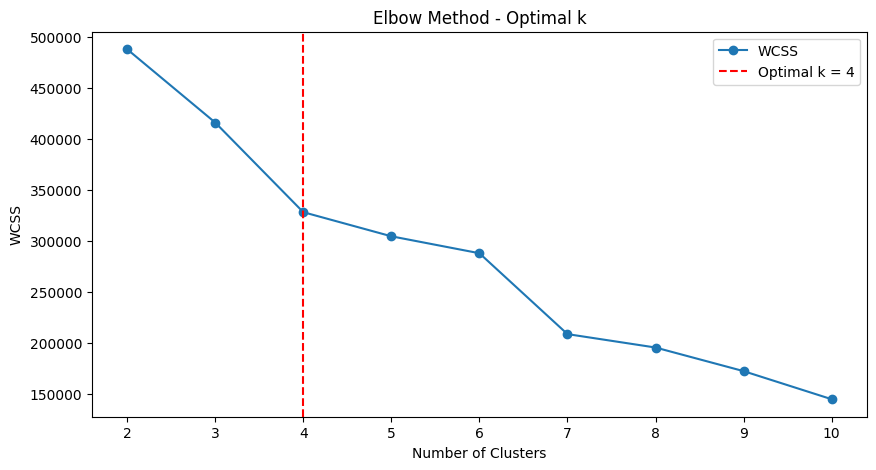

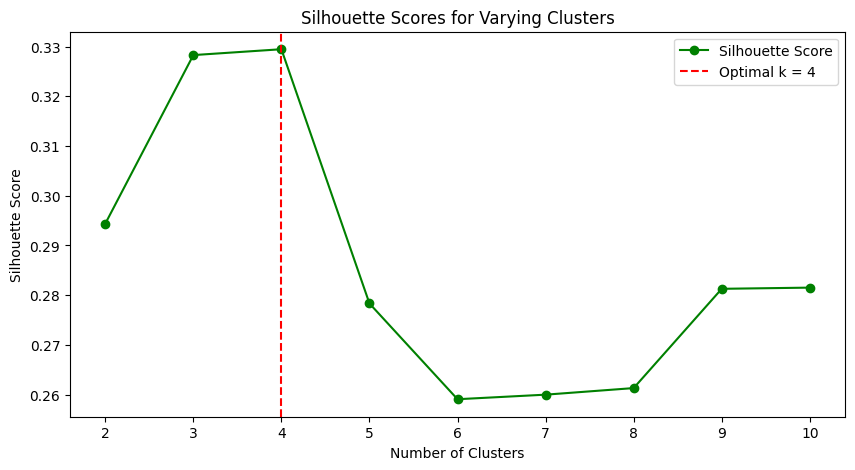

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Load dataset
file_path = 'cs-training.csv'
cs_data = pd.read_csv(file_path)

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
X = cs_data[features].fillna(0)  # Handling missing values

#Scale data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Function Definition for K-means Evaluation
def evaluate_kmeans(X, max_clusters=10, elbow_point=4):
    wcss = []
    silhouette_scores = []

    #Sum of squared distances between points and centroid of their clusters
    for k in range(2, max_clusters+1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        wcss.append(kmeans.inertia_)  # WCSS (Within-Cluster Sum of Squares)

        # Silhouette Score
        cluster_labels = kmeans.predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_scores.append(silhouette_avg)

    # Plot WCSS (Elbow Method)
    plt.figure(figsize=(10, 5))
    plt.plot(range(2, max_clusters+1), wcss, marker='o', label="WCSS")
    plt.axvline(x=elbow_point, color='r', linestyle='--', label=f'Optimal k = {elbow_point}')
    plt.title('Elbow Method - Optimal k')
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.legend()
    plt.show()

    # Plot Silhouette Score
    plt.figure(figsize=(10, 5))
    plt.plot(range(2, max_clusters+1), silhouette_scores, marker='o', label="Silhouette Score", color='green')
    plt.axvline(x=elbow_point, color='r', linestyle='--', label=f'Optimal k = {elbow_point}')
    plt.title('Silhouette Scores for Varying Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.legend()
    plt.show()

# Run the K-means evaluation for Elbow and Silhouette scores
evaluate_kmeans(X_scaled, max_clusters=10, elbow_point=4)


The results for the Elbow method and Silhouette Scores are very clear. The highest Silhouette Score is given with 4 clusters, and Elbow method shows a clear slowing down in it's reduction at the same value, which, until futher expirements, makes it the ideal choice for us

###K means cluster using PCA. Optimal K is 4

K-Means Silhouette Score: 0.3176


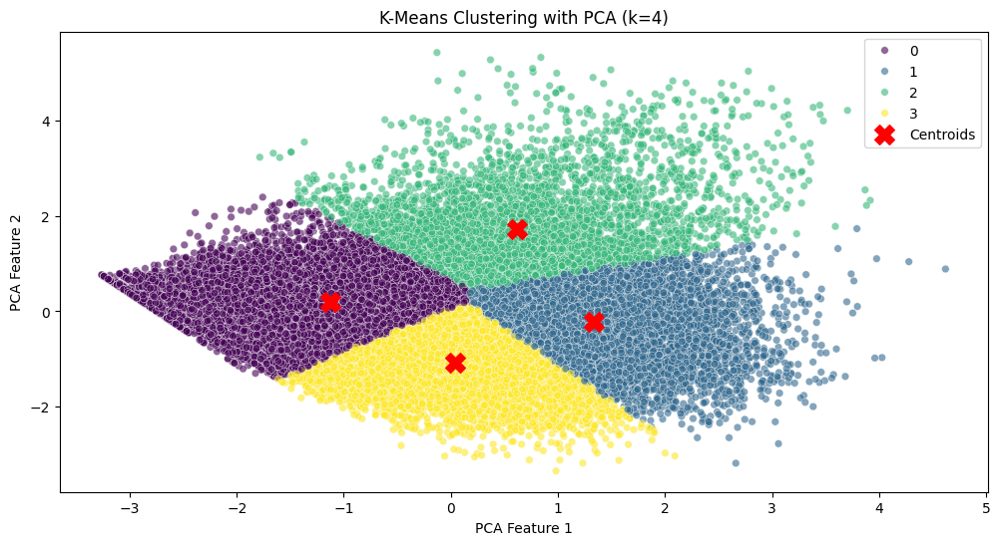

In [ ]:
# our goal here is to reduce the dataset’s dimensionality, in order to make the K-Means clustering more efficient and interpretable

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Load dataset
file_path = 'cs-training.csv'
data = pd.read_csv(file_path)

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
data = data[features].fillna(0)  # Handle missing values

#Remove outliers using IQR
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1
data = data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).any(axis=1)]   #remove any data above Q3 + 1.5 or below Q1 - 1.5

# Use a smaller sample for quicker visualization and results, we chose 30%
data_sampled = data.sample(frac=0.3, random_state=42)

# Scale the data, each features has a mean of 0 and a standard deviattion of 1, so that they all contribute the same
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_sampled)

# Perform PCA to minimize components to 2
pca = PCA(n_components=2, svd_solver='randomized')  # Use randomized solver for faster execution
data_pca = pca.fit_transform(data_scaled)

# Apply MiniBatch K-Means clustering, processes small subsets of data for faster execution
n_clusters = 4  # based on previous analysis
kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=0, batch_size=500, n_init=1)   # each iteration only processes 500 points
kmeans_labels = kmeans.fit_predict(data_pca)

# Compute Silhouette Score
silhouette_avg = silhouette_score(data_pca, kmeans_labels)
print(f"K-Means Silhouette Score: {silhouette_avg:.4f}")

# Visualize the clustered data with centroids
centroids = kmeans.cluster_centers_

plt.figure(figsize=(12, 6))
sns.scatterplot(x=data_pca[:, 0], y=data_pca[:, 1], hue=kmeans_labels, palette='viridis', alpha=0.6, s=30)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.title(f'K-Means Clustering with PCA (k={n_clusters})')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.legend()
plt.show()


###Accuracy of K means clustering

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy import stats

# Load dataset
file_path = 'cs-training.csv'
data = pd.read_csv(file_path)

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
data = data[features].fillna(0)  # Handle missing values

# Scale data to a [0,1] range
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Apply Z-score method to scaled data to remove more aggressive outliers
z_scores = np.abs(stats.zscore(data_scaled))
data_no_outliers = data_scaled[(z_scores < 3).all(axis=1)]

# Perform K-Means Clustering to the new data
n_clusters = 4  # Optimal number of clusters
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, n_init=20, random_state=42)
kmeans_labels = kmeans.fit_predict(data_no_outliers)

# Evaluate clustering performance using three metrics: Silhouette Score, Calinski-Harabasz Index and Davies-Bouldin Score
silhouette_avg = silhouette_score(data_no_outliers, kmeans_labels)
calinski_harabasz = calinski_harabasz_score(data_no_outliers, kmeans_labels)
davies_bouldin = davies_bouldin_score(data_no_outliers, kmeans_labels)

# Print clustering scores
print(f"K-Means Silhouette Score: {silhouette_avg:.4f}")
print(f"K-Means Calinski-Harabasz Score: {calinski_harabasz:.4f}")
print(f"K-Means Davies-Bouldin Score: {davies_bouldin:.4f}")


K-Means Silhouette Score: 0.3583
K-Means Calinski-Harabasz Score: 131706.1919
K-Means Davies-Bouldin Score: 0.8510



1.   Silhouette Score indicates a decent clustering, which might have some
overlapping and could also be perfected
2.   The clusters are compact, as shown in the high Calinski-Harabasz Score

1.   Given the fairly low value in the Davies-Bouldin score, we somehow alleviate the worries about clusters overlapping too much, but there might still be shared boundaries

###Analysis of different clusters and silhouette scores

Explained variance by each component: [0.70957927 0.288253  ]
For n_clusters = 2, the average silhouette_score is: 0.4162


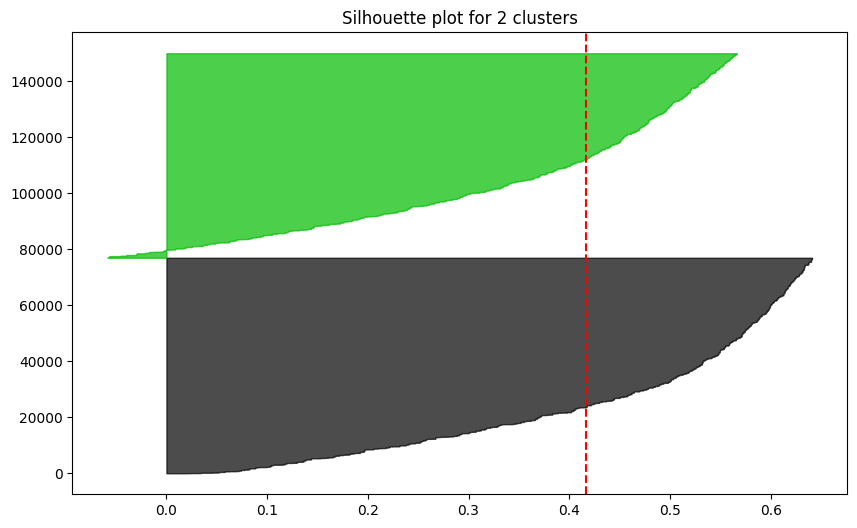

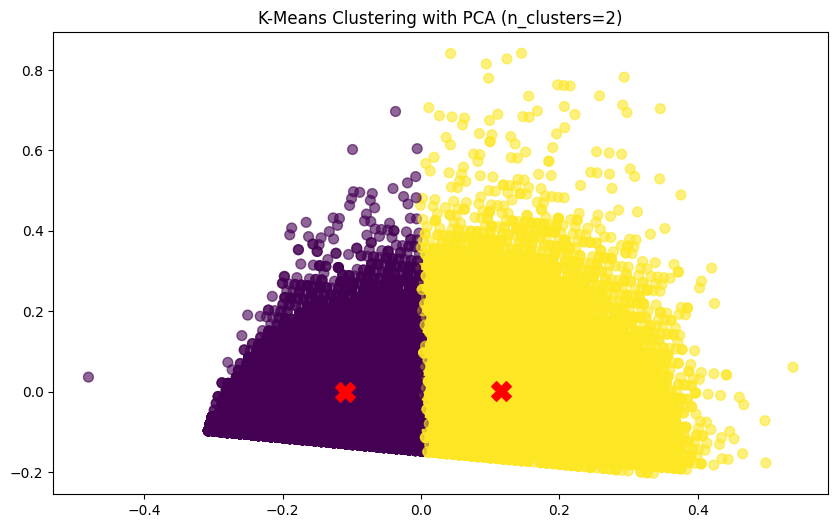

For n_clusters = 3, the average silhouette_score is: 0.3859


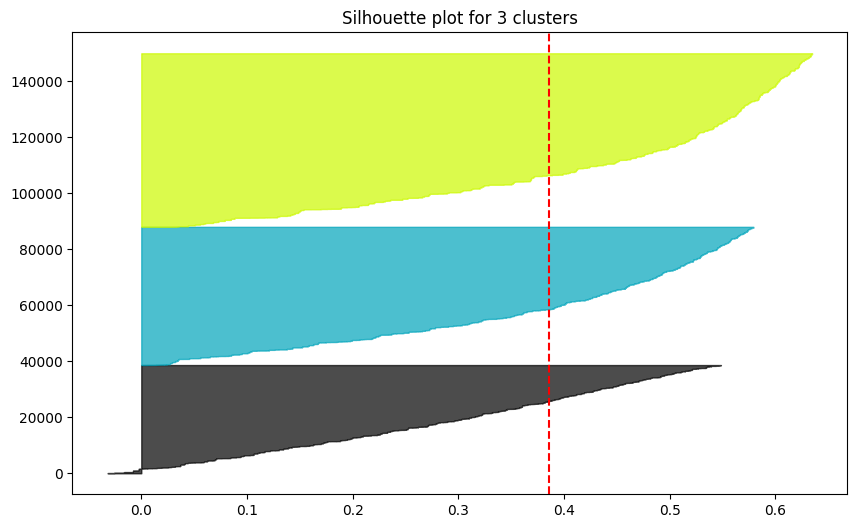

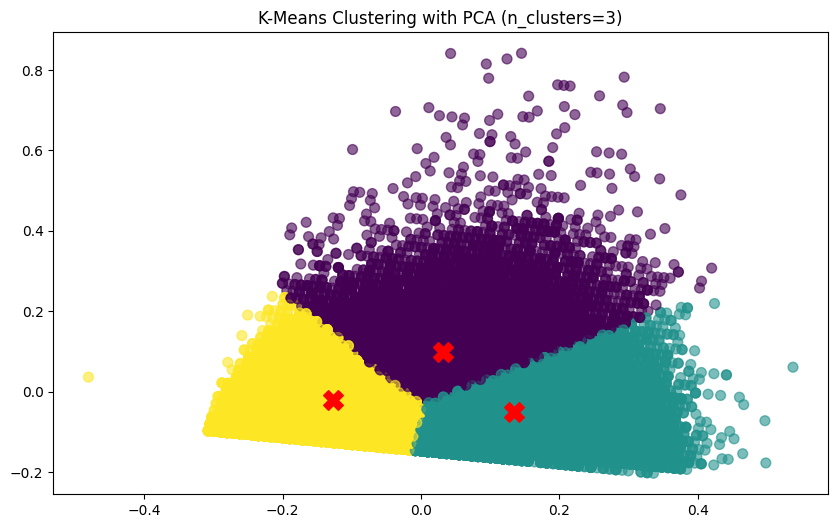

For n_clusters = 4, the average silhouette_score is: 0.3622


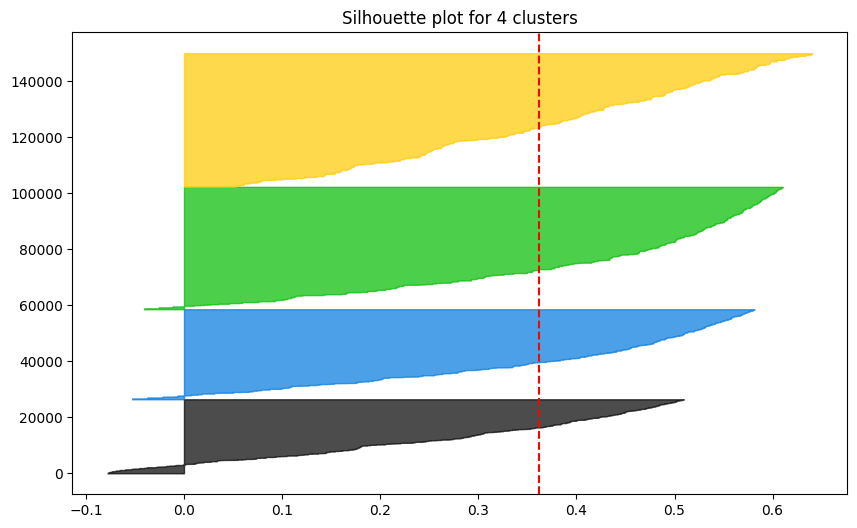

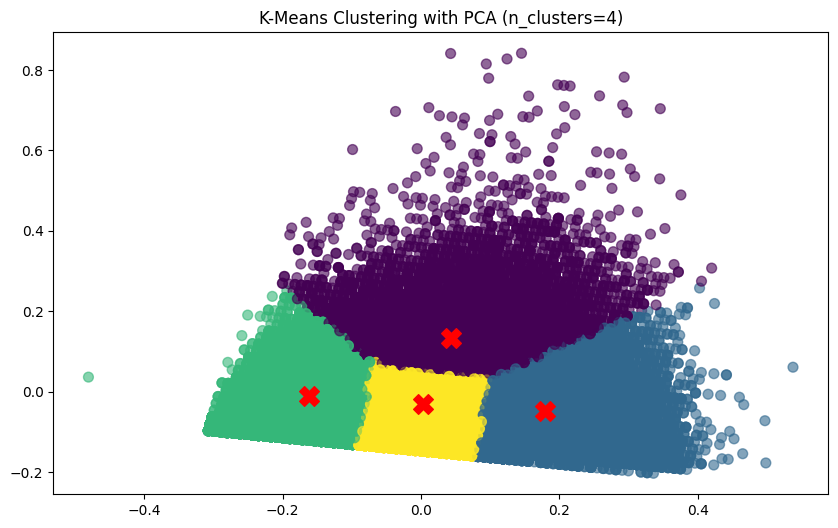

For n_clusters = 5, the average silhouette_score is: 0.3532


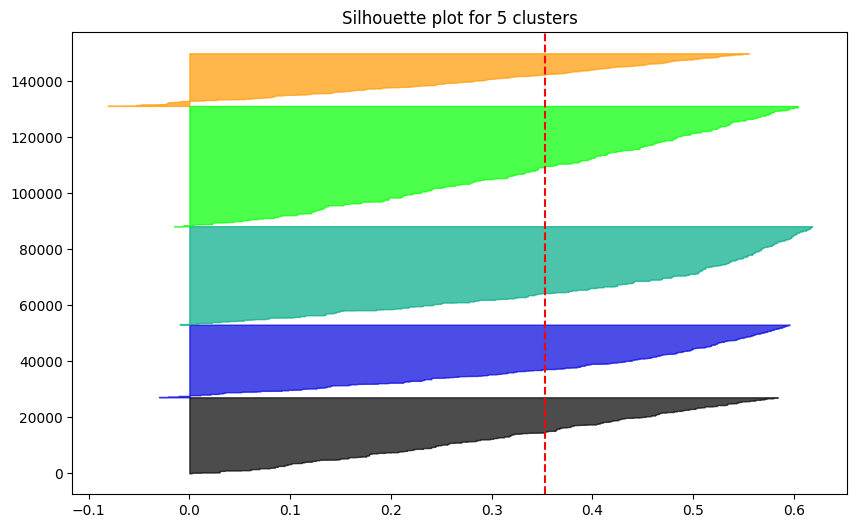

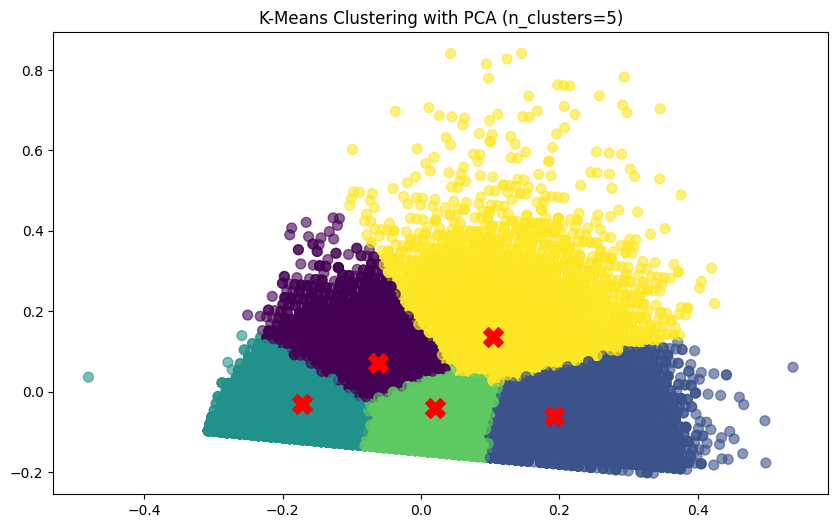

For n_clusters = 6, the average silhouette_score is: 0.3454


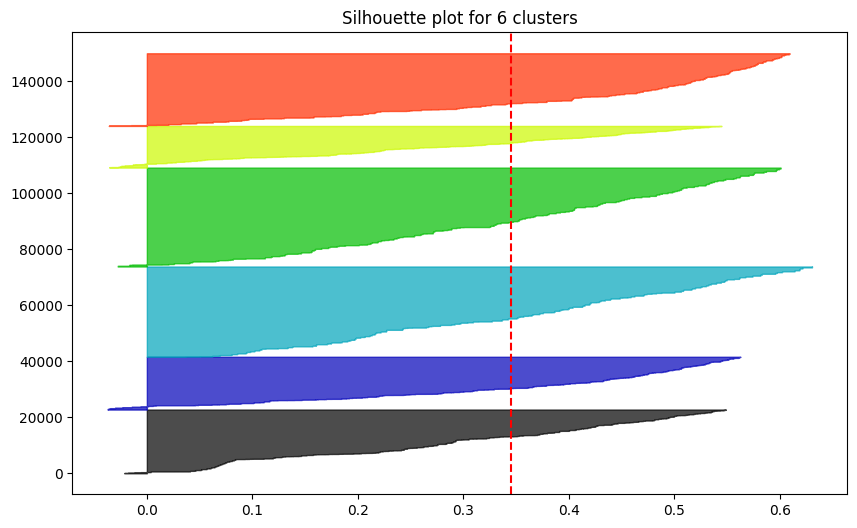

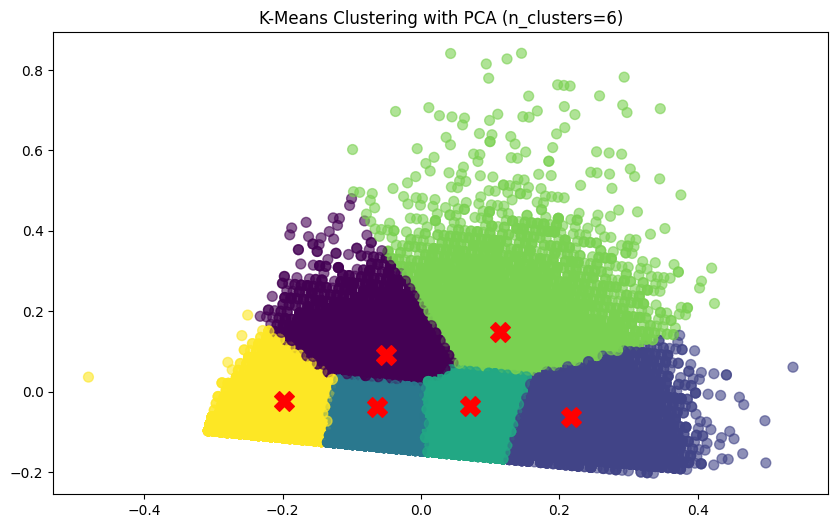

For n_clusters = 7, the average silhouette_score is: 0.3351


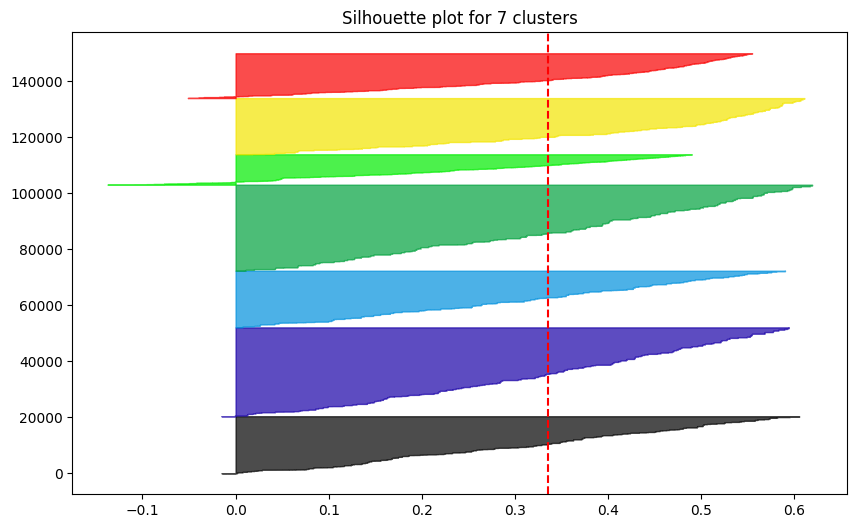

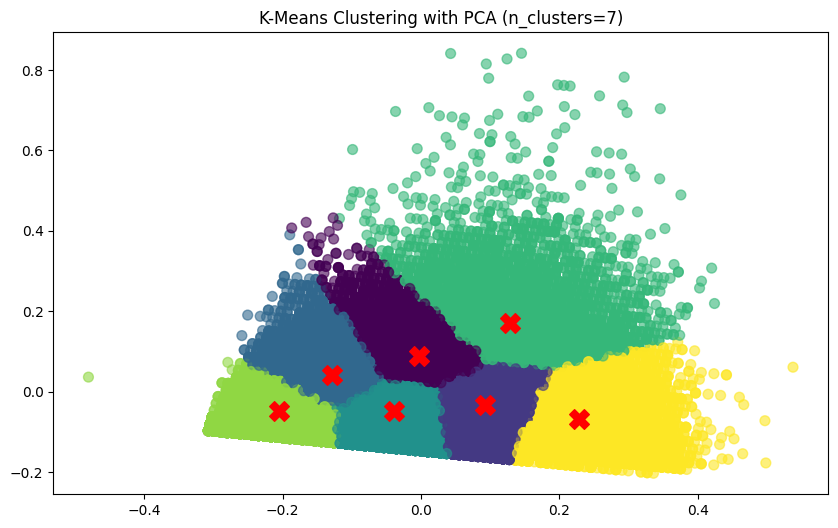

For n_clusters = 8, the average silhouette_score is: 0.3499


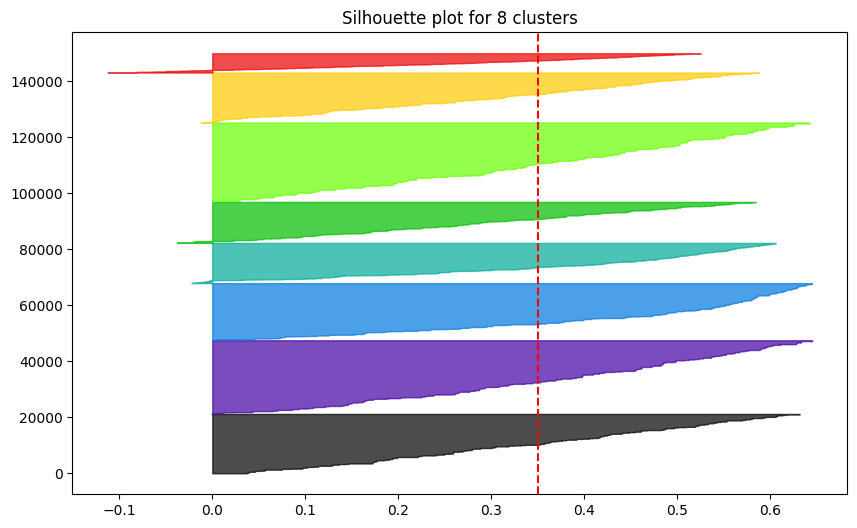

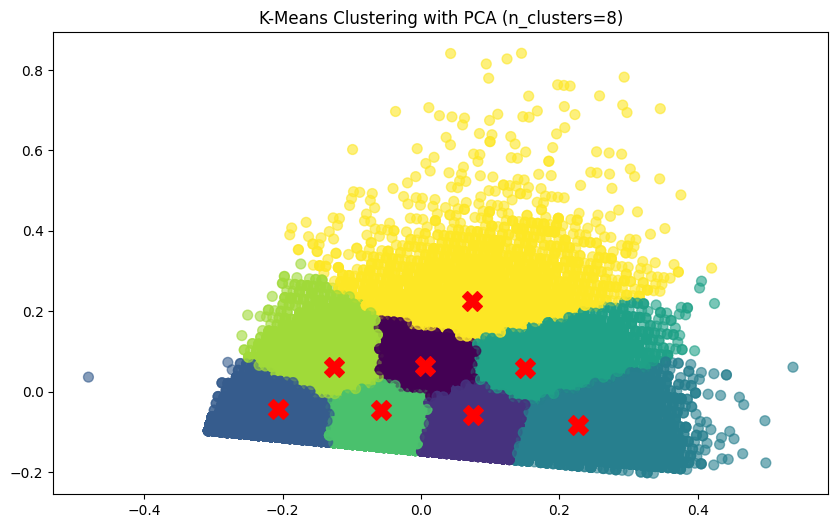

For n_clusters = 9, the average silhouette_score is: 0.3305


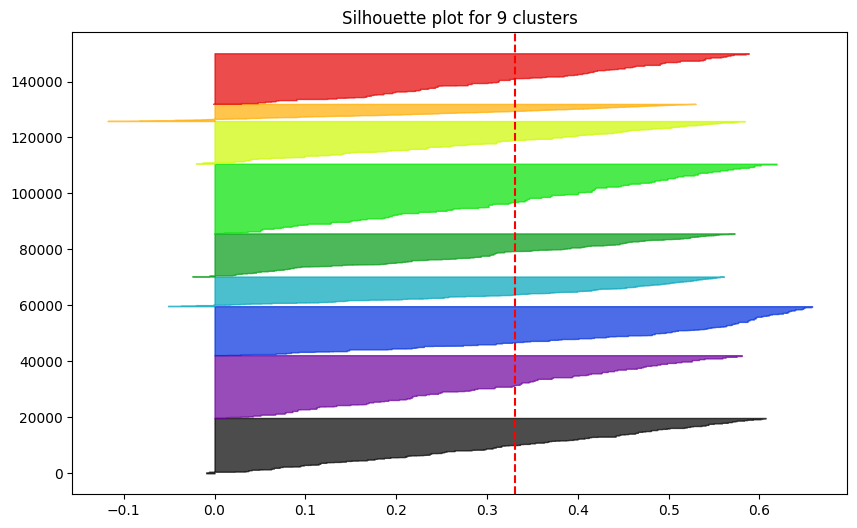

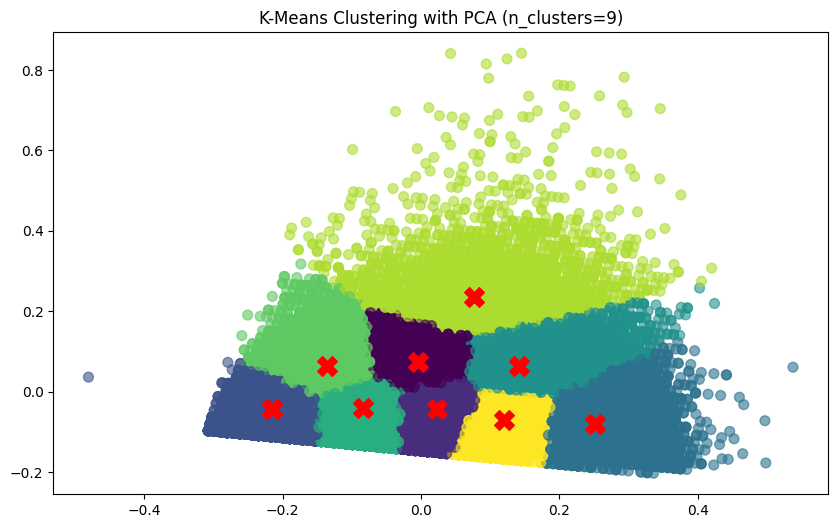

For n_clusters = 10, the average silhouette_score is: 0.3344


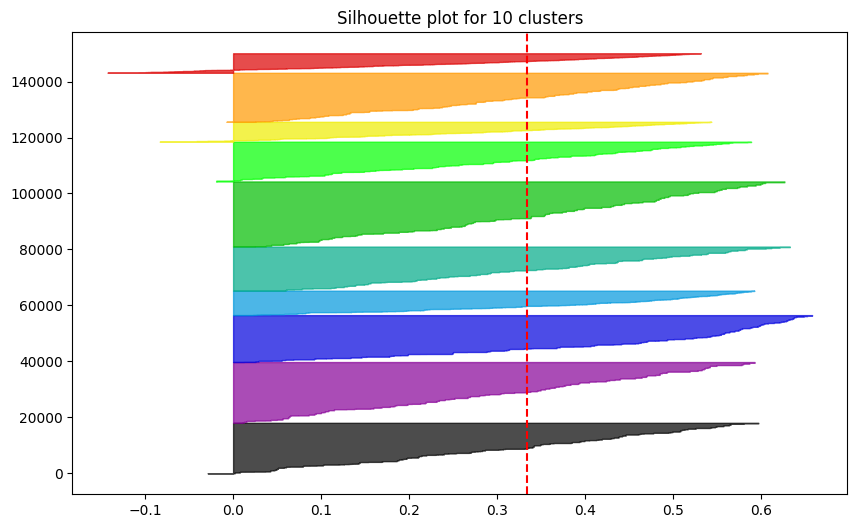

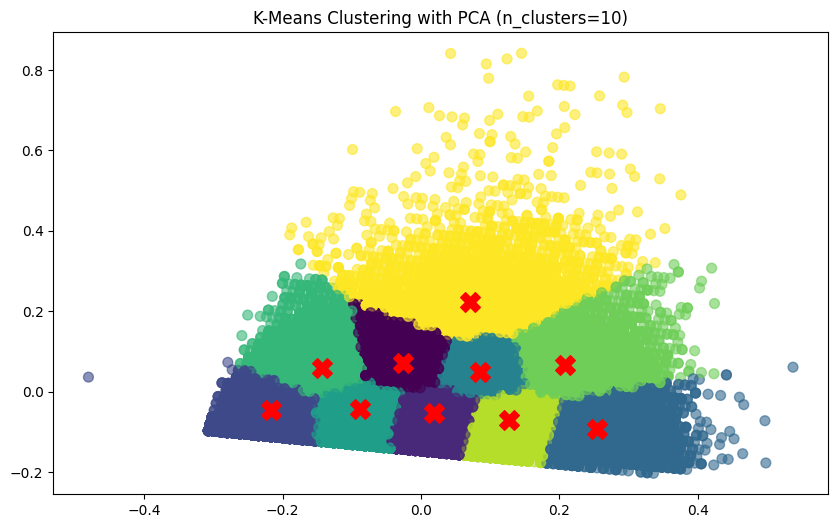

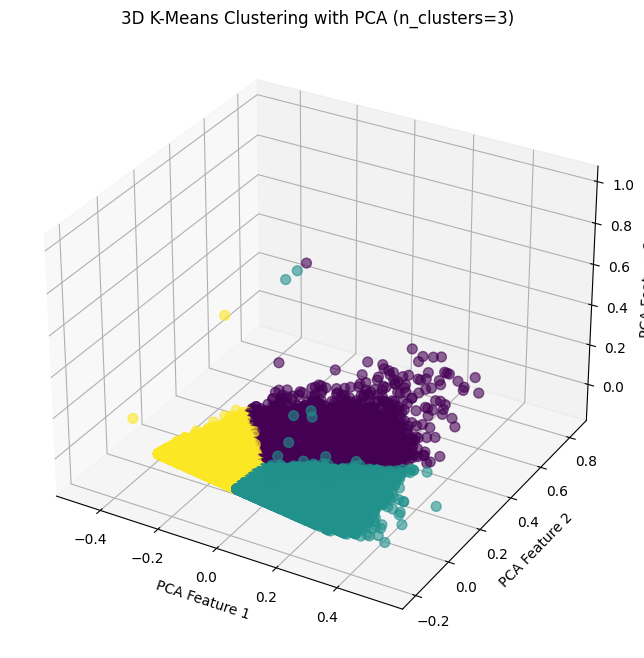

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# Load the dataset
file_path = 'cs-training.csv'
cs_data = pd.read_csv(file_path)

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
data = cs_data[features].fillna(0)  # Handle missing values by replacing with 0

# Scale data to a [0,1] range
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Perform PCA to minimize dimensionality to 2D
pca = PCA(n_components=2)
data_2D = pca.fit_transform(data_scaled)

# Explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by each component: {explained_variance}")

# Perform Silhouette Score to find optimal number of clusters
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, max_iter=500)
    cluster_labels = clusterer.fit_predict(data_2D)

    # Calculate and display the average Silhouette Score for each number of clusters
    silhouette_avg = silhouette_score(data_2D, cluster_labels)
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is: {silhouette_avg:.4f}")

    # Silhouette analysis and plotting
    sample_silhouette_values = silhouette_samples(data_2D, cluster_labels)
    y_lower = 10
    plt.figure(figsize=(10, 6))
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = plt.cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)
        y_lower = y_upper + 10

    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    plt.title(f"Silhouette plot for {n_clusters} clusters")
    plt.show()

    # Visualization of clusters with PCA
    plt.figure(figsize=(10, 6))
    plt.scatter(data_2D[:, 0], data_2D[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
    centers = clusterer.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=200, label='Centroids')
    plt.title(f"K-Means Clustering with PCA (n_clusters={n_clusters})")
    plt.show()

# 3D PCA visualization
pca_3d = PCA(n_components=3)
data_3D = pca_3d.fit_transform(data_scaled)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
clusterer_3d = KMeans(n_clusters=3, random_state=10, max_iter=500)
cluster_labels_3d = clusterer_3d.fit_predict(data_3D)
ax.scatter(data_3D[:, 0], data_3D[:, 1], data_3D[:, 2], c=cluster_labels_3d, cmap='viridis', s=50, alpha=0.6)
ax.set_title(f'3D K-Means Clustering with PCA (n_clusters=3)')
ax.set_xlabel('PCA Feature 1')
ax.set_ylabel('PCA Feature 2')
ax.set_zlabel('PCA Feature 3')
plt.show()




*   The explained variance shows that the two components capture around 99% of the variance, meaning that the PCA has succesfully compressed the data information in 2D
*   The highest silhouette score is found with 2 clusters, and it slowly decreases as the clusters increase

###t-SNE Visualization

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


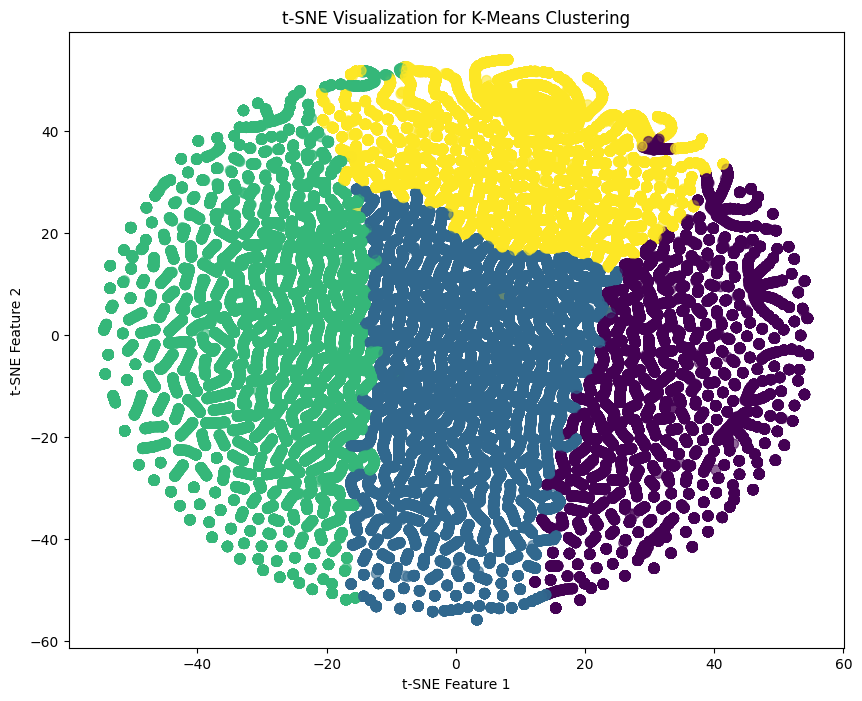

Silhouette Score: 0.3632
Calinski-Harabasz Score: 127270.4230
Davies-Bouldin Score: 0.8853


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Load the dataset
file_path = 'cs-training.csv'
cs_data = pd.read_csv(file_path)

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
data = cs_data[features].fillna(0)  # Handle missing values by replacing with 0

#  Scale data to a [0,1] range
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Perform KMeans clustering with 4 clusters
clusterer = KMeans(n_clusters=4, random_state=42, max_iter=500)
cluster_labels = clusterer.fit_predict(data_scaled)

# Instead of PCA , apply t-SNE to reduce dimensionality to 2D
tsne = TSNE(n_components=2, perplexity=40, learning_rate=200, n_iter=1000, random_state=42)
data_tsne = tsne.fit_transform(data_scaled)

# Visualize t-SNE output
plt.figure(figsize=(10, 8))
plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
plt.title('t-SNE Visualization for K-Means Clustering')
plt.xlabel('t-SNE Feature 1')
plt.ylabel('t-SNE Feature 2')
plt.show()

# Calculate Silhouette Score
silhouette_avg = silhouette_score(data_scaled, cluster_labels)

# Calculate Calinski-Harabasz Score
calinski_harabasz = calinski_harabasz_score(data_scaled, cluster_labels)

# Step 3: Calculate Davies-Bouldin Score
davies_bouldin = davies_bouldin_score(data_scaled, cluster_labels)

# Print the evaluation scores
print(f"Silhouette Score: {silhouette_avg:.4f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")


Very similar values as before. Silhouette Score, which was our main focus, is slightly better, and the t-SNE gives a probably the best visualization of the slight overlap in the clusters

###DBSCAN Clustering

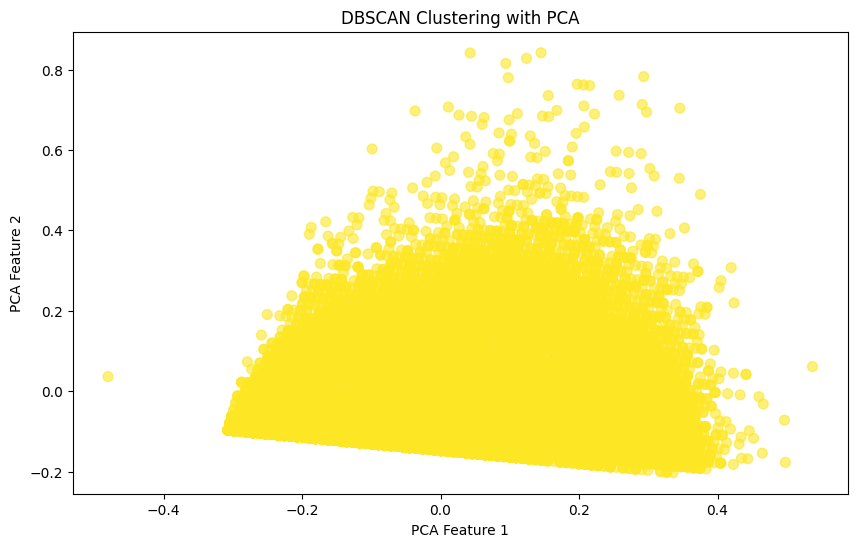

DBSCAN Silhouette Score: 0.7759594835260469


In [ ]:
# Experimenting an alternative clustering method, we'll recreate the same steps as before so that we can compare results

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# Load the dataset
file_path = 'cs-training.csv'
cs_data = pd.read_csv(file_path)

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
data = cs_data[features].fillna(0)  # Handle missing values by replacing with 0

#  Scale data to a [0,1] range
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

##DBSCAN doesn't require to specify number of clusters

# Apply DBSCAN for clustering
dbscan = DBSCAN(eps=0.3, min_samples=10)
dbscan_labels = dbscan.fit_predict(data_scaled)

# Perform PCA to reduce dimensionality for visualization
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

# Visualize DBSCAN clustering with PCA
plt.figure(figsize=(10, 6))
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=dbscan_labels, cmap='viridis', s=50, alpha=0.6)
plt.title(f"DBSCAN Clustering with PCA")
plt.xlabel("PCA Feature 1")
plt.ylabel("PCA Feature 2")
plt.show()

# Calculate the Silhouette Score for DBSCAN
if len(set(dbscan_labels)) > 1:
    silhouette_score_dbscan = silhouette_score(data_scaled, dbscan_labels)
    print(f'DBSCAN Silhouette Score: {silhouette_score_dbscan}')
else:
    print("DBSCAN did not form enough clusters.")


###GMM clustering and Hierarchical Clustering

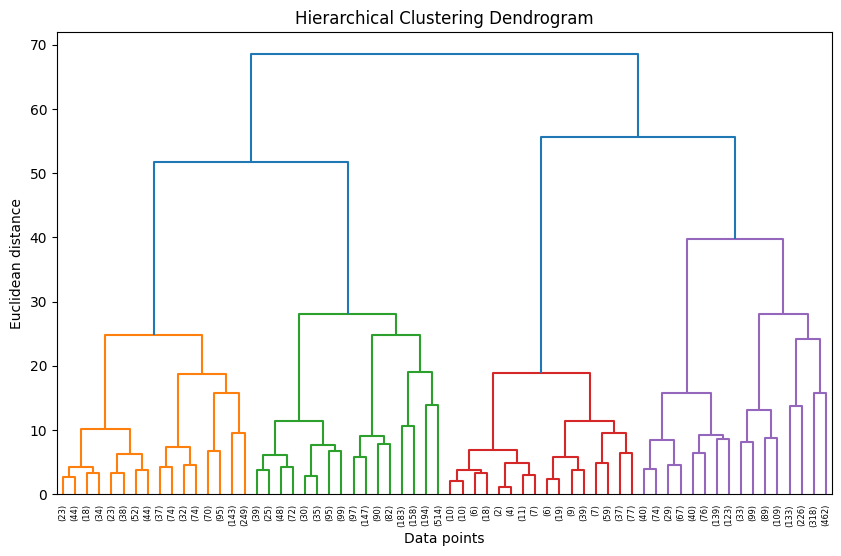

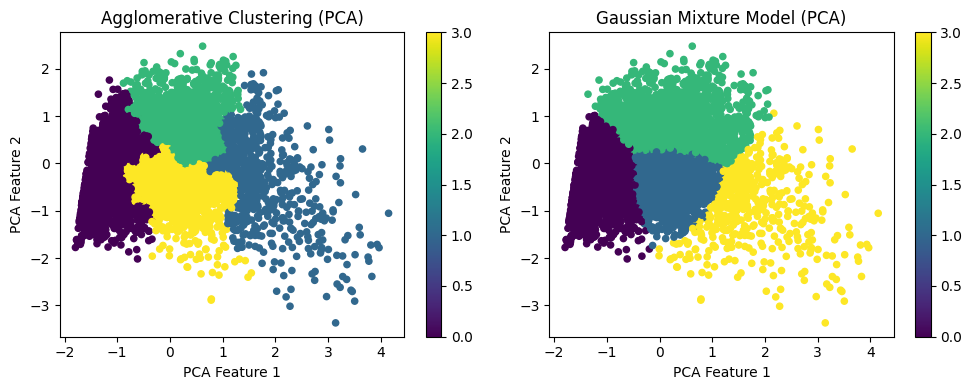

Agglomerative Clustering Silhouette Score: 0.2843034541970705
Agglomerative Clustering Calinski-Harabasz Score: 2756.3668066209975
Agglomerative Clustering Davies-Bouldin Score: 1.0711661924927576
GMM Silhouette Score: 0.31722402770563324
GMM Calinski-Harabasz Score: 3248.150443688471
GMM Davies-Bouldin Score: 0.9692985501003348


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, linkage

# Load dataset
data = pd.read_csv('cs-training.csv')

# Select relevant features for clustering
features = ['MonthlyIncome', 'DebtRatio', 'age', 'NumberOfOpenCreditLinesAndLoans']
data = data[features].fillna(data[features].median()).sample(frac=0.1, random_state=42)

# Remove outliers using IQR
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1
data_clean = data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).any(axis=1)]   #remove any data above Q3 + 1.5 or below Q1 - 1.5

# Scale data to a [0,1] range
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data_clean)

# Apply PCA to reduce dimensionality to 2D for clustering visualization
pca = PCA(n_components=2)
data_2D = pca.fit_transform(data_scaled)

# Number of clusters
n_clusters = 3

# Hierarchical Clustering with Dendrogram visualization
plt.figure(figsize=(10, 6))
linked = linkage(data_scaled, method='complete')  # Try 'complete' linkage
dendrogram(linked, truncate_mode='level', p=5)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Data points')
plt.ylabel('Euclidean distance')
plt.show()

# Agglomerative Clustering with complete linkage
agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, linkage='complete')
agg_labels = agg_cluster.fit_predict(data_2D)

# Evaluate Agglomerative Clustering
agg_silhouette = silhouette_score(data_2D, agg_labels)
agg_calinski_harabasz = calinski_harabasz_score(data_2D, agg_labels)
agg_davies_bouldin = davies_bouldin_score(data_2D, agg_labels)

# Gaussian Mixture Model (GMM) Clustering with 'tied' covariance
gmm = GaussianMixture(n_components=n_clusters, covariance_type='tied', random_state=0)
gmm_labels = gmm.fit_predict(data_2D)

# Evaluate GMM Clustering
gmm_silhouette = silhouette_score(data_2D, gmm_labels)
gmm_calinski_harabasz = calinski_harabasz_score(data_2D, gmm_labels)
gmm_davies_bouldin = davies_bouldin_score(data_2D, gmm_labels)

# Visualization of Clustering Results
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.scatter(data_2D[:, 0], data_2D[:, 1], c=agg_labels, cmap='viridis', s=20)
plt.colorbar()
plt.title('Agglomerative Clustering (Complete linkage)')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')

plt.subplot(1, 2, 2)
plt.scatter(data_2D[:, 0], data_2D[:, 1], c=gmm_labels, cmap='viridis', s=20)
plt.colorbar()
plt.title('Gaussian Mixture Model (GMM) Clustering (Tied)')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')

plt.tight_layout()
plt.show()

# Print Evaluation Results
print("Agglomerative Clustering Silhouette Score:", agg_silhouette)
print("Agglomerative Clustering Calinski-Harabasz Score:", agg_calinski_harabasz)
print("Agglomerative Clustering Davies-Bouldin Score:", agg_davies_bouldin)

print("GMM Silhouette Score:", gmm_silhouette)
print("GMM Calinski-Harabasz Score:", gmm_calinski_harabasz)
print("GMM Davies-Bouldin Score:", gmm_davies_bouldin)


**Conclusions on Clustering in the Tabular Dataset**

*	Each cluster can be interpreted based on financial traits such as income and debt ratio, allowing targeted customer segmentation. For instance, one cluster might represent low-income, high-debt individuals, while another represents high-income, low-debt customers. These insights could guide strategic decisions, such as targeted financial products for each group.

*   K-means, when combined with dimensionality reduction using PCA, can efficiently cluster high-dimensional data, as demonstrated by the well-defined, convex partitions in the PCA space. A potential limitation of K-means is its sensitivity to outliers, which can skew the centroids. However, it remains suitable for this dataset, as features like Debt Ratio and Monthly Income form dense regions of data
*   GMM is another excellent choice for this dataset, as it effectively handles the overlap between clusters, which was a primary challenge. Its probabilistic nature allows it to naturally capture relationships and the density of features, as well as address their non-linearities
*   Agglomerative Clustering, on the other hand, produced irregularly shaped clusters with poor separation. This method was less effective for a dataset with large dimensions and high feature complexity.





## Image clustering - Sign train dataset.




###K-means Clustering

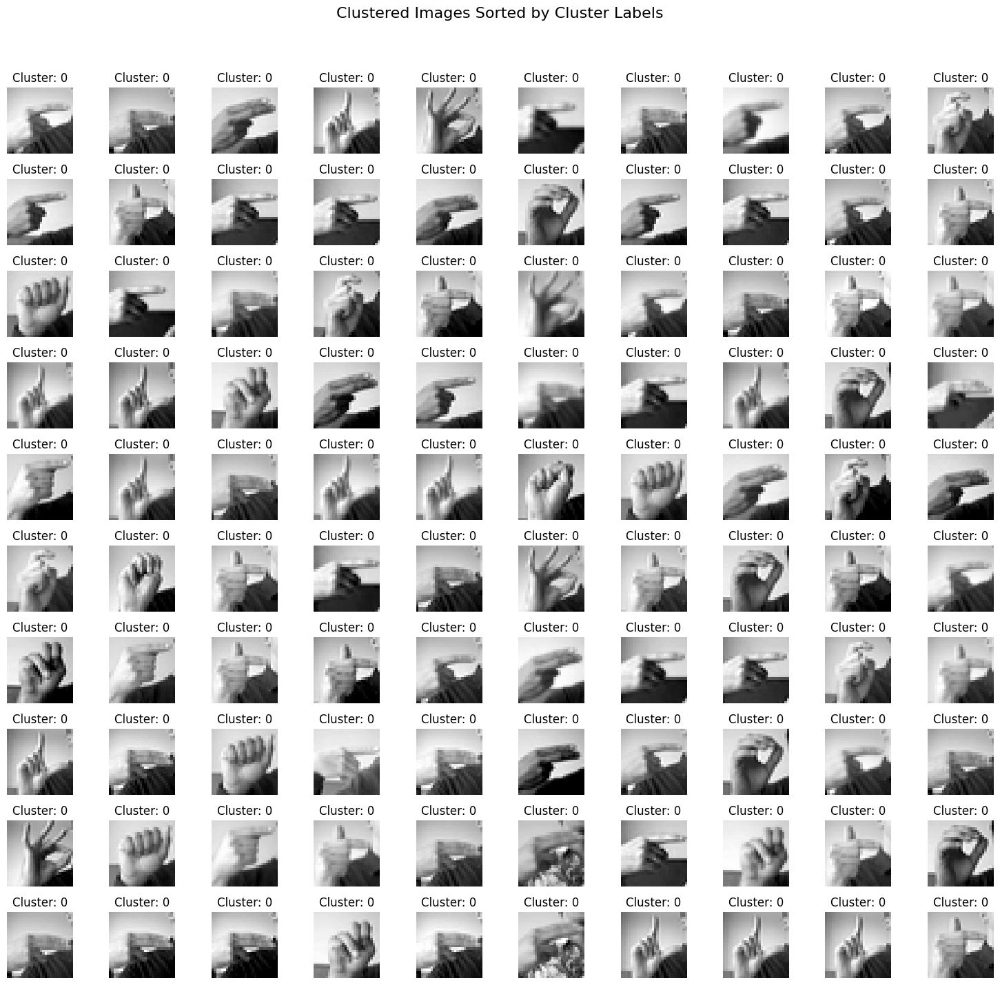

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the dataset
data = pd.read_csv('sign_mnist_train.csv')  # Replace with your actual file name

# Extract the pixel values
images = data.iloc[:, 1:].values  # Pixel are described from the second column
labels = data.iloc[:, 0].values  # The labels for each image if needed

# Standardize the features
scaler = StandardScaler()
scaled_images = scaler.fit_transform(images)

# K-Means clustering
num_clusters = 24  # Adjust the number of clusters based on the dataset, containing 24 classes each representing a letter
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_images)

# Combine images and cluster labels, and sort by cluster labels
sorted_indices = np.argsort(cluster_labels)
sorted_images = images[sorted_indices]
sorted_cluster_labels = cluster_labels[sorted_indices]

# Reshape images to 2D for visualization
image_shape = (28, 28)  # Image size is 28x28 Pixels
sorted_images_reshaped = [img.reshape(image_shape) for img in sorted_images]

# Define the grid for displaying images
num_images_to_display = 100
num_cols = 10
num_rows = num_images_to_display // num_cols

# Plot the sorted images by clusters
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
fig.suptitle("Clustered Images Sorted by Cluster Labels", fontsize=16)

for i, ax in enumerate(axes.flat[:num_images_to_display]):
    ax.imshow(sorted_images_reshaped[i], cmap='gray')
    ax.set_title(f"Cluster: {sorted_cluster_labels[i]}")
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# **R4-Decision Tree**


###Loading dataset

In [ ]:
import pandas as pd


In [ ]:
train_data = pd.read_csv('cs-training.csv')

Step 1: Initial Decision Tree Model

Step 2: Improving Class Imbalance Handling Using SMOTE

Step 3: Model Stability Validation Using 10-Fold Cross-Validation

Step 4: Hyperparameter Tuning for Max Depth

Step 5: Expanding Testing Dataset for Better Generalization

Step 6: Experimenting with Different Train-Test Splits

Step 7: Comparative Analysis Using Random Forest

Step 8: Alternative Decision Tree Classifier approach, to increase the accuracy by avoiding overfitting using prune method


###Initial Decision Tree

In [ ]:
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, mean_squared_error, r2_score, roc_auc_score
)
from sklearn.model_selection import train_test_split

# Identify target columns for classification and regression
classification_target = 'SeriousDlqin2yrs'
regression_target = 'MonthlyIncome'

# Split data into training and testing sets, we'll start with 70-30
features = train_data.drop(columns=[classification_target, regression_target])
target_class = train_data[classification_target]
target_reg = train_data[regression_target]

X_train, X_test, y_train_class, y_test_class = train_test_split(
    features, target_class, test_size=0.3, random_state=42, stratify=target_class
)
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    features, target_reg, test_size=0.3, random_state=42
)

# Median is the right choice in this case, as it is useful for robustness
imputer = SimpleImputer(strategy="median")
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)
y_train_class = pd.Series(imputer.fit_transform(y_train_class.values.reshape(-1, 1)).ravel())
y_test_class = pd.Series(imputer.transform(y_test_class.values.reshape(-1, 1)).ravel())
y_train_reg = pd.Series(imputer.fit_transform(y_train_reg.values.reshape(-1, 1)).ravel())
y_test_reg = pd.Series(imputer.transform(y_test_reg.values.reshape(-1, 1)).ravel())

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Prune the Decision Tree Classifier with Class Weights
dt_model_class = DecisionTreeClassifier(
    max_depth=3,
    min_samples_split=50,
    min_samples_leaf=25,  #this limitation restrict the tree's growth
    class_weight='balanced',
    random_state=42
)
dt_model_class.fit(X_train_scaled, y_train_class)

# Predictions for classification
y_pred_dt_class = dt_model_class.predict(X_test_scaled)

# Evaluate the pruned Decision Tree Classifier by appropriate metrics for classification
def evaluate_classification(y_true, y_pred, model_name):
    print(f"Evaluation for {model_name}:")
    print(f"Accuracy: {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
    print(f"Recall: {recall_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
    print(f"F1-Score: {f1_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
    print(f"AUC-ROC: {roc_auc_score(y_true, y_pred):.4f}")
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_true, y_pred))
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, zero_division=0))

evaluate_classification(y_test_class, y_pred_dt_class, "Pruned Decision Tree Classifier")

# Pruned Decision Tree Regressor
dt_model_reg = DecisionTreeRegressor(
    max_depth=3,  # Limit depth further for significant pruning
    min_samples_split=50,
    min_samples_leaf=25,
    random_state=42
)
dt_model_reg.fit(X_train_scaled, y_train_reg)

# Predictions for regression
y_pred_dt_reg = dt_model_reg.predict(X_test_scaled)

# Evaluate the pruned Decision Tree Regressor by appropriate metrics for regression
def evaluate_regression(y_true, y_pred, model_name):
    print(f"Evaluation for {model_name}:")
    print(f"Mean Squared Error (MSE): {mean_squared_error(y_true, y_pred):.4f}")
    print(f"Root Mean Squared Error (RMSE): {np.sqrt(mean_squared_error(y_true, y_pred)):.4f}")
    print(f"R² Score: {r2_score(y_true, y_pred):.4f}")

evaluate_regression(y_test_reg, y_pred_dt_reg, "Pruned Decision Tree Regressor")


Evaluation for Pruned Decision Tree Classifier:
Accuracy: 0.6775
Precision: 0.9282
Recall: 0.6775
F1-Score: 0.7581
AUC-ROC: 0.7556

Confusion Matrix:
[[27942 14050]
 [  464  2544]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.67      0.79     41992
         1.0       0.15      0.85      0.26      3008

    accuracy                           0.68     45000
   macro avg       0.57      0.76      0.53     45000
weighted avg       0.93      0.68      0.76     45000

Evaluation for Pruned Decision Tree Regressor:
Mean Squared Error (MSE): 96297653.3112
Root Mean Squared Error (RMSE): 9813.1368
R² Score: -0.0224


The initial model used a pruned Decision Tree Classifier to predict loan delinquency (SeriousDlqin2yrs). Although the model achieved interpretability and reduced overfitting, its performance was limited, particularly in handling imbalanced classes.

*   The accuracy is moderate, there is surely room for improvement

*   The precision is high because of the class imbalance, as the precision for class 1 is very low, sue to the many false positives (class 1).
*   MSE and RMSE are very high, significant variation from actual values



###Alternative methods

In [ ]:
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, mean_squared_error, r2_score, roc_auc_score
)
from sklearn.model_selection import train_test_split

# Load data
data = pd.read_csv('cs-training.csv')

# Define target columns
classification_target = 'SeriousDlqin2yrs'
regression_target = 'MonthlyIncome'

# Separate features and targets for classification and regression
X = data.drop(columns=[classification_target, regression_target])
y_class = data[classification_target]
y_reg = data[regression_target]

# Handle missing values
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)
y_reg_imputed = imputer.fit_transform(y_reg.values.reshape(-1, 1)).ravel()

# Split data into training and testing sets
X_train, X_test, y_train_class, y_test_class = train_test_split(
    X_imputed, y_class, test_size=0.3, random_state=42, stratify=y_class
)
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_imputed, y_reg_imputed, test_size=0.3, random_state=42
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_reg_scaled = scaler.fit_transform(X_train_reg)
X_test_reg_scaled = scaler.transform(X_test_reg)

### Naive Bayes ###
nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train_class)
y_pred_nb = nb_model.predict(X_test_scaled)

### Logistic Regression ###
logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train_scaled, y_train_class)
y_pred_logistic = logistic_model.predict(X_test_scaled)

### KNN Classifier ###
knn_classifier = KNeighborsClassifier(n_neighbors=5)
knn_classifier.fit(X_train_scaled, y_train_class)
y_pred_knn = knn_classifier.predict(X_test_scaled)

### KNN Regressor ###
knn_regressor = KNeighborsRegressor(n_neighbors=5)
knn_regressor.fit(X_train_reg_scaled, y_train_reg)
y_pred_knn_reg = knn_regressor.predict(X_test_reg_scaled)

### Decision Tree Regressor ###
dt_model_reg = DecisionTreeRegressor(max_depth=3, min_samples_split=50, min_samples_leaf=25, random_state=42)
dt_model_reg.fit(X_train_reg_scaled, y_train_reg)
y_pred_dt_reg = dt_model_reg.predict(X_test_reg_scaled)

# Function to evaluate classification models
def evaluate_classification(y_true, y_pred, model_name):
    print(f"Evaluation for {model_name}:")
    print(f"Accuracy: {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
    print(f"Recall: {recall_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
    print(f"F1-Score: {f1_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
    try:
        auc_roc = roc_auc_score(pd.get_dummies(y_true), pd.get_dummies(y_pred), multi_class='ovr', average='macro')
    except ValueError:
        auc_roc = 0.0
    print(f"AUC-ROC: {auc_roc:.4f}")
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_true, y_pred))
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, zero_division=0))

# Function to evaluate regression models
def evaluate_regression(y_true, y_pred, model_name):
    print(f"Evaluation for {model_name}:")
    print(f"Mean Squared Error (MSE): {mean_squared_error(y_true, y_pred):.4f}")
    print(f"Root Mean Squared Error (RMSE): {np.sqrt(mean_squared_error(y_true, y_pred)):.4f}")
    print(f"R² Score: {r2_score(y_true, y_pred):.4f}")

# Evaluate Naive Bayes
evaluate_classification(y_test_class, y_pred_nb, "Naive Bayes")

# Evaluate Logistic Regression
evaluate_classification(y_test_class, y_pred_logistic, "Logistic Regression")

# Evaluate KNN Classifier
evaluate_classification(y_test_class, y_pred_knn, "KNN Classifier")

# Evaluate KNN Regressor
evaluate_regression(y_test_reg, y_pred_knn_reg, "KNN Regressor")

# Evaluate Decision Tree Regressor
evaluate_regression(y_test_reg, y_pred_dt_reg, "Decision Tree Regressor")


Evaluation for Naive Bayes:
Accuracy: 0.9321
Precision: 0.8974
Recall: 0.9321
F1-Score: 0.9035
AUC-ROC: 0.5111

Confusion Matrix:
[[41867   125]
 [ 2932    76]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96     41992
           1       0.38      0.03      0.05      3008

    accuracy                           0.93     45000
   macro avg       0.66      0.51      0.51     45000
weighted avg       0.90      0.93      0.90     45000

Evaluation for Logistic Regression:
Accuracy: 0.9337
Precision: 0.9103
Recall: 0.9337
F1-Score: 0.9060
AUC-ROC: 0.5187

Confusion Matrix:
[[41898    94]
 [ 2889   119]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97     41992
           1       0.56      0.04      0.07      3008

    accuracy                           0.93     45000
   macro avg       0.75      0.52      0.52     45000
weighted avg       0.91

###Improving scores handling class imblance

###improvision

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import numpy as np

# Define target and feature columns
target_col = 'SeriousDlqin2yrs'
feature_cols = [
    'RevolvingUtilizationOfUnsecuredLines', 'age', 'NumberOfTime30-59DaysPastDueNotWorse',
    'DebtRatio', 'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans',
    'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines',
    'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents'
]

# Impute missing values
imputer = SimpleImputer(strategy='median')
scaler = StandardScaler()

# Divide colums into feature and target
X = imputer.fit_transform(train_data[feature_cols])
y = train_data[target_col]

# Apply SMOTE for oversampling the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split train data into train and validation sets for evaluation
X_train, X_val, y_train, y_val = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Scale the data
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Train a pruned Decision Tree Classifier further restrictive parameters
model = DecisionTreeClassifier(
    max_depth=3,  # Reduce the depth to prevent complexity
    min_samples_split=50,
    min_samples_leaf=20,  # Increase the minimum samples required to be in a leaf node
    max_leaf_nodes=10,  # Limit the number of leaf nodes
    random_state=42
)
model.fit(X_train_scaled, y_train)

# Predict on the validation set for evaluation
y_pred_val = model.predict(X_val_scaled)

# Function to evaluate metrics on the validation set
def class_metrics(y_true, y_pred):
    conf_matrix = confusion_matrix(y_true, y_pred)
    precision, recall, f1_score, support = precision_recall_fscore_support(
        y_true, y_pred, average=None, zero_division=0
    )
    accuracy = accuracy_score(y_true, y_pred)
    num_classes = len(np.unique(y_true))

    metrics_dict = {
        "Overall": {
            "Accuracy": accuracy,
            "Precision (macro avg)": np.mean(precision),
            "Recall (macro avg)": np.mean(recall),
            "F1 Score (macro avg)": np.mean(f1_score)
        }
    }
    # Confusion matrix
    for i in range(num_classes):
        tp = conf_matrix[i, i]
        fp = conf_matrix[:, i].sum() - tp
        fn = conf_matrix[i, :].sum() - tp
        tn = conf_matrix.sum() - (tp + fp + fn)

        tpr = tp / (tp + fn) if (tp + fn) > 0 else 0
        fpr = fp / (fp + tn) if (fp + tn) > 0 else 0

        metrics_dict[f"Class {i}"] = {
            "Precision": precision[i],
            "Recall": recall[i],
            "F1 Score": f1_score[i],
            "True Positive Rate": tpr,
            "False Positive Rate": fpr
        }

    # Evaluate and print metrics
    for label, metric_set in metrics_dict.items():
        print(f"\n{label} Metrics:")
        for metric, value in metric_set.items():
            print(f"  {metric}: {value:.4f}" if isinstance(value, float) else f"  {metric}: {value}")

    return metrics_dict

# Evaluate and print metrics for validation predictions
metrics = class_metrics(y_val, y_pred_val)



Overall Metrics:
  Accuracy: 0.8376
  Precision (macro avg): 0.8377
  Recall (macro avg): 0.8376
  F1 Score (macro avg): 0.8376

Class 0 Metrics:
  Precision: 0.8313
  Recall: 0.8460
  F1 Score: 0.8386
  True Positive Rate: 0.8460
  False Positive Rate: 0.1708

Class 1 Metrics:
  Precision: 0.8440
  Recall: 0.8292
  F1 Score: 0.8365
  True Positive Rate: 0.8292
  False Positive Rate: 0.1540


The further restriction on the pruned tree values, combined with the SMOTE technique for balance, have significantly improved our precision and overall metrics for class 1 values.  

###10 fold cross validation

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_recall_fscore_support, roc_auc_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load data (replace 'cs-training.csv' with your file if applicable)
train_data = pd.read_csv('cs-training.csv')

# Define target and feature columns and drop the index column
classification_target = 'SeriousDlqin2yrs'
X = train_data.drop(columns=[classification_target, 'Unnamed: 0'], errors='ignore')
y = train_data[classification_target]

# Handle missing values using a median
X = X.fillna(X.median())

# Address class imbalance using SMOTE
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X, y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Function to compute classification metrics
def class_metrics(y_true, y_pred):
    conf_matrix = confusion_matrix(y_true, y_pred)
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_true, y_pred, average=None, zero_division=0)
    accuracy = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(pd.get_dummies(y_true), pd.get_dummies(y_pred), average='macro', multi_class='ovr')

    metrics_dict = {
        "Overall": {
            "Accuracy": accuracy,
            "AUC-ROC": auc,
            "Precision (macro avg)": np.mean(precision),
            "Recall (macro avg)": np.mean(recall),
            "F1 Score (macro avg)": np.mean(f1_score),
        }
    }

    for i, class_label in enumerate(np.unique(y_true)):
        metrics_dict[f"Class {class_label}"] = {
            "Precision": precision[i],
            "Recall": recall[i],
            "F1 Score": f1_score[i],
            "True Positives": conf_matrix[i, i],
            "False Positives": conf_matrix[:, i].sum() - conf_matrix[i, i],
            "False Negatives": conf_matrix[i, :].sum() - conf_matrix[i, i],
        }

    return metrics_dict

# Train the Decision Tree classifier with scaled training data
dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train_scaled, y_train)

# Test the classifier on the testing set
y_pred = dtc.predict(X_test_scaled)

# Use class_metrics function to get metrics
metrics_dict = class_metrics(y_test, y_pred)

# Perform 10-fold cross-validation to validate model robustness
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
cv_scores = cross_val_score(dtc, X_train_scaled, y_train, cv=kf)

# Print findings from cross-validation
print("\nCross-Validation Results:")
for fold, accuracy in enumerate(cv_scores, start=1):
    print(f"Fold {fold}: Accuracy = {accuracy:.4f}")

average_accuracy = np.mean(cv_scores)
print(f"\nAverage Accuracy Across {num_folds} Folds: {average_accuracy:.4f}")

# Print class metrics results
print("\nEvaluation Metrics on Test Set:")
for class_key, class_metrics in metrics_dict.items():
    print(f"{class_key}:")
    for metric_key, metric_value in class_metrics.items():
        print(f"  {metric_key}: {metric_value}")
    print("\n")



Cross-Validation Results:
Fold 1: Accuracy = 0.8629
Fold 2: Accuracy = 0.8715
Fold 3: Accuracy = 0.8644
Fold 4: Accuracy = 0.8671
Fold 5: Accuracy = 0.8640
Fold 6: Accuracy = 0.8646
Fold 7: Accuracy = 0.8660
Fold 8: Accuracy = 0.8668
Fold 9: Accuracy = 0.8656
Fold 10: Accuracy = 0.8670

Average Accuracy Across 10 Folds: 0.8660

Evaluation Metrics on Test Set:
Overall:
  Accuracy: 0.8721914627612074
  AUC-ROC: 0.872143295349493
  Precision (macro avg): 0.8724498017006173
  Recall (macro avg): 0.872143295349493
  F1 Score (macro avg): 0.8721574940775081


Class 0:
  Precision: 0.8813821178086223
  Recall: 0.8590515799034371
  F1 Score: 0.8700735934927859
  True Positives: 35941
  False Positives: 4837
  False Negatives: 5897


Class 1:
  Precision: 0.8635174855926123
  Recall: 0.8852350107955489
  F1 Score: 0.8742413946622303
  True Positives: 37310
  False Positives: 5897
  False Negatives: 4837




The results on the 10 cross validation were satisfying, as they were very consistent and proved the model stability

###Cross Validation for max depths

Pruned Decision Tree Results on Validation Set:
Accuracy: 0.7992260522712389
Confusion Matrix:
 [[35661  6177]
 [10685 31462]]
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.85      0.81     41838
           1       0.84      0.75      0.79     42147

    accuracy                           0.80     83985
   macro avg       0.80      0.80      0.80     83985
weighted avg       0.80      0.80      0.80     83985



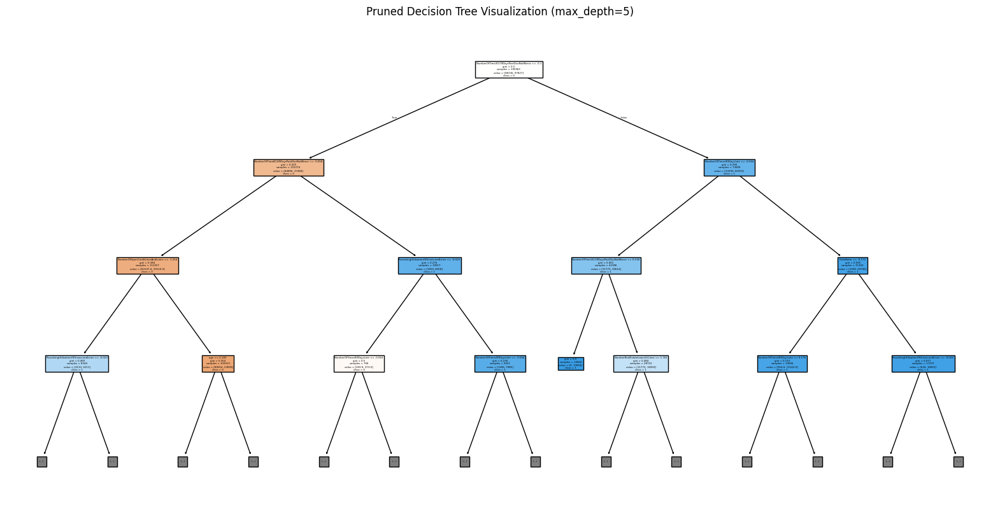

Max Depth 3: Average Cross-Validation Accuracy: 0.7705
Max Depth 5: Average Cross-Validation Accuracy: 0.7857
Max Depth 10: Average Cross-Validation Accuracy: 0.6761
Max Depth 15: Average Cross-Validation Accuracy: 0.5215
Max Depth 20: Average Cross-Validation Accuracy: 0.5347


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt


# Separate features and target variable
X = train_data.drop(columns=['SeriousDlqin2yrs'])
y = train_data['SeriousDlqin2yrs']

# Handle missing values by imputing with median
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Handle class imbalance using SMOTE
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_scaled, y)

# Split resampled data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Create a pruned Decision Tree classifier with more restrictive parameters
dtc = DecisionTreeClassifier(
    max_depth=5,
    min_samples_split=50,  # Increase the minimum samples for split
    min_samples_leaf=20,  # Increase the minimum samples for a leaf
    max_features='sqrt',  # Limit the number of features considered at each split
    random_state=42
)

# Fit model on training data
dtc.fit(X_train, y_train)

# Predict on validation set
y_pred = dtc.predict(X_val)

# Evaluate the model
print("Pruned Decision Tree Results on Validation Set:")
print("Accuracy:", accuracy_score(y_val, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred))
print("Classification Report:\n", classification_report(y_val, y_pred))

# Visualize the pruned Decision Tree
plt.figure(figsize=(20, 10))
plot_tree(dtc, filled=True, feature_names=train_data.columns[1:], class_names=['0', '1'], max_depth=3)
plt.title("Pruned Decision Tree Visualization (max_depth=5)")
plt.show()

# Cross-Validation with different max depths
max_depth_values = [3, 5, 10, 15, 20]
for max_depth in max_depth_values:
    dtc = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=50,
        min_samples_leaf=20,
        max_features='sqrt',
        random_state=42
    )
    scores = cross_val_score(dtc, X_resampled, y_resampled, cv=5)
    print(f"Max Depth {max_depth}: Average Cross-Validation Accuracy: {np.mean(scores):.4f}")


###splitting the dataset into 40 and 60

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support

## We'll try increasing the test dataframe size

# Define target column
target_column = 'SeriousDlqin2yrs'

# Separate features and target variable
X_train = train_data.drop(columns=[target_column])
y_train = train_data[target_column]
X_test = test_data.drop(columns=[target_column])
y_test = test_data[target_column]

# Moving 30% of the original training set to the testing set
test_size_percentage = 0.3

# Split the original training data to get 30% for new testing
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
    X_train, y_train, test_size=test_size_percentage, random_state=42
)

# Combine the new test data with the existing test set
X_test_all = pd.concat([X_test, X_test_new], axis=0).reset_index(drop=True)
y_test_all = pd.concat([y_test, y_test_new], axis=0).reset_index(drop=True)

# Verify the shapes of the new training and testing sets
print("Original Training Set Shape:", X_train.shape, y_train.shape)
print("Original Testing Set Shape:", X_test.shape, y_test.shape)
print("\nNew Training Set Shape:", X_train_new.shape, y_train_new.shape)
print("Combined Testing Set Shape:", X_test_all.shape, y_test_all.shape)

# Train a Decision Tree Classifier on the new training set
dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train_new, y_train_new)

# Test the classifier on the new testing set
y_pred = dtc.predict(X_test_new)

# Function to compute class metrics
def class_metrics(y_true, y_pred):
    conf_matrix = confusion_matrix(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro')

    metrics_dict = {
        "Accuracy": accuracy,
        "Confusion Matrix": conf_matrix,
        "Precision (macro avg)": precision,
        "Recall (macro avg)": recall,
        "F1 Score (macro avg)": f1
    }

    # Display metrics
    print("Overall Metrics:")
    for metric, value in metrics_dict.items():
        print(f"  {metric}: {value}")

    return metrics_dict

# Use the class_metrics function to get metrics
metrics_dict = class_metrics(y_test_new, y_pred)

# Perform 10-fold cross-validation on the new training set
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
cv_scores = cross_val_score(dtc, X_train_new, y_train_new, cv=kf)

# Display cross-validation results
print("\nCross-Validation Results:")
for fold, accuracy in enumerate(cv_scores, start=1):
    print(f"Fold {fold}: Accuracy = {accuracy:.4f}")

average_accuracy = cv_scores.mean()
print(f"\nAverage Accuracy Across {num_folds} Folds: {average_accuracy:.4f}")


Original Training Set Shape: (150000, 11) (150000,)
Original Testing Set Shape: (101503, 11) (101503,)

New Training Set Shape: (105000, 11) (105000,)
Combined Testing Set Shape: (146503, 11) (146503,)
Overall Metrics:
  Accuracy: 0.8993333333333333
  Confusion Matrix: [[39595  2425]
 [ 2105   875]]
  Precision (macro avg): 0.6073359494222803
  Recall (macro avg): 0.6179567735402445
  F1 Score (macro avg): 0.6122767429192242

Cross-Validation Results:
Fold 1: Accuracy = 0.9006
Fold 2: Accuracy = 0.8996
Fold 3: Accuracy = 0.8944
Fold 4: Accuracy = 0.8965
Fold 5: Accuracy = 0.8911
Fold 6: Accuracy = 0.9033
Fold 7: Accuracy = 0.8959
Fold 8: Accuracy = 0.8931
Fold 9: Accuracy = 0.8975
Fold 10: Accuracy = 0.8933

Average Accuracy Across 10 Folds: 0.8965


Increasing the test data gave us a better estimate of how well the model performs with unseen data, and allowed a more balanced representation of the minority class

###Decision Tree using SMOTE using minimal numbers.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE


# Separate features and target variable
X_train = train_data.drop(columns=['SeriousDlqin2yrs'])  # Replace with your actual target column
y_train = train_data['SeriousDlqin2yrs']
X_test = test_data.drop(columns=['SeriousDlqin2yrs'])
y_test = test_data['SeriousDlqin2yrs']

# Handle missing values with SimpleImputer
imputer = SimpleImputer(strategy='median')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

# Handle class imbalance using SMOTE
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_train_scaled, y_train)

# Split data into train and test sets
X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Initialize and train the Decision Tree classifier
dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train_final, y_train_final)

# Make predictions on the test set
y_pred = dtc.predict(X_test_final)

# Evaluation metrics
print("Decision Tree Results on Test Set:")
print("Accuracy:", accuracy_score(y_test_final, y_pred))
print("Precision (macro avg):", precision_score(y_test_final, y_pred, average='macro'))
print("Recall (macro avg):", recall_score(y_test_final, y_pred, average='macro'))
print("F1 Score (macro avg):", f1_score(y_test_final, y_pred, average='macro'))
print("Confusion Matrix:\n", confusion_matrix(y_test_final, y_pred))
print("\nClassification Report:\n", classification_report(y_test_final, y_pred))

# Cross-validation with different max depth values
tree_depths = [3, 5, 10, 15]
print("\nCross-Validation Results with Different Tree Depths:")
for depth in tree_depths:
    dt = DecisionTreeClassifier(max_depth=depth, random_state=42)
    scores = cross_val_score(dt, X_train_final, y_train_final, cv=5, scoring='accuracy')
    print(f"Max Depth {depth} - Average Cross-Validation Accuracy: {np.mean(scores):.4f}")

# Experiment with training-testing set sizes
train_sizes = [0.6, 0.7, 0.8]
print("\nExperiments with Different Train-Test Splits:")
for size in train_sizes:
    X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(X_resampled, y_resampled, test_size=1-size, random_state=42)
    dtc.fit(X_train_split, y_train_split)
    y_pred_split = dtc.predict(X_test_split)
    print(f"\nTrain-Test Split {int(size*100)}-{int((1-size)*100)}%")
    print("Accuracy:", accuracy_score(y_test_split, y_pred_split))
    print("F1 Score (macro avg):", f1_score(y_test_split, y_pred_split, average='macro'))

# Overfitting and generalization with different max_depth values
print("\nEffect of Max Depth on Overfitting and Generalization:")
for depth in [3, 5, 10, 15]:  # 'None' means no max depth
    dt = DecisionTreeClassifier(max_depth=depth, random_state=42)
    dt.fit(X_train_final, y_train_final)

    # Evaluate on training set
    y_train_pred = dt.predict(X_train_final)
    train_accuracy = accuracy_score(y_train_final, y_train_pred)

    # Evaluate on test set
    y_test_pred = dt.predict(X_test_final)
    test_accuracy = accuracy_score(y_test_final, y_test_pred)

    print(f"\nMax Depth {depth}:")
    print(f"Training Accuracy: {train_accuracy:.4f}")
    print(f"Testing Accuracy: {test_accuracy:.4f}")


Decision Tree Results on Test Set:
Accuracy: 0.9129368339584449
Precision (macro avg): 0.9130453338357392
Recall (macro avg): 0.9129082311123676
F1 Score (macro avg): 0.9129260418063905
Confusion Matrix:
 [[37869  3969]
 [ 3343 38804]]

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.91      0.91     41838
           1       0.91      0.92      0.91     42147

    accuracy                           0.91     83985
   macro avg       0.91      0.91      0.91     83985
weighted avg       0.91      0.91      0.91     83985


Cross-Validation Results with Different Tree Depths:
Max Depth 3 - Average Cross-Validation Accuracy: 0.7994
Max Depth 5 - Average Cross-Validation Accuracy: 0.8295
Max Depth 10 - Average Cross-Validation Accuracy: 0.8605
Max Depth 15 - Average Cross-Validation Accuracy: 0.8819

Experiments with Different Train-Test Splits:

Train-Test Split 60-40%
Accuracy: 0.9031255581353813
F1 Score (macro avg): 0.9031111



###Alternative Decision Tree Classifier approach, to increase the accuracy by avoiding overfitting using prune method



Saving cs-training.csv to cs-training (1).csv
<bound method NDFrame.head of         Unnamed: 0  SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines  \
0                1                 1                              0.766127   
1                2                 0                              0.957151   
2                3                 0                              0.658180   
3                4                 0                              0.233810   
4                5                 0                              0.907239   
...            ...               ...                                   ...   
149995      149996                 0                              0.040674   
149996      149997                 0                              0.299745   
149997      149998                 0                              0.246044   
149998      149999                 0                              0.000000   
149999      150000                 0                              

<ipython-input-2-257c5d8607ef>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  cv["MonthlyIncome"].fillna(cv["MonthlyIncome"].median(), inplace=True)
<ipython-input-2-257c5d8607ef>:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, in

SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfTime60-89DaysPastDueNotWorse    0
NumberOfDependents                      0
dtype: int64


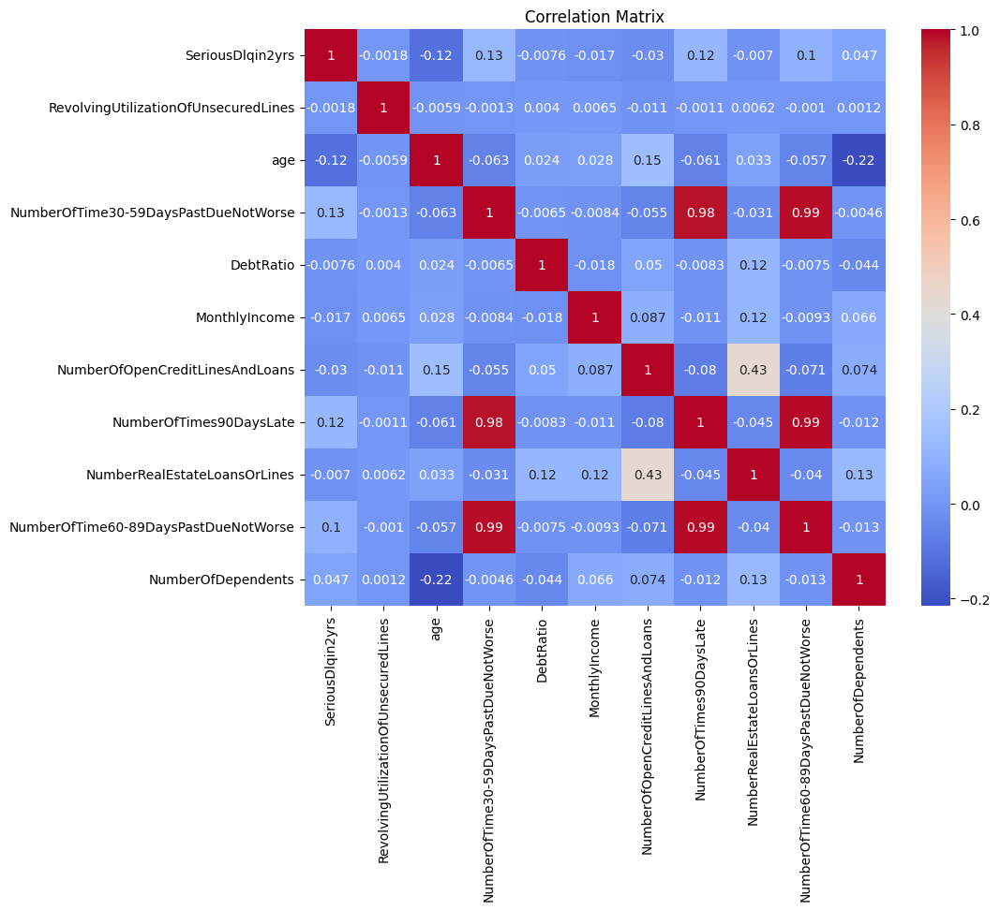

X_train shape: (105000, 10), X_test shape: (45000, 10)
Accuracy: 0.90
Maximum Depth of the Decision Tree: 39


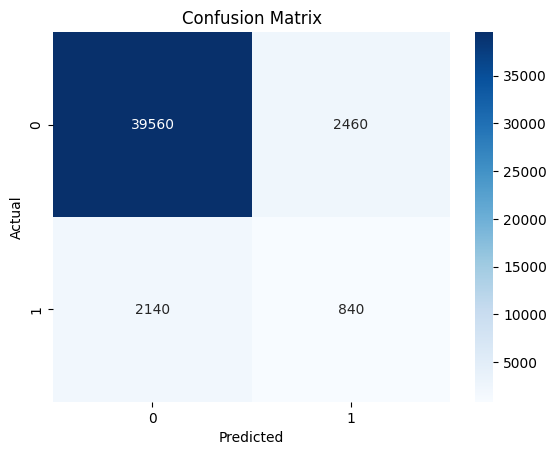

              precision    recall  f1-score   support

           0       0.95      0.94      0.95     42020
           1       0.25      0.28      0.27      2980

    accuracy                           0.90     45000
   macro avg       0.60      0.61      0.61     45000
weighted avg       0.90      0.90      0.90     45000



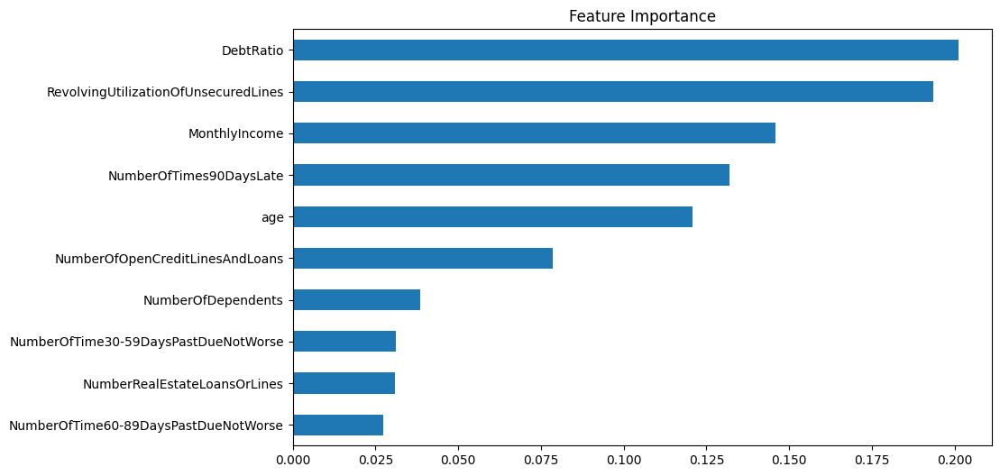

Pruned Decision Tree Accuracy: 0.94


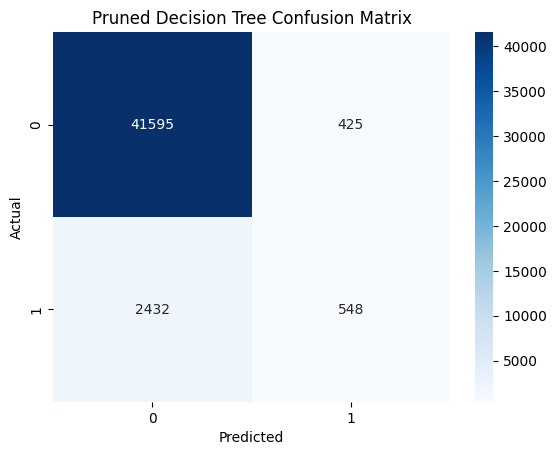

              precision    recall  f1-score   support

           0       0.94      0.99      0.97     42020
           1       0.56      0.18      0.28      2980

    accuracy                           0.94     45000
   macro avg       0.75      0.59      0.62     45000
weighted avg       0.92      0.94      0.92     45000



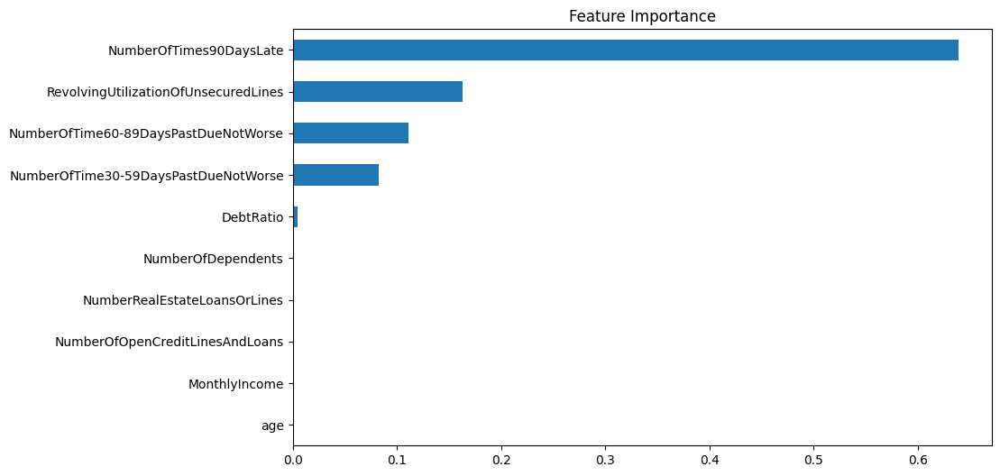

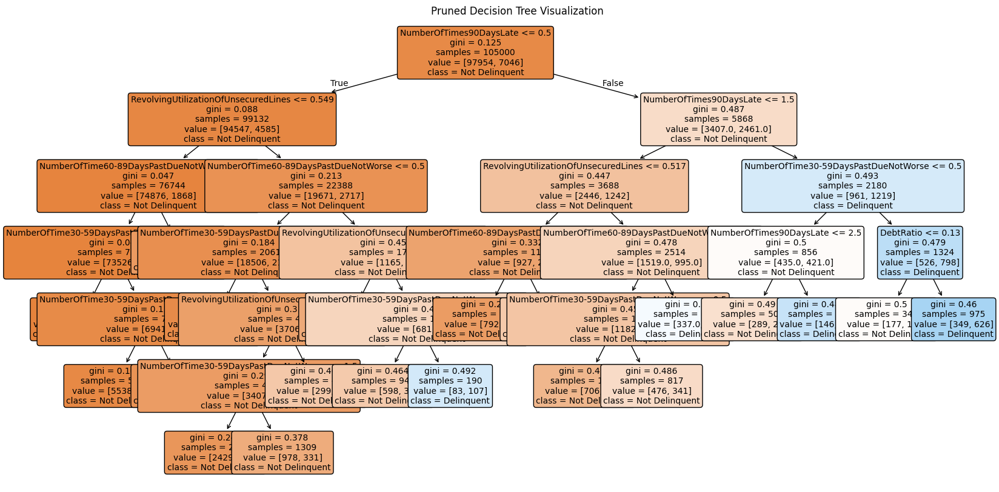

In [ ]:

# Load the data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from google.colab import files
uploaded = files.upload()

cv = pd.read_csv("cs-training.csv")

# EDA for DCT Classifier
print(cv.head)
print(cv.info)

# Feature Engineering
print(cv.isna().sum())
cv = cv.drop(columns=["Unnamed: 0"])
cv["MonthlyIncome"].fillna(cv["MonthlyIncome"].median(), inplace=True)
cv["NumberOfDependents"].fillna(0, inplace=True)

# Checkin the null values after imputation
print(cv.isna().sum())

# Correlation matrix in imputed data set
plt.figure(figsize=(10, 8))
sns.heatmap(cv.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

# Split data into train and test
X = cv.drop(columns=["SeriousDlqin2yrs"])
y = cv["SeriousDlqin2yrs"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")


# Model training and predictions

clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Evaluation the Matrix
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
max_depth = clf.get_depth()
print(f"Maximum Depth of the Decision Tree: {max_depth}")

#IMPORTANT!!! Accuracy is 90% which is good however the problem with DCT (Decission Tree Model is model might be overfitting. So prevent this we will prune the tree (simply decreasing max_depth of 39) to prevent potential overfitting

conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print(classification_report(y_test, y_pred))

feature_importance = pd.Series(clf.feature_importances_, index=X.columns)
feature_importance.sort_values().plot(kind='barh', figsize=(10, 6))
plt.title("Feature Importance")
plt.show()

# Pruning the leafs as an alternative way to prevent overfitting
clf_pruned = DecisionTreeClassifier(
    random_state=42,
    max_depth=15,           # Limit the depth of the tree
    min_samples_split=10,  # Require at least 10 samples to split a node
    min_samples_leaf=5,    # Require at least 5 samples at a leaf node
    max_leaf_nodes=20  )

clf_pruned.fit(X_train, y_train)

y_pred_pruned = clf_pruned.predict(X_test)

# Display the results of the pruned tree
accuracy_pruned = accuracy_score(y_test, y_pred_pruned)
print(f"Pruned Decision Tree Accuracy: {accuracy_pruned:.2f}")

conf_matrix_pruned = confusion_matrix(y_test, y_pred_pruned)
sns.heatmap(conf_matrix_pruned, annot=True, fmt="d", cmap="Blues")
plt.title("Pruned Decision Tree Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print(classification_report(y_test, y_pred_pruned))

feature_importance = pd.Series(clf_pruned.feature_importances_, index=X.columns)
feature_importance.sort_values().plot(kind='barh', figsize=(10, 6))
plt.title("Feature Importance")
plt.show()

# Visualize the pruned tree
from sklearn.tree import plot_tree
plt.figure(figsize=(20, 10))
plot_tree(
    clf_pruned,
    filled=True,           # Color-filled nodes
    feature_names=X.columns,
    class_names=["Not Delinquent", "Delinquent"],  # Customize class names
    rounded=True,          # Rounded nodes for better visualization
    fontsize=10
)
plt.title("Pruned Decision Tree Visualization")
plt.show()

#Lowest Ginu impurity is with the feature 'Number of Times 90 Days Late'

After achieving an optimal accuracy, pruning the tree allowed us to prevent overfitting and improve its generalization to unseen data. Additionally, the reduced number of splits made the model easier to interpret, resulting in a robust solution for predicting the target class. The NumberOfTimes90DaysLate feature emerged as a key predictor, which aligns with expectations, as it is directly linked to loan delinquency risk

###Visualization

Max Depth 10: Average Cross-Validation Accuracy: 0.8380
Max Depth 20: Average Cross-Validation Accuracy: 0.8806
Max Depth 30: Average Cross-Validation Accuracy: 0.8930
Max Depth 50: Average Cross-Validation Accuracy: 0.8956
Max Depth 70: Average Cross-Validation Accuracy: 0.8956
Max Depth 80: Average Cross-Validation Accuracy: 0.8956
Max Depth 90: Average Cross-Validation Accuracy: 0.8956
Max Depth None: Average Cross-Validation Accuracy: 0.8956


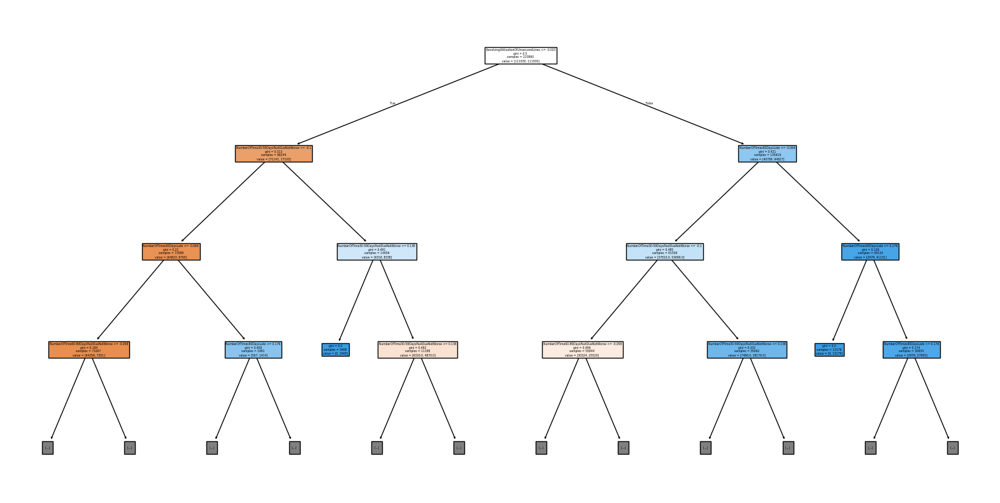

Decision Tree Classifier Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.92     28044
           1       0.19      0.34      0.24      1956

    accuracy                           0.86     30000
   macro avg       0.57      0.62      0.58     30000
weighted avg       0.90      0.86      0.88     30000

Confusion Matrix:
 [[25140  2904]
 [ 1294   662]]

Random Forest (Max Depth=10): Average Cross-Validation Accuracy: 0.8476
Random Forest Classifier Report:
               precision    recall  f1-score   support

           0       0.97      0.86      0.91     28044
           1       0.25      0.67      0.36      1956

    accuracy                           0.85     30000
   macro avg       0.61      0.76      0.64     30000
weighted avg       0.93      0.85      0.88     30000

Confusion Matrix:
 [[24078  3966]
 [  645  1311]]


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load the data
train_data = pd.read_csv('cs-training.csv')
test_data = pd.read_csv('cs-test.csv')

# Define features and target column
features = ['RevolvingUtilizationOfUnsecuredLines', 'age', 'NumberOfTime30-59DaysPastDueNotWorse',
            'DebtRatio', 'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans',
            'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines',
            'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents']
target = 'SeriousDlqin2yrs'

# Separate features and target
X = train_data[features]
y = train_data[target]

# Impute missing values with median
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Split into training and testing sets 80-20
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Handle class imbalance using SMOTE
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_train, y_train)

# Train Decision Trees with varying max_depth
max_depth_values = [10,20,30,50,70,80,90,None]
for max_depth in max_depth_values:
    dtc = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=20, random_state=42)
    scores = cross_val_score(dtc, X_resampled, y_resampled, cv=10)
    print(f"Max Depth {max_depth}: Average Cross-Validation Accuracy: {np.mean(scores):.4f}")

# Train a Decision Tree with no max depth for comparison and plot it
dtc_full = DecisionTreeClassifier(random_state=42)
dtc_full.fit(X_resampled, y_resampled)
plt.figure(figsize=(20, 10))
plot_tree(dtc_full, feature_names=features, filled=True, max_depth=3)
plt.show()

# Evaluate on the validation set
y_pred_dtc = dtc_full.predict(X_val)
print("Decision Tree Classifier Report:\n", classification_report(y_val, y_pred_dtc))
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_dtc))

# Train and evaluate a Random Forest for comparison
rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=20, random_state=42)
rf_scores = cross_val_score(rf, X_resampled, y_resampled, cv=10)
print(f"\nRandom Forest (Max Depth=10): Average Cross-Validation Accuracy: {np.mean(rf_scores):.4f}")
rf.fit(X_resampled, y_resampled)
y_pred_rf = rf.predict(X_val)
print("Random Forest Classifier Report:\n", classification_report(y_val, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_val, y_pred_rf))


•	The baseline Decision Tree model offered simplicity but struggled with class imbalance and generalization.

•	SMOTE significantly improved minority class detection, as reflected in increased precision, recall, and F1-scores.

•	Cross-validation ensured model stability and mitigated overfitting risks.

•	Random Forest emerged as the better-performing model compared to the Decision Tree, leveraging ensemble learning to improve robustness and accuracy.


###Random Forest classifier

####80 and 20 split for improvising

Evaluating Random Forest...

Classification Report for RandomForestClassifier:

              precision    recall  f1-score   support

           0       0.95      0.99      0.97     42020
           1       0.54      0.20      0.29      2980

    accuracy                           0.94     45000
   macro avg       0.74      0.59      0.63     45000
weighted avg       0.92      0.94      0.92     45000

Confusion Matrix:
 [[41515   505]
 [ 2387   593]]
Evaluating Logistic Regression...

Classification Report for LogisticRegression:

              precision    recall  f1-score   support

           0       0.94      1.00      0.97     42020
           1       0.54      0.04      0.07      2980

    accuracy                           0.93     45000
   macro avg       0.74      0.52      0.52     45000
weighted avg       0.91      0.93      0.91     45000

Confusion Matrix:
 [[41928    92]
 [ 2872   108]]
Evaluating k-NN...

Classification Report for KNeighborsClassifier:

              p

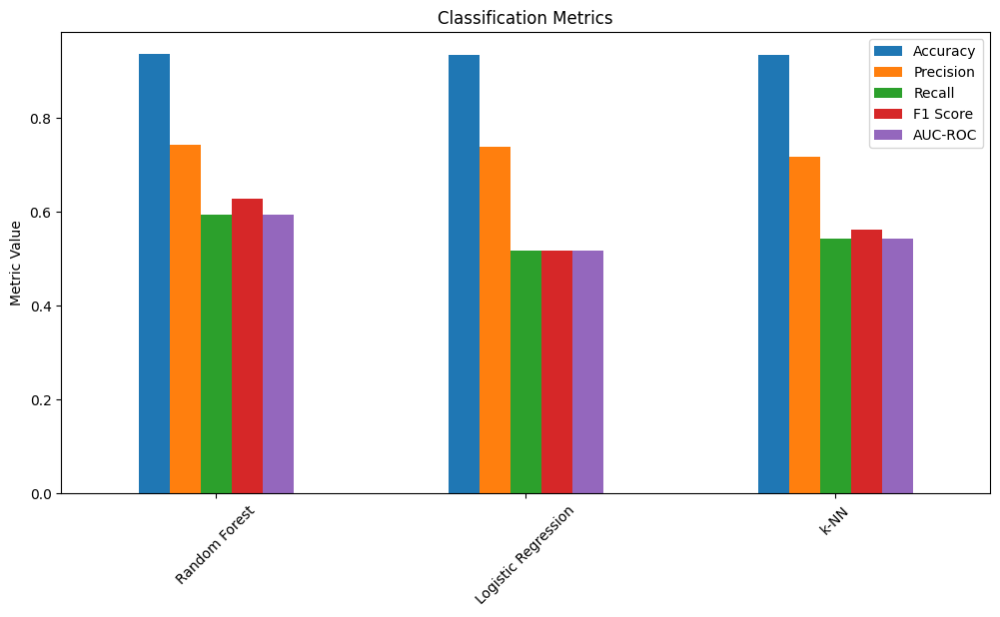


Evaluating Random Forest...

Regression Evaluation for RandomForestRegressor:
Mean Squared Error (MSE): 106810011.9923
Root Mean Squared Error (RMSE): 10334.8929
R² Score: -0.1340

Evaluating Linear Regression...


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support, roc_auc_score,
    mean_squared_error, r2_score, classification_report, confusion_matrix
)
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Load data
data = pd.read_csv('cs-training.csv')

# Define target columns
classification_target = 'SeriousDlqin2yrs'
regression_target = 'MonthlyIncome'

# Separate features and targets for classification
X_class = data.drop(columns=[classification_target, regression_target])
y_class = data[classification_target]

# Separate features and targets for regression
X_reg = data.drop(columns=[classification_target, regression_target])
y_reg = data[regression_target]

# Handle missing values with median
imputer = SimpleImputer(strategy='median')
X_class_imputed = imputer.fit_transform(X_class)
X_reg_imputed = imputer.transform(X_reg)

# Handle missing values in the regression target
y_reg_imputed = SimpleImputer(strategy='median').fit_transform(y_reg.values.reshape(-1, 1)).ravel()

# Split data into training and testing sets for classification
X_class_train, X_class_test, y_class_train, y_class_test = train_test_split(
    X_class_imputed, y_class, test_size=0.3, random_state=42
)

# Split data into training and testing sets for regression
X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(
    X_reg_imputed, y_reg_imputed, test_size=0.3, random_state=42
)

# Scale the data
scaler = StandardScaler()
X_class_train_scaled = scaler.fit_transform(X_class_train)
X_class_test_scaled = scaler.transform(X_class_test)

X_reg_train_scaled = scaler.fit_transform(X_reg_train)
X_reg_test_scaled = scaler.transform(X_reg_test)

### Classification Models

classification_models = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'k-NN': KNeighborsClassifier(n_neighbors=5)
}

# Function to evaluate classification models
def evaluate_classification(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)

    # Check if the model outputs probabilities
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_test)[:, 1]
        y_pred = (y_pred_prob >= 0.5).astype(int)
    else:
        y_pred = model.predict(X_test)

    metrics = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_recall_fscore_support(y_test, y_pred, average='macro')[0],
        'Recall': precision_recall_fscore_support(y_test, y_pred, average='macro')[1],
        'F1 Score': precision_recall_fscore_support(y_test, y_pred, average='macro')[2],
        'AUC-ROC': roc_auc_score(y_test, y_pred)
    }
    print(f"\nClassification Report for {model.__class__.__name__}:\n")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    return metrics

classification_results = {}
for name, model in classification_models.items():
    print(f"Evaluating {name}...")
    classification_results[name] = evaluate_classification(
        model, X_class_train_scaled, X_class_test_scaled, y_class_train, y_class_test
    )

# Plot classification metrics
classification_metrics_df = pd.DataFrame(classification_results).T
classification_metrics_df[['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']].plot(
    kind='bar', figsize=(12, 6), title="Classification Metrics"
)
plt.ylabel("Metric Value")
plt.xticks(rotation=45)
plt.show()

### Regression Models

regression_models = {
    'Random Forest': RandomForestRegressor(random_state=42),
    'Linear Regression': LogisticRegression(max_iter=1000, random_state=42),  # Linear regression proxy
    'k-NN': KNeighborsRegressor(n_neighbors=5)
}

# Function to evaluate regression models
def evaluate_regression(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    metrics = {
        'MSE': mean_squared_error(y_test, y_pred),
        'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
        'R²': r2_score(y_test, y_pred)
    }
    print(f"\nRegression Evaluation for {model.__class__.__name__}:")
    print(f"Mean Squared Error (MSE): {metrics['MSE']:.4f}")
    print(f"Root Mean Squared Error (RMSE): {metrics['RMSE']:.4f}")
    print(f"R² Score: {metrics['R²']:.4f}")
    return metrics

# Storing regression results
regression_results = {}
for name, model in regression_models.items():
    print(f"\nEvaluating {name}...")
    regression_results[name] = evaluate_regression(
        model, X_reg_train_scaled, X_reg_test_scaled, y_reg_train, y_reg_test
    )

# Plot regression metrics
regression_metrics_df = pd.DataFrame(regression_results).T
regression_metrics_df[['MSE', 'RMSE', 'R²']].plot(kind='bar', figsize=(12, 6), title="Regression Metrics")
plt.ylabel("Metric Value")
plt.xticks(rotation=45)
plt.show()


####Minimal number of instances in trees using random forest.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score, roc_curve, auc
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load dataset
# train_data = pd.read_csv('path/to/your/dataset.csv')

# Select features and target
X = train_data.drop(columns=['SeriousDlqin2yrs'])  # Replace with actual target column
y = train_data['SeriousDlqin2yrs']

# Handle missing values
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Handle class imbalance using SMOTE
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_imputed, y)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Define a range of values for min_samples_leaf
min_samples_leaf_values = [1, 5, 10, 20, 30]

# Create a list to store results
results_min_samples_leaf_rf = []

# Iterate over min_samples_leaf values
for min_samples_leaf in min_samples_leaf_values:
    # Create and train the RandomForestClassifier with the current min_samples_leaf
    rfc = RandomForestClassifier(
        min_samples_leaf=min_samples_leaf,
        n_estimators=100,  # Increase the number of trees
        class_weight='balanced',  # Handle class imbalance
        random_state=42
    )
    rfc.fit(X_train, y_train)

    # Test the classifier on the testing set
    y_pred = rfc.predict(X_test)
    y_pred_proba = rfc.predict_proba(X_test)[:, 1]

    # Calculate overall metrics for the current iteration
    overall_precision, overall_recall, overall_f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
    overall_auc_roc = roc_auc_score(y_test, y_pred_proba)

    # Collect metrics
    overall_metrics = {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": overall_precision,
        "Recall": overall_recall,
        "F1 Score": overall_f1,
        "AUC-ROC": overall_auc_roc
    }

    # Store results
    results_min_samples_leaf_rf.append({
        'min_samples_leaf': min_samples_leaf,
        'overall_metrics': overall_metrics
    })

# Display results for min_samples_leaf with RandomForest
for result in results_min_samples_leaf_rf:
    print(f"Min Samples Leaf: {result['min_samples_leaf']}")
    print("Overall Metrics:")
    overall_metrics = result['overall_metrics']
    for metric_key, metric_value in overall_metrics.items():
        print(f"  {metric_key}: {metric_value:.4f}")
    print("\n")


Min Samples Leaf: 1
Overall Metrics:
  Accuracy: 0.9613
  Precision: 0.9620
  Recall: 0.9614
  F1 Score: 0.9613
  AUC-ROC: 0.9905


Min Samples Leaf: 5
Overall Metrics:
  Accuracy: 0.9565
  Precision: 0.9575
  Recall: 0.9566
  F1 Score: 0.9565
  AUC-ROC: 0.9899


Min Samples Leaf: 10
Overall Metrics:
  Accuracy: 0.9524
  Precision: 0.9535
  Recall: 0.9525
  F1 Score: 0.9523
  AUC-ROC: 0.9888


Min Samples Leaf: 20
Overall Metrics:
  Accuracy: 0.9475
  Precision: 0.9488
  Recall: 0.9476
  F1 Score: 0.9475
  AUC-ROC: 0.9874


Min Samples Leaf: 30
Overall Metrics:
  Accuracy: 0.9448
  Precision: 0.9460
  Recall: 0.9449
  F1 Score: 0.9448
  AUC-ROC: 0.9864




####RMSE Metric

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best Parameters: {'max_depth': 30, 'min_samples_leaf': 20}

Metrics on Validation Set:
Accuracy: 0.9376
Precision (macro avg): 0.7762
Recall (macro avg): 0.5770
F1 Score (macro avg): 0.6113
AUC-ROC: 0.5770
RMSE: 0.2207


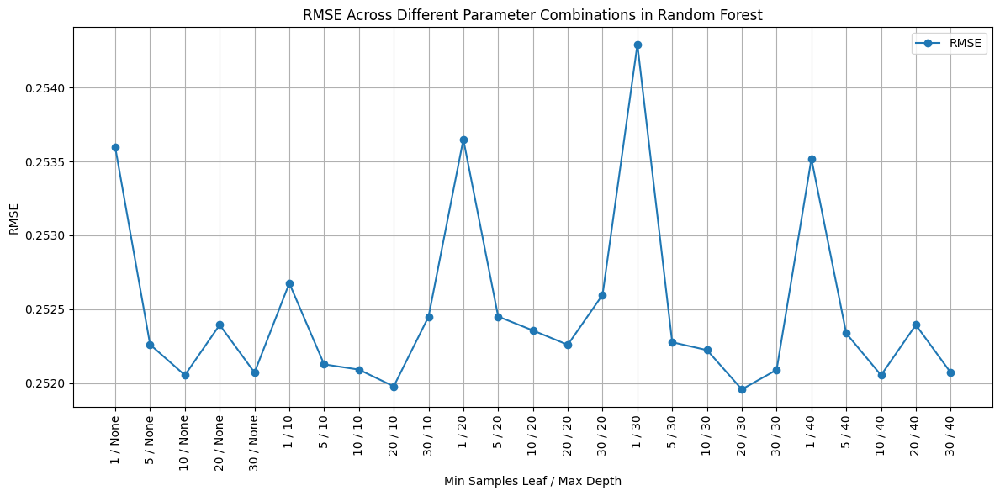

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support, roc_auc_score, mean_squared_error, make_scorer
)
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Load dataset
train_data = pd.read_csv('cs-training.csv')

# Handle missing values
imputer = SimpleImputer(strategy='median')
X = imputer.fit_transform(train_data.drop(columns=['SeriousDlqin2yrs']))
y = train_data['SeriousDlqin2yrs']

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Custom RMSE scoring function
def rmse_score(y_true, y_pred_proba):
    mse = mean_squared_error(y_true, y_pred_proba)
    return np.sqrt(mse)

rmse_scorer = make_scorer(rmse_score, greater_is_better=False)

# Define a parameter grid for min_samples_leaf and max_depth
param_grid = {
    'min_samples_leaf': [1, 5, 10, 20, 30],
    'max_depth': [None, 10, 20, 30, 40]
}

# Create a RandomForestClassifier
rfc = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with RMSE scoring and verbose output
grid_search = GridSearchCV(
    estimator=rfc,
    param_grid=param_grid,
    cv=5,
    scoring=rmse_scorer,
    verbose=2,  # Detailed output to show progress
    n_jobs=-1   # Utilize all CPU cores
)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Get the best estimator
best_rfc = grid_search.best_estimator_

# Make predictions and calculate metrics
y_pred = best_rfc.predict(X_val_scaled)
y_pred_proba = best_rfc.predict_proba(X_val_scaled)[:, 1]  # For RMSE

# Calculate accuracy, precision, recall, F1, and AUC-ROC
accuracy = accuracy_score(y_val, y_pred)
precision, recall, f1, _ = precision_recall_fscore_support(y_val, y_pred, average='macro')
auc_roc = roc_auc_score(pd.get_dummies(y_val), pd.get_dummies(y_pred), multi_class='ovr', average='macro')

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_val, y_pred_proba))

# Print results
print("Best Parameters:", grid_search.best_params_)
print("\nMetrics on Validation Set:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")
print(f"AUC-ROC: {auc_roc:.4f}")
print(f"RMSE: {rmse:.4f}")

# Visualize RMSE and other metrics
import matplotlib.pyplot as plt

results = grid_search.cv_results_
param_combinations = [f"{params['min_samples_leaf']} / {params['max_depth']}" for params in results['params']]
rmse_scores = -results['mean_test_score']  # Negative because greater_is_better=False

plt.figure(figsize=(12, 6))
plt.plot(param_combinations, rmse_scores, marker='o', label='RMSE')
plt.xlabel('Min Samples Leaf / Max Depth')
plt.ylabel('RMSE')
plt.title('RMSE Across Different Parameter Combinations in Random Forest')
plt.xticks(rotation=90)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


max_depth=30 seems to capture the complexity of data and min_samples_leaf=20 helps reduce overfitting and generalize data, which seems to be a good balance, as seen in the RMSE metric. Based on other metrics, as Recall and AUC-ROC, the model might still struggle to capture the minority class

###Minimal sample split

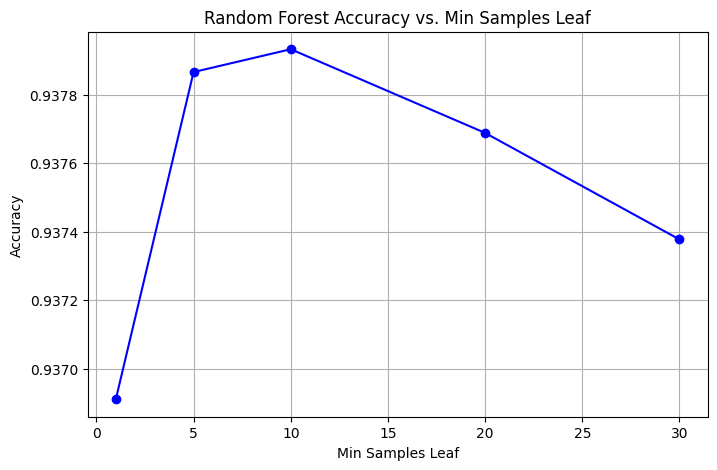

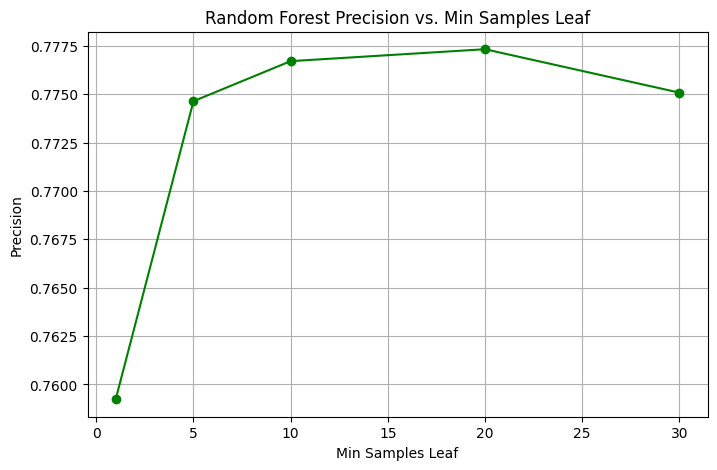

<function matplotlib.pyplot.xlabel(xlabel: 'str', fontdict: 'dict[str, Any] | None' = None, labelpad: 'float | None' = None, *, loc: "Literal['left', 'center', 'right'] | None" = None, **kwargs) -> 'Text'>

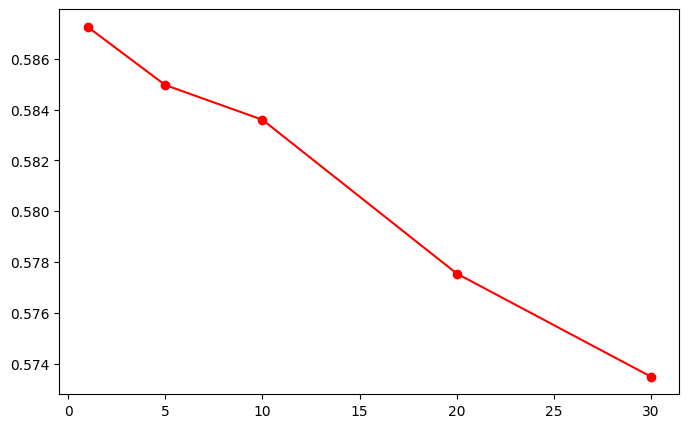

In [ ]:
import matplotlib.pyplot as plt

# Extract data for plotting
min_samples_leaf_values_rf = [result['min_samples_leaf'] for result in results_min_samples_leaf_rf]
accuracy_values_rf = [result['overall_metrics']['Accuracy'] for result in results_min_samples_leaf_rf]
precision_values_rf = [result['overall_metrics']['Precision'] for result in results_min_samples_leaf_rf]
recall_values_rf = [result['overall_metrics']['Recall'] for result in results_min_samples_leaf_rf]
f1_values_rf = [result['overall_metrics']['F1 Score'] for result in results_min_samples_leaf_rf]
auc_roc_values_rf = [result['overall_metrics']['AUC-ROC'] for result in results_min_samples_leaf_rf]

# Plot Accuracy
plt.figure(figsize=(8, 5))
plt.plot(min_samples_leaf_values_rf, accuracy_values_rf, label='Accuracy', marker='o', color='b')
plt.xlabel('Min Samples Leaf')
plt.ylabel('Accuracy')
plt.title('Random Forest Accuracy vs. Min Samples Leaf')
plt.grid(True)
plt.show()

# Plot Precision
plt.figure(figsize=(8, 5))
plt.plot(min_samples_leaf_values_rf, precision_values_rf, label='Precision', marker='o', color='g')
plt.xlabel('Min Samples Leaf')
plt.ylabel('Precision')
plt.title('Random Forest Precision vs. Min Samples Leaf')
plt.grid(True)
plt.show()

# Plot Recall
plt.figure(figsize=(8, 5))
plt.plot(min_samples_leaf_values_rf, recall_values_rf, label='Recall', marker='o', color='r')
plt.xlabel


####ROC Curve

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
540 fits failed out of a total of 1620.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
352 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py"

Best Model Parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
Accuracy: 0.9379333333333333
Precision: 0.7802417361112699
Recall: 0.5792328836699686
F1 Score: 0.6144561404081379
AUC-ROC: 0.8642728294931465


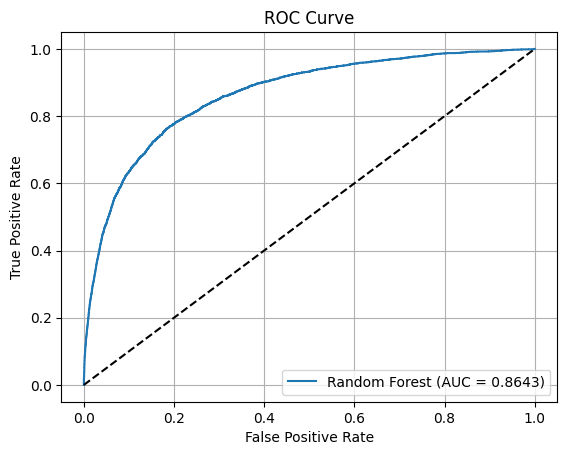

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score, roc_curve
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

#Load dataset
data = pd.read_csv('cs-training.csv')

# Define features and target
target_column = 'SeriousDlqin2yrs'
X = data.drop(columns=[target_column])
y = data[target_column]

# Handle missing values
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5,
    verbose=2,
    n_jobs=-1
)

grid_search.fit(X_train_scaled, y_train)
best_model = grid_search.best_estimator_

# Evaluate the best model
y_pred = best_model.predict(X_test_scaled)
y_pred_proba = best_model.predict_proba(X_test_scaled)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
auc_roc = roc_auc_score(y_test, y_pred_proba)

# Display metrics
print("Best Model Parameters:", grid_search.best_params_)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)
print("AUC-ROC:", auc_roc)

# Visualize ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure()
plt.plot(fpr, tpr, label='Random Forest (AUC = {:.4f})'.format(auc_roc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


###Gini Index and entropy.

Criterion: Gini
Overall Metrics:
  Accuracy: 0.8978
  Precision: 0.5990
  Recall: 0.6069
  F1 Score: 0.6027
  AUC-ROC: 0.6069


Criterion: Entropy
Overall Metrics:
  Accuracy: 0.9003
  Precision: 0.6056
  Recall: 0.6119
  F1 Score: 0.6086
  AUC-ROC: 0.6119




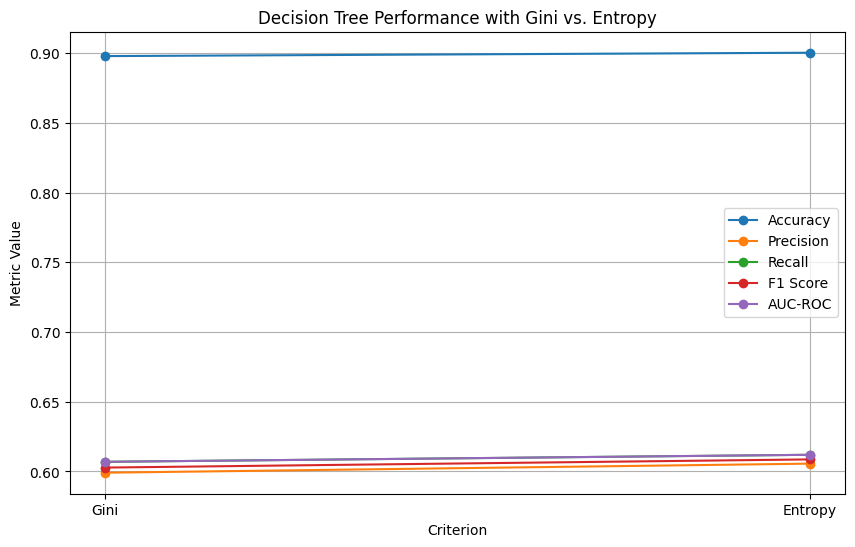

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Define features and target
target_column = 'SeriousDlqin2yrs'
X = data.drop(columns=[target_column])
y = data[target_column]

# Handle missing values
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define criteria to test
criteria = ['gini', 'entropy']
results_criteria = []

# Iterate over criteria
for criterion in criteria:
    # Initialize and train the DecisionTreeClassifier
    dtc = DecisionTreeClassifier(criterion=criterion, random_state=42)
    dtc.fit(X_train_scaled, y_train)

    # Predict on the test set
    y_pred = dtc.predict(X_test_scaled)

    # Calculate metrics for the current criterion
    accuracy = accuracy_score(y_test, y_pred)
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
    auc_roc = roc_auc_score(pd.get_dummies(y_test), pd.get_dummies(y_pred), multi_class='ovr', average='macro')

    # Store results
    results_criteria.append({
        'criterion': criterion,
        'overall_metrics': {
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1_score,
            "AUC-ROC": auc_roc
        }
    })

# Display results for each criterion
for result in results_criteria:
    print(f"Criterion: {result['criterion'].capitalize()}")
    print("Overall Metrics:")
    for metric_key, metric_value in result['overall_metrics'].items():
        print(f"  {metric_key}: {metric_value:.4f}")
    print("\n")

# Extract data for plotting
criteria_names = [result['criterion'].capitalize() for result in results_criteria]
accuracy_values = [result['overall_metrics']['Accuracy'] for result in results_criteria]
precision_values = [result['overall_metrics']['Precision'] for result in results_criteria]
recall_values = [result['overall_metrics']['Recall'] for result in results_criteria]
f1_values = [result['overall_metrics']['F1 Score'] for result in results_criteria]
auc_roc_values = [result['overall_metrics']['AUC-ROC'] for result in results_criteria]

# Plotting
plt.figure(figsize=(10, 6))

# Plot each metric for Decision Tree criteria
plt.plot(criteria_names, accuracy_values, label='Accuracy', marker='o')
plt.plot(criteria_names, precision_values, label='Precision', marker='o')
plt.plot(criteria_names, recall_values, label='Recall', marker='o')
plt.plot(criteria_names, f1_values, label='F1 Score', marker='o')
plt.plot(criteria_names, auc_roc_values, label='AUC-ROC', marker='o')

# Adding labels and title
plt.xlabel('Criterion')
plt.ylabel('Metric Value')
plt.title('Decision Tree Performance with Gini vs. Entropy')
plt.legend()
plt.grid(True)
plt.show()


Entropy performes slightly better compared to Gini, it seems to strike a better balance between false positives and false negatives

Fitting 5 folds for each of 162 candidates, totalling 810 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Parameters: {'criterion': 'entropy', 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}

Metrics for Best Random Forest Model:
Accuracy: 0.9611
Precision: 0.9619
Recall: 0.9612
F1 Score: 0.9611
AUC-ROC: 0.9612


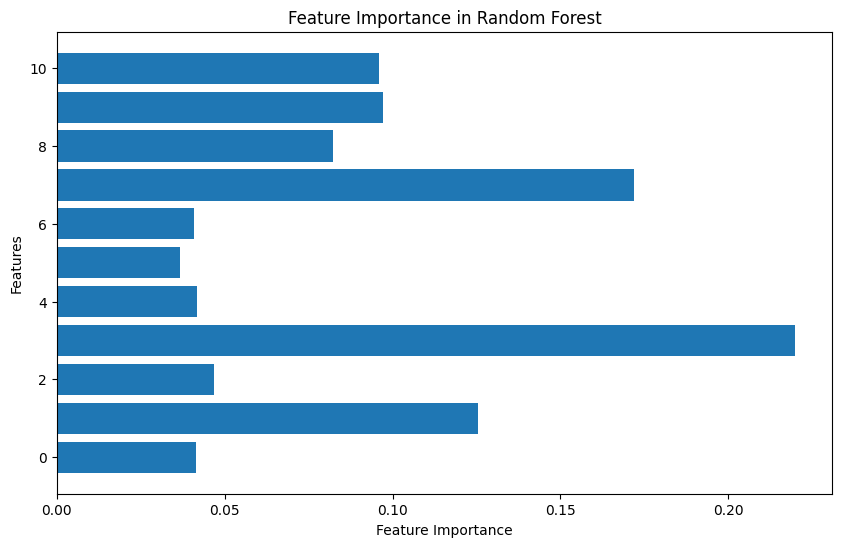

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE  # For handling class imbalance

# Define features and target
target_column = 'SeriousDlqin2yrs'
X = data.drop(columns=[target_column])
y = data[target_column]

# Handle missing values
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Apply SMOTE for class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_imputed, y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

rfc = RandomForestClassifier(random_state=42, class_weight='balanced')
grid_search = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=5, scoring='roc_auc', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
best_rfc = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")

# Evaluate the best model
y_pred = best_rfc.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
auc_roc = roc_auc_score(pd.get_dummies(y_test), pd.get_dummies(y_pred), multi_class='ovr', average='macro')

# Display results
print("\nMetrics for Best Random Forest Model:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"AUC-ROC: {auc_roc:.4f}")

# Feature importance
feature_importance = best_rfc.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(range(len(feature_importance)), feature_importance, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Feature Importance in Random Forest")
plt.show()


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:22:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Default Threshold Evaluation Metrics for XGBoost Classifier:
Accuracy: 0.9357
Precision: 0.7423
Recall: 0.5966
F1 Score: 0.6320
AUC-ROC: 0.8556

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97     42020
           1       0.54      0.21      0.30      2980

    accuracy                           0.94     45000
   macro avg       0.74      0.60      0.63     45000
weighted avg       0.92      0.94      0.92     45000

Confusion Matrix:
 [[41495   525]
 [ 2367   613]]

Adjusted Threshold Evaluation Metrics for XGBoost Classifier:
Accuracy: 0.9327
Precision: 0.7181
Recall: 0.6294
F1 Score: 0.6598
AUC-ROC: 0.8556

Classification Report with Adjusted Threshold:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96     42020
           1       0.49      0.28      0.36      2980

    accuracy                           0.93     45000
   macro avg       0.72      0.63      0.66

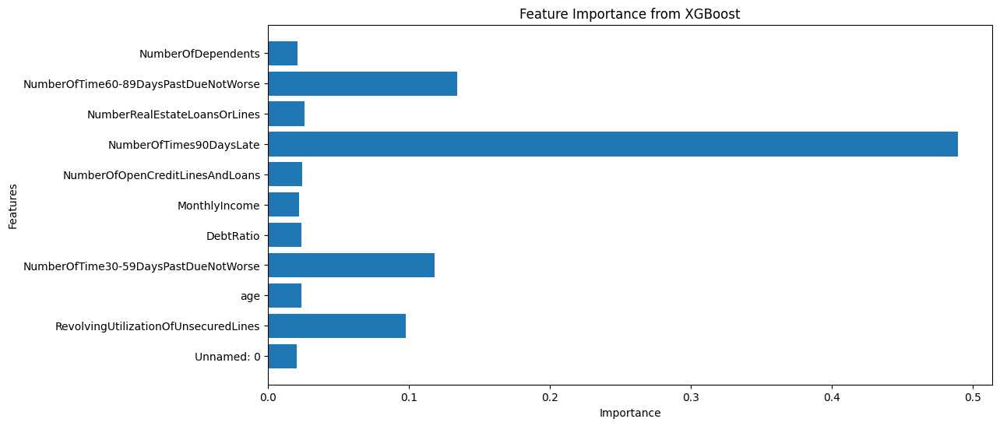

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support, roc_auc_score,
    classification_report, confusion_matrix
)
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Load the dataset
data = pd.read_csv('cs-training.csv')

# Define features and target
target_column = 'SeriousDlqin2yrs'
X = data.drop(columns=[target_column])
y = data[target_column]

# Handle missing values
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train XGBoost Classifier
xgb = XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False)
xgb.fit(X_train_scaled, y_train)

# Predict probabilities and labels
y_prob = xgb.predict_proba(X_test_scaled)[:, 1]
y_pred = xgb.predict(X_test_scaled)

# Evaluate with default threshold
accuracy = accuracy_score(y_test, y_pred)
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')
auc_roc = roc_auc_score(y_test, y_prob)

print("Default Threshold Evaluation Metrics for XGBoost Classifier:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"AUC-ROC: {auc_roc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Adjust threshold to optimize recall or balance metrics
threshold = 0.4  # Adjust threshold here
y_pred_adjusted = (y_prob >= threshold).astype(int)

# Evaluate with adjusted threshold
accuracy_adjusted = accuracy_score(y_test, y_pred_adjusted)
precision_adjusted, recall_adjusted, f1_score_adjusted, _ = precision_recall_fscore_support(
    y_test, y_pred_adjusted, average='macro'
)
auc_roc_adjusted = roc_auc_score(y_test, y_prob)

print("\nAdjusted Threshold Evaluation Metrics for XGBoost Classifier:")
print(f"Accuracy: {accuracy_adjusted:.4f}")
print(f"Precision: {precision_adjusted:.4f}")
print(f"Recall: {recall_adjusted:.4f}")
print(f"F1 Score: {f1_score_adjusted:.4f}")
print(f"AUC-ROC: {auc_roc_adjusted:.4f}")
print("\nClassification Report with Adjusted Threshold:")
print(classification_report(y_test, y_pred_adjusted))
print("Confusion Matrix with Adjusted Threshold:\n", confusion_matrix(y_test, y_pred_adjusted))

# Plot feature importance
plt.figure(figsize=(12, 6))
feature_importances = xgb.feature_importances_
feature_names = data.drop(columns=[target_column]).columns  # Extract original feature names
plt.barh(feature_names, feature_importances)
plt.title("Feature Importance from XGBoost")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()


**Conclusions on Decision Trees**

In the end, we successfully developed a reliable model to predict the target class with minimal or no overfitting. Given the imbalanced nature of our dataset, Random Forest proved to be an effective model in balancing the contributions of the classes and reducing overfitting, demonstrating its reliability for classification tasks in complex datasets like ours. SMOTE also showed to be a highly interesting and effective tool for that purpose, delivering immediate results.

We conducted several experiments on pruning the tree to find the optimal configuration. Metrics such as Precision, Recall, and F1-score provided a robust evaluation of the model’s performance. As observed during data exploration, the NumberOfTimes90DaysLate feature emerged as the strongest predictor for the target class, though the contribution of othe features like DebtRatio should not be overlooked. Overall, we were satisfied with the results of our analysis

Linear regression using SVM

Logistic Regression - 10-Fold Cross-Validation Mean Accuracy: 68.67%
Logistic Regression - Test Set Accuracy: 69.01%

Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.69      0.69     41838
           1       0.69      0.70      0.69     42147

    accuracy                           0.69     83985
   macro avg       0.69      0.69      0.69     83985
weighted avg       0.69      0.69      0.69     83985

SVC - 10-Fold Cross-Validation Mean Accuracy: 65.37%
SVC - Test Set Accuracy: 65.50%

SVC - Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.65      0.65     41838
           1       0.66      0.66      0.66     42147

    accuracy                           0.66     83985
   macro avg       0.66      0.66      0.66     83985
weighted avg       0.66      0.66      0.66     83985



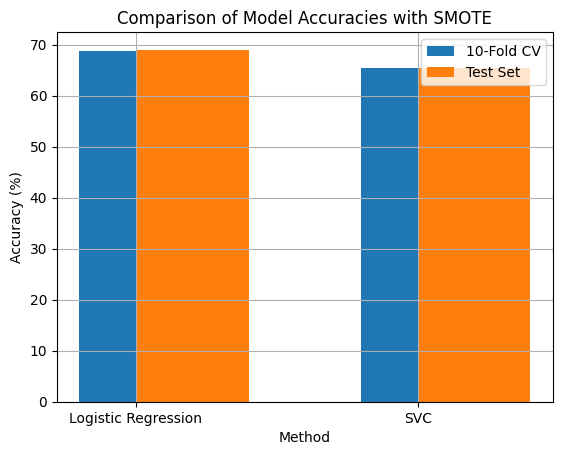

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load your dataset
data = pd.read_csv('cs-training.csv')  # Replace with your actual dataset
target_column = 'SeriousDlqin2yrs'

# Define features and target
X = data.drop(columns=[target_column])
y = data[target_column]

# Handle missing values in the features
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Apply SMOTE to balance the dataset
sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_imputed, y)

# Split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Normalize the data
x_train_normalized = x_train / 255.0
x_test_normalized = x_test / 255.0

### Logistic Regression with SMOTE ###
# Logistic Regression with 10-Fold Cross-Validation
lr_cv_clf = LogisticRegression(solver='liblinear', random_state=42)
lr_cv_scores = cross_val_score(lr_cv_clf, x_train_normalized, y_train, cv=10)
lr_cv_mean_accuracy = lr_cv_scores.mean()
print("Logistic Regression - 10-Fold Cross-Validation Mean Accuracy: {:.2f}%".format(lr_cv_mean_accuracy * 100))

# Train Logistic Regression on the entire training set
lr_clf = LogisticRegression(solver='liblinear', random_state=42)
lr_clf.fit(x_train_normalized, y_train)

# Evaluate Logistic Regression on the test set
lr_test_predictions = lr_clf.predict(x_test_normalized)
lr_test_accuracy = accuracy_score(y_test, lr_test_predictions)
print("Logistic Regression - Test Set Accuracy: {:.2f}%".format(lr_test_accuracy * 100))

# Classification Report for Logistic Regression
print("\nLogistic Regression - Classification Report:")
print(classification_report(y_test, lr_test_predictions))

### Support Vector Classification (SVC) with SMOTE ###
# Linear SVC with 10-Fold Cross-Validation
svc_cv_clf = LinearSVC(random_state=42)
svc_cv_scores = cross_val_score(svc_cv_clf, x_train_normalized, y_train, cv=10)
svc_cv_mean_accuracy = svc_cv_scores.mean()
print("SVC - 10-Fold Cross-Validation Mean Accuracy: {:.2f}%".format(svc_cv_mean_accuracy * 100))

# Train Linear SVC on the entire training set
svc_clf = LinearSVC(random_state=42)
svc_clf.fit(x_train_normalized, y_train)

# Evaluate SVC on the test set
svc_test_predictions = svc_clf.predict(x_test_normalized)
svc_test_accuracy = accuracy_score(y_test, svc_test_predictions)
print("SVC - Test Set Accuracy: {:.2f}%".format(svc_test_accuracy * 100))

# Classification Report for SVC
print("\nSVC - Classification Report:")
print(classification_report(y_test, svc_test_predictions))

### Visualization ###
# Data
methods = ['Logistic Regression', 'SVC']
cv_accuracies = [lr_cv_mean_accuracy * 100, svc_cv_mean_accuracy * 100]  # 10-fold CV accuracies
test_accuracies = [lr_test_accuracy * 100, svc_test_accuracy * 100]  # Test set accuracies

# Plotting
x = range(len(methods))
plt.bar(x, cv_accuracies, width=0.4, label='10-Fold CV', align='center')
plt.bar(x, test_accuracies, width=0.4, label='Test Set', align='edge')

plt.xlabel('Method')
plt.ylabel('Accuracy (%)')
plt.title('Comparison of Model Accuracies with SMOTE')
plt.xticks(x, methods)
plt.legend()
plt.grid(True)
plt.show()


Improved SVC

#**R5 CNN**

##MLP

The primary goal was to classify hand signs from the Sign Language MNIST dataset using a Multilayer Perceptron (MLP) model. While MLPs are not ideal for image data, the purpose was twofold:
1.	Explore the feasibility of MLPs in this context.
2.	Gain insights into data preprocessing and optimization techniques to inform future experiments with Convolutional Neural Networks (CNNs).


###Initial MLP

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Reshape data for ImageDataGenerator
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
datagen.fit(X_train)

# Model architecture
model = Sequential([
    Flatten(input_shape=(28, 28, 1)),
    Dense(512, activation='relu'),
    BatchNormalization(),  # to allow faster convergence
    Dropout(0.3),   # to prevent overfitting
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(25, activation='softmax')  # 25 classes
])

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(patience=10, restore_best_weights=True),
    ModelCheckpoint('best_model.keras', save_best_only=True)
]

# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_test, y_test),
    epochs=50,  # Increase epochs if necessary
    callbacks=callbacks
)

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f'Test accuracy: {test_acc}')

# Save the final model
model.save('final_model.keras')


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 11/858 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.0479 - loss: 4.0279

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


858/858 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.2305 - loss: 2.6719 - val_accuracy: 0.1842 - val_loss: 2.9253
Epoch 2/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.3637 - loss: 1.9946 - val_accuracy: 0.4453 - val_loss: 1.7174
Epoch 3/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.3974 - loss: 1.8567 - val_accuracy: 0.3555 - val_loss: 1.9537
Epoch 4/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4197 - loss: 1.7876 - val_accuracy: 0.6443 - val_loss: 1.0852
Epoch 5/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4343 - loss: 1.7405 - val_accuracy: 0.5956 - val_loss: 1.1873
Epoch 6/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - accuracy: 0.4449 - loss: 1.6944 - val_accuracy: 0.5950 - val_loss: 1.2676
Epoch 7/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4476 - loss: 1.6874 - val_accuracy: 0.6201 - val_loss: 1.1977
Epoch 8/50
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4617 - loss: 1.6323 - val_accurac

The results are good, with some room for improvement. We'll conduct further expirements to find the best parameters

###Predicting Classes

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


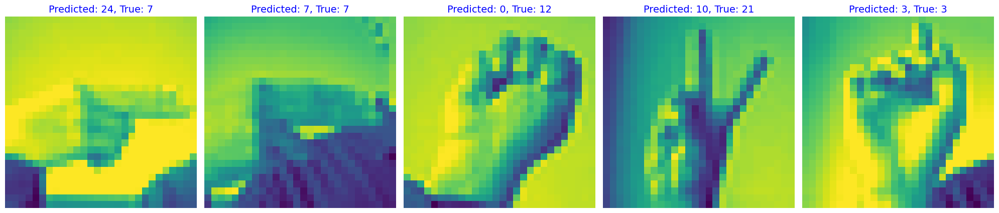

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Select a few random images from the test set
num_images = 5
random_indices = np.random.randint(0, len(X_test), num_images)
sample_images = X_test[random_indices]
sample_labels = y_test[random_indices]

# Predict probabilities for the selected images
predicted_probabilities = model.predict(sample_images.reshape(-1, 28, 28, 1))  # Ensure correct input shape
predicted_classes = np.argmax(predicted_probabilities, axis=1)

# Display the sample images with enhanced visuals
plt.figure(figsize=(20, 10))  # Increase figure size for higher resolution
for i in range(num_images):
    plt.subplot(1, num_images, i + 1)
    plt.imshow(sample_images[i].reshape(28, 28), cmap='viridis')  # Use a colorful colormap like 'viridis'
    plt.title(f"Predicted: {predicted_classes[i]}, True: {sample_labels[i]}", fontsize=14, color='blue')
    plt.axis('off')
plt.tight_layout()
plt.show()


###Finding Best Optimizer

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize the data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Reshape the data
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
datagen.fit(X_train)

# Define the optimizers
optimizers = [
    Adam(learning_rate=0.001),
    SGD(learning_rate=0.01, momentum=0.9),
    RMSprop(learning_rate=0.0005),
]

results = []

for optimizer in optimizers:
    print(f"Training model with {optimizer.get_config()['name']} optimizer")

    # Define the model architecture
    model = Sequential([
        Flatten(input_shape=(28, 28, 1)),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        BatchNormalization(),
        Dropout(0.4),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        BatchNormalization(),
        Dropout(0.3),
        Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        BatchNormalization(),
        Dropout(0.2),
        Dense(25, activation='softmax')
    ])

    # Compile the model
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model
    history = model.fit(
        datagen.flow(X_train, y_train, batch_size=32),
        validation_data=(X_val, y_val),
        epochs=20,
        verbose=0
    )

    # Evaluate the model
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print(f"Test accuracy with {optimizer.get_config()['name']} optimizer: {test_acc}\n")

    # Store the results
    results.append({
        'optimizer_name': optimizer.get_config()['name'],
        'test_accuracy': test_acc,
        'training_loss': history.history['loss'],
        'training_accuracy': history.history['accuracy']
    })

# Find the best optimizer
best_optimizer = max(results, key=lambda x: x['test_accuracy'])
print(f"Best optimizer: {best_optimizer['optimizer_name']} with accuracy {best_optimizer['test_accuracy']}")


Training model with adam optimizer


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Test accuracy with adam optimizer: 0.5637200474739075

Training model with SGD optimizer
Test accuracy with SGD optimizer: 0.594394862651825

Training model with rmsprop optimizer
Test accuracy with rmsprop optimizer: 0.5394589900970459

Best optimizer: SGD with accuracy 0.594394862651825


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint

# Load and preprocess the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Normalize and reshape data
X_train = train_data.drop(columns=['label']).values / 255.0
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values / 255.0
y_test = test_data['label'].values

# Reshape data to include the channel dimension for grayscale images
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
datagen.fit(X_train)

# Build the MLP model
model = Sequential([
    Input(shape=(28, 28, 1)),  # Input shape includes channel dimension
    Flatten(),
    Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
    BatchNormalization(),
    Dropout(0.3),
    Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
    BatchNormalization(),
    Dropout(0.3),
    Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
    BatchNormalization(),
    Dropout(0.2),
    Dense(25, activation='softmax')  # 25 classes
])

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Callbacks
callbacks = [
    ModelCheckpoint('best_mlp_model.keras', save_best_only=True)  # Save the best model
]

# Train the model for all 100 epochs
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_test, y_test),
    epochs=100,
    callbacks=callbacks
)

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f'Test accuracy: {test_acc}')

# Save the final model
model.save('final_mlp_model.keras')


Epoch 1/100
  9/858 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.0551 - loss: 4.2136

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


858/858 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.2335 - loss: 2.7728 - val_accuracy: 0.1364 - val_loss: 4.2360
Epoch 2/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - accuracy: 0.3668 - loss: 2.0964 - val_accuracy: 0.4548 - val_loss: 1.7697
Epoch 3/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - accuracy: 0.3849 - loss: 2.0081 - val_accuracy: 0.4448 - val_loss: 1.7850
Epoch 4/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4201 - loss: 1.8702 - val_accuracy: 0.5789 - val_loss: 1.4421
Epoch 5/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4105 - loss: 1.8746 - val_accuracy: 0.5908 - val_loss: 1.3581
Epoch 6/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4329 - loss: 1.7969 - val_accuracy: 0.5759 - val_loss: 1.3270
Epoch 7/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4524 - loss: 1.7541 - val_accuracy: 0.6313 - val_loss: 1.2009
Epoch 8/100
858/858 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - accuracy: 0.4568 - loss: 1.7111 - val_

###Cross validation for Optimizers

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from sklearn.model_selection import StratifiedKFold
import pandas as pd
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
import tensorflow as tf

# Load data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values.astype('float32') / 255.0
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values.astype('float32') / 255.0
y_test = test_data['label'].values

# Reshape for image input
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Define optimizers to test
optimizer_configs = [
    {'name': 'Adam', 'class': tf.keras.optimizers.Adam, 'params': {'learning_rate': 0.001}},
    {'name': 'SGD', 'class': tf.keras.optimizers.SGD, 'params': {'learning_rate': 0.01, 'momentum': 0.9}},
    {'name': 'RMSprop', 'class': tf.keras.optimizers.RMSprop, 'params': {'learning_rate': 0.001}},
]

# Define K-Fold Cross-Validation
num_folds = 5
skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Results storage
results = []

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

# Function to build the model
def build_model():
    model = Sequential([
        Input(shape=(28, 28, 1)),
        Flatten(),
        Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        BatchNormalization(),
        Dropout(0.4),
        Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        BatchNormalization(),
        Dropout(0.3),
        Dense(25, activation='softmax')
    ])
    return model

# Perform cross-validation for each optimizer
for optimizer_config in optimizer_configs:
    print(f"\nTraining with {optimizer_config['name']} optimizer")
    fold_accuracies = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train)):
        print(f"  Fold {fold + 1}/{num_folds}")

        # Split data for current fold
        x_train_fold, x_val_fold = X_train[train_idx], X_train[val_idx]
        y_train_fold, y_val_fold = y_train[train_idx], y_train[val_idx]

        # Compute class weights
        class_weights = compute_class_weight(
            class_weight='balanced',
            classes=np.unique(y_train_fold),
            y=y_train_fold
        )
        class_weights = dict(enumerate(class_weights))

        # Build and compile model
        model = build_model()
        optimizer = optimizer_config['class'](**optimizer_config['params'])
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

        # Train the model
        history = model.fit(
            x_train_fold, y_train_fold,
            validation_data=(x_val_fold, y_val_fold),
            epochs=50,
            batch_size=32,
            class_weight=class_weights,
            callbacks=[early_stopping, reduce_lr],
            verbose=1
        )

        # Evaluate on test set
        test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
        print(f"    Fold {fold + 1} Test Accuracy: {test_acc * 100:.2f}%")
        fold_accuracies.append(test_acc)

    # Calculate and store average accuracy
    avg_test_acc = np.mean(fold_accuracies)
    print(f"Average test accuracy with {optimizer_config['name']} optimizer: {avg_test_acc * 100:.2f}%")
    results.append({'optimizer_name': optimizer_config['name'], 'average_test_accuracy': avg_test_acc})

# Find and display the best optimizer
best_optimizer = max(results, key=lambda x: x['average_test_accuracy'])
print(f"\nBest optimizer: {best_optimizer['optimizer_name']} with Average Test Accuracy: {best_optimizer['average_test_accuracy'] * 100:.2f}%")



Training with Adam optimizer
  Fold 1/5
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.2640 - loss: 9.1986 - val_accuracy: 0.1808 - val_loss: 4.8056 - learning_rate: 0.0010
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.3522 - loss: 3.2884 - val_accuracy: 0.1340 - val_loss: 3.8145 - learning_rate: 0.0010
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.3065 - loss: 2.6113 - val_accuracy: 0.1976 - val_loss: 3.4173 - learning_rate: 0.0010
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.3378 - loss: 2.3974 - val_accuracy: 0.2471 - val_loss: 3.0365 - learning_rate: 0.0010
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.2971 - loss: 2.5852 - val_accuracy: 0.0832 - val_loss: 5.4091 - learning_rate: 0.0010
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.2988 - loss: 2.5244 - val_accuracy: 0.0721 - val_loss: 6.4618 - learning_rate: 0.0010
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/

###Finding best Activation Function

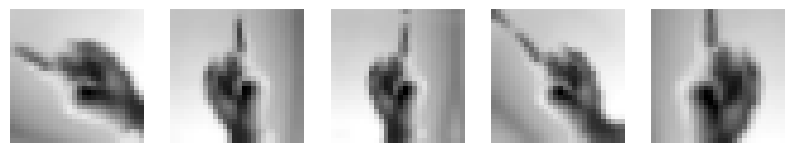

Training model with relu activation function


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - accuracy: 0.1478 - loss: 2.9103
Epoch 2/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.2743 - loss: 2.3188
Epoch 3/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.3279 - loss: 2.1327
Epoch 4/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.3612 - loss: 1.9974
Epoch 5/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.3875 - loss: 1.9155
Epoch 6/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - accuracy: 0.4008 - loss: 1.8752
Epoch 7/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.4160 - loss: 1.8088
Epoch 8/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - accuracy: 0.4366 - loss: 1.7650
Epoch 9/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.4396 - loss: 1.7292
Epoch 10/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.4464 - loss: 1.7178
Test accuracy with relu: 0.3980758488178253

Training model with sigmoid activation function
Epoch 1/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 8s

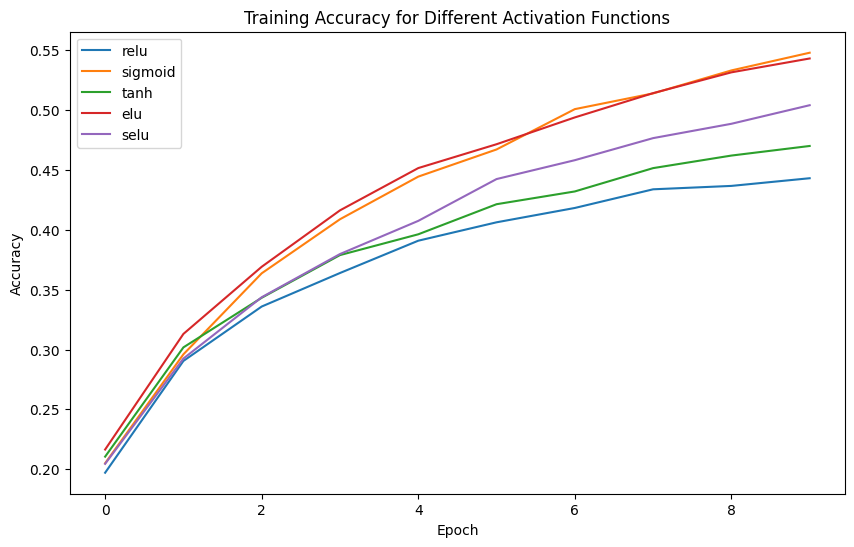

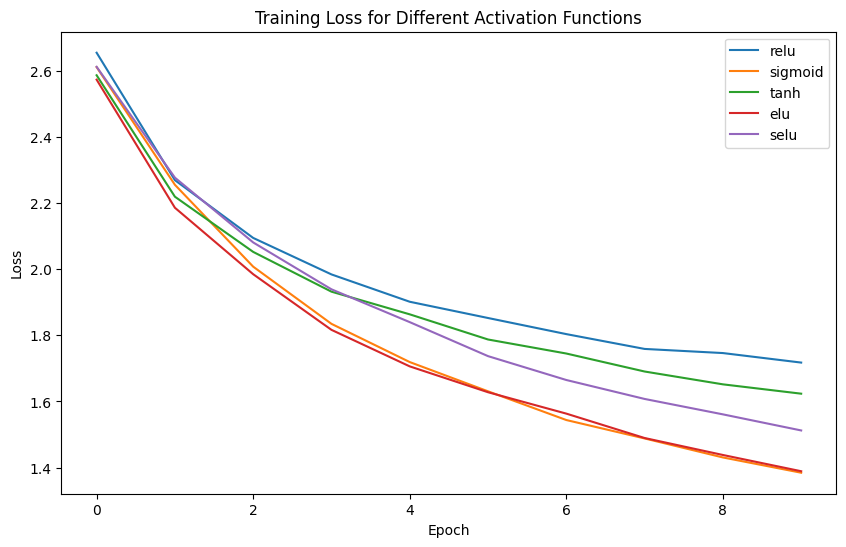

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, RandomRotation, RandomFlip, RandomZoom, BatchNormalization, Dropout
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
x_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize pixel values
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Reshape data to maintain 2D structure (28x28)
x_train = x_train.reshape(-1, 28, 28)
x_test = x_test.reshape(-1, 28, 28)

# Define the data augmentation layer
data_augmentation = Sequential([
    RandomRotation(0.2),  # Rotate images by up to 20% (0.2 radians)
    RandomFlip("horizontal"),  # Flip images horizontally
    RandomZoom(0.2)  # Zoom images by up to 20%
])

# Example: Visualize the effects of augmentation on one image
example_image = x_train[0].reshape(28, 28)
plt.figure(figsize=(10, 5))
for i in range(5):
    augmented_image = data_augmentation(example_image[np.newaxis, :, :, np.newaxis])
    plt.subplot(1, 5, i + 1)
    plt.imshow(augmented_image[0, :, :, 0], cmap="gray")
    plt.axis("off")
plt.show()


# Activation functions to test
activation_functions = ['relu', 'sigmoid', 'tanh', 'elu', 'selu']

# Store results for analysis
history_per_activation = []

# Loop over activation functions
for activation_func in activation_functions:
    print(f"Training model with {activation_func} activation function")

    # Define the model
    model = Sequential([
            data_augmentation,
            Flatten(input_shape=(28, 28)),  # Input layer
            Dense(128, activation=activation_func),
            BatchNormalization(),
            Dense(64, activation=activation_func),
            BatchNormalization(),
            Dense(25, activation='softmax')  # Output layer
    ])

    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model
    history = model.fit(x_train, y_train,
                        epochs=10, batch_size=32, verbose=1)

    # Evaluate the model
    test_loss, test_acc = model.evaluate(x_test, y_test, verbose=0)
    print(f'Test accuracy with {activation_func}: {test_acc}\n')

    # Store history
    history_per_activation.append(history.history)

# Plot training accuracy for each activation function
plt.figure(figsize=(10, 6))
for i, activation_func in enumerate(activation_functions):
    plt.plot(history_per_activation[i]['accuracy'], label=activation_func)

plt.title('Training Accuracy for Different Activation Functions')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training loss for each activation function
plt.figure(figsize=(10, 6))
for i, activation_func in enumerate(activation_functions):
    plt.plot(history_per_activation[i]['loss'], label=activation_func)

plt.title('Training Loss for Different Activation Functions')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


###Cross Validation for Activation Functions

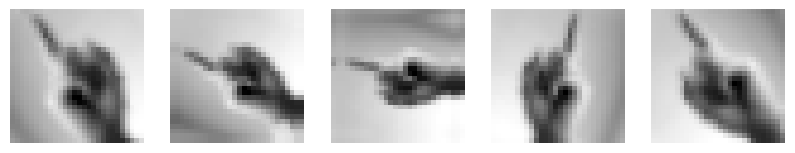


Evaluating model with relu activation function
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


773/773 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.1495 - loss: 2.9304 - val_accuracy: 0.1519 - val_loss: 3.2226
Epoch 2/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.2659 - loss: 2.3668 - val_accuracy: 0.2163 - val_loss: 2.8049
Epoch 3/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.3226 - loss: 2.1708 - val_accuracy: 0.1588 - val_loss: 2.9836
Epoch 4/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.3457 - loss: 2.0560 - val_accuracy: 0.3186 - val_loss: 2.2168
Epoch 5/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3689 - loss: 1.9741 - val_accuracy: 0.2964 - val_loss: 2.2005
Epoch 6/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4011 - loss: 1.8776 - val_accuracy: 0.3252 - val_loss: 2.1382
Epoch 7/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.4047 - loss: 1.8649 - val_accuracy: 0.3602 - val_loss: 1.9574
Epoch 8/10
773/773 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.4291 - loss: 1.7860 - val_accuracy: 0.3991 - va

In [ ]:
from sklearn.model_selection import KFold
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, RandomRotation, RandomFlip, RandomZoom, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
x_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize pixel values
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Reshape data to maintain 2D structure (28x28)
x_train = x_train.reshape(-1, 28, 28)
x_test = x_test.reshape(-1, 28, 28)

# Define the data augmentation layer
data_augmentation = Sequential([
    RandomRotation(0.2),  # Rotate images by up to 20% (0.2 radians)
    RandomFlip("horizontal"),  # Flip images horizontally
    RandomZoom(0.2)  # Zoom images by up to 20%
])

# Example: Visualize the effects of augmentation on one image
example_image = x_train[0].reshape(28, 28)
plt.figure(figsize=(10, 5))
for i in range(5):
    augmented_image = data_augmentation(example_image[np.newaxis, :, :, np.newaxis])
    plt.subplot(1, 5, i + 1)
    plt.imshow(augmented_image[0, :, :, 0], cmap="gray")
    plt.axis("off")
plt.show()

# Define activation functions to experiment with
activation_functions = ['relu', 'sigmoid', 'tanh', 'elu', 'selu']

# Initialize lists to store average validation accuracy for each activation function
avg_val_acc_per_activation = []

# Define the number of folds for cross-validation
num_folds = 10
kf = KFold(n_splits=num_folds)

# Iterate over each activation function
for activation_func in activation_functions:
    print(f"\nEvaluating model with {activation_func} activation function")

    # Initialize list to store validation accuracies for this activation function across folds
    val_acc_scores = []

    # Iterate over the folds for cross-validation
    for train_index, val_index in kf.split(x_train):
        x_train_fold, x_val_fold = x_train[train_index], x_train[val_index]
        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

        # Define and compile the model for the current activation function
        model = Sequential([
            data_augmentation,
            Flatten(input_shape=(28, 28)),  # Input layer
            Dense(128, activation=activation_func),
            BatchNormalization(),
            Dense(64, activation=activation_func),
            BatchNormalization(),
            Dense(25, activation='softmax')  # Output layer
        ])
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        # Train the model on this fold
        early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
        history = model.fit(x_train_fold, y_train_fold,
                            validation_data=(x_val_fold, y_val_fold),
                            epochs=10, batch_size=32, verbose=1,
                            callbacks=[early_stopping])

        # Evaluate the model on the validation set for this fold
        _, val_acc = model.evaluate(x_val_fold, y_val_fold, verbose=0)
        val_acc_scores.append(val_acc)

    # Calculate the average validation accuracy for this activation function across folds
    avg_val_acc = np.mean(val_acc_scores)
    avg_val_acc_per_activation.append(avg_val_acc)
    print(f"Average validation accuracy for {activation_func}: {avg_val_acc:.4f}")

# Determine the best activation function based on average validation accuracy
best_activation_func = activation_functions[np.argmax(avg_val_acc_per_activation)]
print(f"\nBest activation function based on cross-validation: {best_activation_func}")

The results to find the best activation might indicate the sigmoid to be the best but are still pretty mixed, so we should keep open to the other possibilities

###Finding Best number and size of Layers

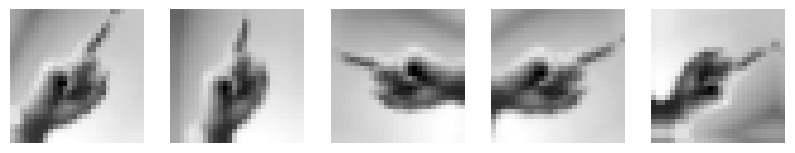

Training model with 1 hidden layer(s) of size 64 and sigmoid activation function


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.1522 - loss: 2.8602 - val_accuracy: 0.2262 - val_loss: 2.6197
Epoch 2/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2180 - loss: 2.5506 - val_accuracy: 0.2054 - val_loss: 2.6421
Epoch 3/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.2539 - loss: 2.4264 - val_accuracy: 0.2460 - val_loss: 2.3891
Epoch 4/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.2888 - loss: 2.2908 - val_accuracy: 0.3304 - val_loss: 2.0877
Epoch 5/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3162 - loss: 2.1979 - val_accuracy: 0.3196 - val_loss: 2.1229
Epoch 6/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.3445 - loss: 2.0919 - val_accuracy: 0.3085 - val_loss: 2.0854
Epoch 7/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.3626 - loss: 2.0419 - val_accuracy: 0.3311 - val_loss: 2.1084
Epoch 8/10
687/687 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3745 - loss: 1.9949 - val_accuracy: 0.

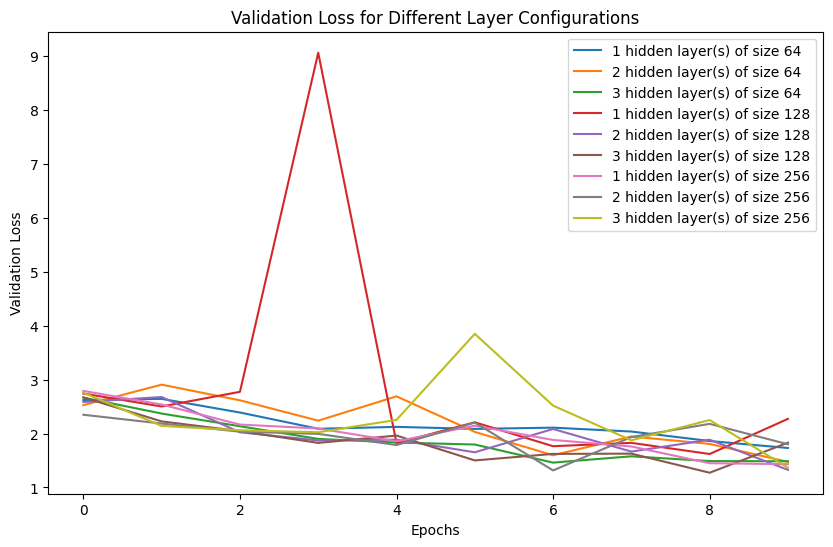

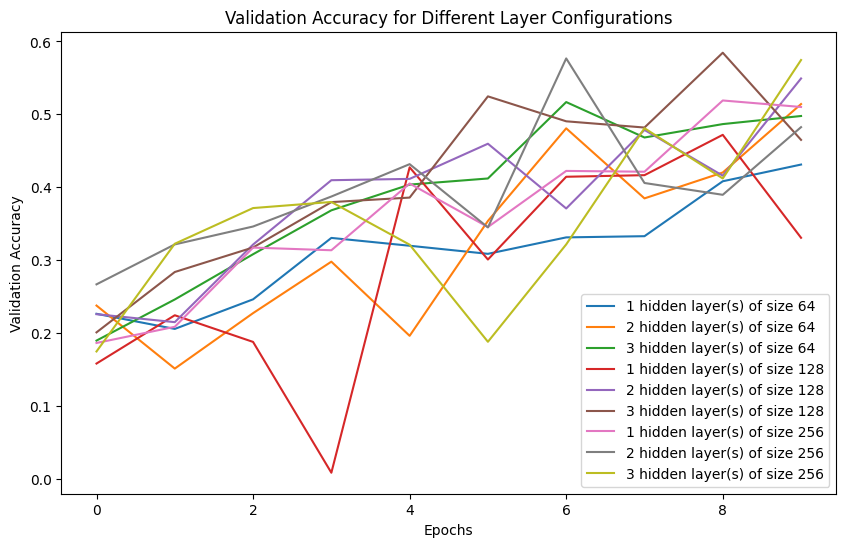

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, RandomRotation, RandomFlip, RandomZoom
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
x_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize pixel values
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Reshape data to maintain 2D structure (28x28)
x_train = x_train.reshape(-1, 28, 28)
x_test = x_test.reshape(-1, 28, 28)

# Define the data augmentation layer
data_augmentation = Sequential([
    RandomRotation(0.2),  # Rotate images by up to 20% (0.2 radians)
    RandomFlip("horizontal"),  # Flip images horizontally
    RandomZoom(0.2)  # Zoom images by up to 20%
])

# Example: Visualize the effects of augmentation on one image
example_image = x_train[0].reshape(28, 28)
plt.figure(figsize=(10, 5))
for i in range(5):
    augmented_image = data_augmentation(example_image[np.newaxis, :, :, np.newaxis])
    plt.subplot(1, 5, i + 1)
    plt.imshow(augmented_image[0, :, :, 0], cmap="gray")
    plt.axis("off")
plt.show()

# Define optimal configurations
best_activation_func = 'sigmoid'

# Layer configurations
layer_sizes = [64, 128, 256]
num_layers = [1, 2, 3]

# Store results
results = []

for size in layer_sizes:
    for num in num_layers:
        print(f"Training model with {num} hidden layer(s) of size {size} and {best_activation_func} activation function")

        # Define the model architecture using the specified activation function
        model = Sequential([
            data_augmentation,  # Include the augmentation layer
            Flatten(input_shape=(28, 28))  # Input layer
        ])

        # Add Optimal Configurations
        for _ in range(num):
            model.add(Dense(size, activation=best_activation_func))  # Using the specified activation function
            model.add(BatchNormalization())  # Normalize the layer output


        model.add(Dense(25, activation='softmax'))  # Output layer

        # Compile the model
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        # Train the model using the augmented data
        history = model.fit(x_train, y_train,
                            validation_split=0.2,  # Use part of the training set for validation
                            epochs=10, batch_size=32)

        # Evaluate the model on test data
        test_loss, test_acc = model.evaluate(x_test, y_test)

        print(f'Test accuracy with {num} hidden layer(s) of size {size} and {best_activation_func} activation function: {test_acc}\n')

        # Store the results
        results.append({
            'num_hidden_layers': num,
            'hidden_layer_size': size,
            'test_accuracy': test_acc,
            'validation_loss': history.history['val_loss'],
            'validation_accuracy': history.history['val_accuracy']
        })

# Plotting Training Loss for Different Layer Configurations
plt.figure(figsize=(10, 6))
for result in results:
    plt.plot(result['validation_loss'], label=f"{result['num_hidden_layers']} hidden layer(s) of size {result['hidden_layer_size']}")

plt.title('Validation Loss for Different Layer Configurations')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.show()

# Plotting Training Accuracy for Different Layer Configurations
plt.figure(figsize=(10, 6))
for result in results:
    plt.plot(result['validation_accuracy'], label=f"{result['num_hidden_layers']} hidden layer(s) of size {result['hidden_layer_size']}")

plt.title('Validation Accuracy for Different Layer Configurations')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.show()


###Cross Validation for Layers

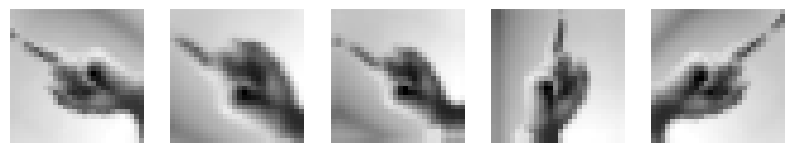


Training models with 1 hidden layer(s) of size 64...
Fold 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Fold 2/10
Fold 3/10
Fold 4/10
Fold 5/10
Fold 6/10
Fold 7/10
Fold 8/10
Fold 9/10
Fold 10/10
Average validation accuracy for 1 layer(s), size 64: 0.2733

Training models with 2 hidden layer(s) of size 64...
Fold 1/10
Fold 2/10
Fold 3/10
Fold 4/10
Fold 5/10
Fold 6/10
Fold 7/10
Fold 8/10
Fold 9/10
Fold 10/10
Average validation accuracy for 2 layer(s), size 64: 0.2030

Training models with 3 hidden layer(s) of size 64...
Fold 1/10
Fold 2/10
Fold 3/10
Fold 4/10
Fold 5/10
Fold 6/10
Fold 7/10
Fold 8/10
Fold 9/10
Fold 10/10
Average validation accuracy for 3 layer(s), size 64: 0.2866

Training models with 1 hidden layer(s) of size 128...
Fold 1/10
Fold 2/10
Fold 3/10
Fold 4/10
Fold 5/10
Fold 6/10
Fold 7/10
Fold 8/10
Fold 9/10
Fold 10/10
Average validation accuracy for 1 layer(s), size 128: 0.2679

Training models with 2 hidden layer(s) of size 128...
Fold 1/10
Fold 2/10
Fold 3/10
Fold 4/10
Fold 5/10
Fold 6/10
Fold 7/10
Fold 8/10
Fold 9/10
Fold 10/10
Average validation accuracy for 2 layer(s), si

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, RandomRotation, RandomFlip, RandomZoom
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import KFold
import numpy as np
import pandas as pd


# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
x_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize pixel values
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Reshape data to maintain 2D structure (28x28)
x_train = x_train.reshape(-1, 28, 28)
x_test = x_test.reshape(-1, 28, 28)

# Define the data augmentation layer
data_augmentation = Sequential([
    RandomRotation(0.2),  # Rotate images by up to 20% (0.2 radians)
    RandomFlip("horizontal"),  # Flip images horizontally
    RandomZoom(0.2)  # Zoom images by up to 20%
])

# Example: Visualize the effects of augmentation on one image
example_image = x_train[0].reshape(28, 28)
plt.figure(figsize=(10, 5))
for i in range(5):
    augmented_image = data_augmentation(example_image[np.newaxis, :, :, np.newaxis])
    plt.subplot(1, 5, i + 1)
    plt.imshow(augmented_image[0, :, :, 0], cmap="gray")
    plt.axis("off")
plt.show()

# Normalize pixel values
X_train = x_train.astype('float32') / 255.0
X_test = x_test.astype('float32') / 255.0

# Define optimal configurations
best_activation_func = 'sigmoid'

# Layer configurations
layer_sizes = [64, 128, 256]
num_layers = [1, 2, 3]

# K-Fold settings
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Results storage
results = []

for size in layer_sizes:
    for num in num_layers:
        print(f"\nTraining models with {num} hidden layer(s) of size {size}...")

        # Validation accuracies for this configuration
        val_acc_scores = []

        # K-Fold cross-validation
        for fold, (train_index, val_index) in enumerate(kf.split(X_train)):
            print(f"Fold {fold + 1}/{num_folds}")

            # Splitting data
            x_train_fold, x_val_fold = X_train[train_index], X_train[val_index]
            y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

            # Reshape data
            x_train_fold = x_train_fold.reshape(-1, 28, 28)
            x_val_fold = x_val_fold.reshape(-1, 28, 28)

            # Model definition
            model = Sequential([
                data_augmentation,  # Include the augmentation layer
                Flatten(input_shape=(28, 28))  # Input layer
        ])
            for _ in range(num):
                model.add(Dense(size, activation=best_activation_func))  # Using the specified activation function
                model.add(BatchNormalization())  # Normalize the layer output

            model.add(Dense(25, activation='softmax'))

            # Compile model
            model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                          loss='sparse_categorical_crossentropy',
                          metrics=['accuracy'])

            # Train model
            model.fit(x_train_fold, y_train_fold,
                      validation_data=(x_val_fold, y_val_fold),
                      epochs=10, batch_size=32, verbose=0)

            # Evaluate model
            _, val_acc = model.evaluate(x_val_fold, y_val_fold, verbose=0)
            val_acc_scores.append(val_acc)


        # Calculate average accuracy for this configuration
        avg_val_acc = np.mean(val_acc_scores)
        print(f"Average validation accuracy for {num} layer(s), size {size}: {avg_val_acc:.4f}")

        # Save result
        results.append({
            'num_hidden_layers': num,
            'hidden_layer_size': size,
            'validation_accuracy': avg_val_acc
        })

# Find best configuration
best_result = max(results, key=lambda r: r['validation_accuracy'])
print(f"\nBest configuration: {best_result['num_hidden_layers']} hidden layer(s) "
      f"of size {best_result['hidden_layer_size']} with accuracy {best_result['validation_accuracy']:.4f}")

The results have given us some hinsights on the best number of layers, which is probably 3, and some suggestions on the possible sizes, but they can't explore all the best combinations, so, much like before, we'll have to keep open

###Finding best Learning Rate

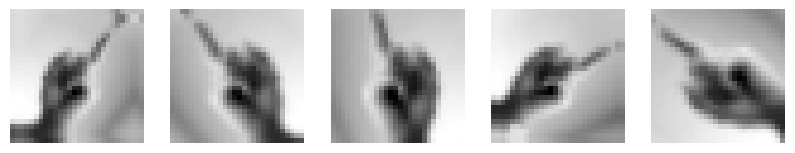

Training model with learning rate: 0.001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5292 - loss: 1.6638
Test accuracy with learning rate 0.001: 0.53973788022995

Training model with learning rate: 0.01
225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0346 - loss: 3.2162
Test accuracy with learning rate 0.01: 0.034439485520124435

Training model with learning rate: 0.1
225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0696 - loss: 3.3818
Test accuracy with learning rate 0.1: 0.0694366991519928



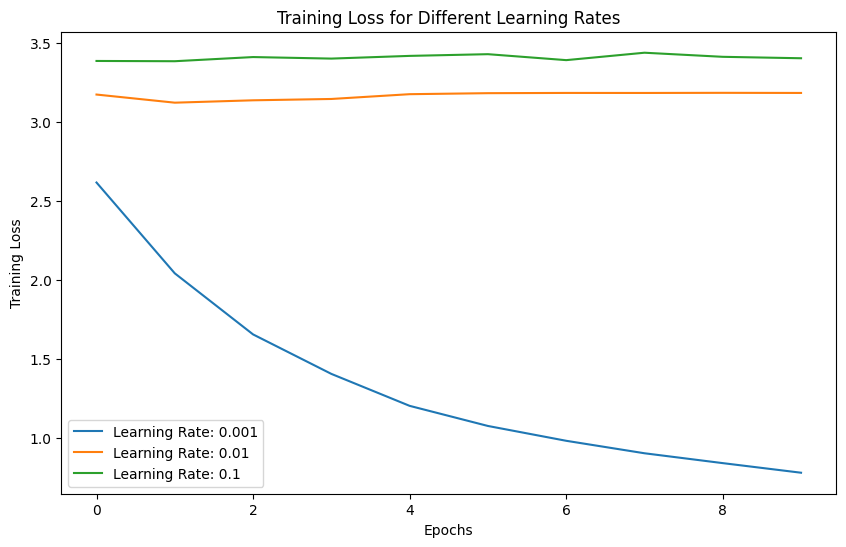

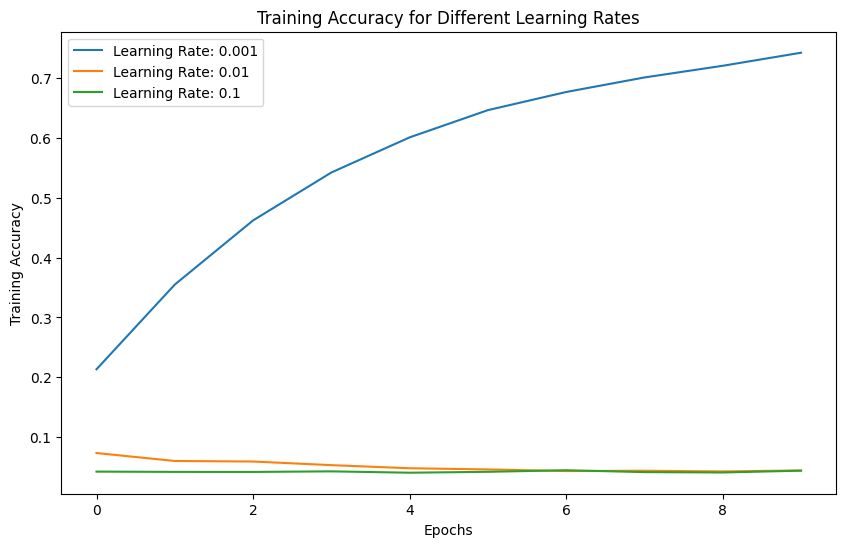

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, RandomRotation, RandomFlip, RandomZoom
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
x_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize pixel values
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# Reshape data to maintain 2D structure (28x28)
x_train = x_train.reshape(-1, 28, 28)
x_test = x_test.reshape(-1, 28, 28)

# Define the data augmentation layer
data_augmentation = Sequential([
    RandomRotation(0.2),  # Rotate images by up to 20% (0.2 radians)
    RandomFlip("horizontal"),  # Flip images horizontally
    RandomZoom(0.2)  # Zoom images by up to 20%
])

# Example: Visualize the effects of augmentation on one image
example_image = x_train[0].reshape(28, 28)
plt.figure(figsize=(10, 5))
for i in range(5):
    augmented_image = data_augmentation(example_image[np.newaxis, :, :, np.newaxis])
    plt.subplot(1, 5, i + 1)
    plt.imshow(augmented_image[0, :, :, 0], cmap="gray")
    plt.axis("off")
plt.show()

# Define the optimal configurations obtained from previous experiments
best_hidden_layers = 2
best_hidden_layer_size = 128
best_activation_func = 'sigmoid'

# Define a range of learning rates to experiment with
learning_rates = [0.001, 0.01, 0.1]

results = []

for lr in learning_rates:
    print(f"Training model with learning rate: {lr}")

    # Define the model architecture using the optimal configurations
    model = Sequential([
            data_augmentation,  # Include the augmentation layer
            Flatten(input_shape=(28, 28))  # Input layer
    ])

        # Add Optimal Configurations
    for _ in range(num):
        model.add(Dense(size, activation=best_activation_func))  # Using the specified activation function
        model.add(BatchNormalization())  # Normalize the layer output

    model.add(Dense(25, activation='softmax'))  # Output layer

    # Compile the model with the current learning rate
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model using the entire dataset without splitting
    history = model.fit(x_train.reshape(-1, 28, 28), y_train,
                        epochs=10, batch_size=32, verbose=0)

    # Evaluate the model on test data
    test_loss, test_acc = model.evaluate(x_test.reshape(-1, 28, 28), y_test)
    print(f'Test accuracy with learning rate {lr}: {test_acc}\n')

    # Store the results
    results.append({
        'learning_rate': lr,
        'test_accuracy': test_acc,
        'validation_loss': history.history['loss'],  # Since there's no validation data
        'validation_accuracy': history.history['accuracy']  # Using training accuracy
    })

# Plotting Training Loss for Different Learning Rates
plt.figure(figsize=(10, 6))
for result in results:
    plt.plot(result['validation_loss'], label=f"Learning Rate: {result['learning_rate']}")

plt.title('Training Loss for Different Learning Rates')
plt.xlabel('Epochs')
plt.ylabel('Training Loss')
plt.legend()
plt.show()

# Plotting Training Accuracy for Different Learning Rates
plt.figure(figsize=(10, 6))
for result in results:
    plt.plot(result['validation_accuracy'], label=f"Learning Rate: {result['learning_rate']}")

plt.title('Training Accuracy for Different Learning Rates')
plt.xlabel('Epochs')
plt.ylabel('Training Accuracy')
plt.legend()
plt.show()

###Cross Validation for Learning Rates

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, RandomRotation, RandomFlip, RandomZoom, BatchNormalization
from sklearn.model_selection import KFold
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Preprocessing
x_train = train_data.drop(columns=['label']).values.astype('float32') / 255.0
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values.astype('float32') / 255.0
y_test = test_data['label'].values

x_train = x_train.reshape(-1, 28, 28, 1)
x_test = x_test.reshape(-1, 28, 28, 1)

# Data Augmentation
data_augmentation = Sequential([
    RandomRotation(0.2),
    RandomFlip("horizontal"),
    RandomZoom(0.2)
])

# Model parameters
best_hidden_layers = 3
best_hidden_layer_size = 128
best_activation_func = 'sigmoid'
learning_rates = [0.001, 0.01, 0.1]
best_learning_rate = None
best_avg_test_acc = 0.0

# Cross-validation setup
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

for lr in learning_rates:
    print(f"Training model with learning rate: {lr}")
    test_acc_scores = []

    for train_idx, val_idx in kf.split(x_train):
        x_train_fold, x_val_fold = x_train[train_idx], x_train[val_idx]
        y_train_fold, y_val_fold = y_train[train_idx], y_train[val_idx]

        model = Sequential([
            Input(shape=(28, 28, 1)),  # Define the input shape explicitly
            data_augmentation,
            Flatten()
        ])
        for _ in range(best_hidden_layers):
            model.add(Dense(best_hidden_layer_size, activation=best_activation_func))
            model.add(BatchNormalization())
        model.add(Dense(25, activation='softmax'))

        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        history = model.fit(
            x_train_fold, y_train_fold,
            validation_data=(x_val_fold, y_val_fold),
            epochs=10, batch_size=32, verbose=0
        )

        _, test_acc = model.evaluate(x_test, y_test, verbose=0)
        test_acc_scores.append(test_acc)

    avg_test_acc = np.mean(test_acc_scores)
    print(f"Average test accuracy with learning rate {lr}: {avg_test_acc}\n")

    if avg_test_acc > best_avg_test_acc:
        best_avg_test_acc = avg_test_acc
        best_learning_rate = lr

print(f"Best learning rate: {best_learning_rate} with average test accuracy: {best_avg_test_acc}")


Training model with learning rate: 0.001
Average test accuracy with learning rate 0.001: 0.46611823737621305

Training model with learning rate: 0.01
Average test accuracy with learning rate 0.01: 0.03908254336565733

Training model with learning rate: 0.1
Average test accuracy with learning rate 0.1: 0.03361684381961823

Best learning rate: 0.001 with average test accuracy: 0.46611823737621305


In this case, the results are clear

###Finding best number of Epochs

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Preprocessing
x_train = train_data.drop(columns=['label']).values.astype('float32') / 255.0
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values.astype('float32') / 255.0
y_test = test_data['label'].values

x_train = x_train.reshape(-1, 28, 28, 1)  # Add channel dimension
x_test = x_test.reshape(-1, 28, 28, 1)

# Define the data augmentation generator
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

data_gen.fit(x_train)

# Define model parameters
best_hidden_layers = 2
best_hidden_layer_size = 128
best_activation_func = 'sigmoid'
best_learning_rate = 0.001
epochs_list = [10, 20, 30]

# Store results
results = []

for epochs in epochs_list:
    print(f"Training model for {epochs} epochs.")

    # Model architecture
    model = Sequential([
        Flatten(input_shape=(28, 28, 1))
    ])
    for _ in range(best_hidden_layers):
        model.add(Dense(best_hidden_layer_size, activation=best_activation_func))
        model.add(BatchNormalization())
    model.add(Dense(25, activation='softmax'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=best_learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Train with augmented data
    history = model.fit(
        data_gen.flow(x_train, y_train, batch_size=32),  # Augmented training data
        validation_data=(x_test, y_test),  # Validation with test data
        epochs=epochs,
        verbose=0
    )

    # Evaluate on test data
    test_loss, test_acc = model.evaluate(x_test, y_test, verbose=0)
    print(f'Test accuracy after {epochs} epochs: {test_acc}')

    # Store results
    results.append({
        'epochs': epochs,
        'test_accuracy': test_acc,
        'validation_accuracy': history.history['val_accuracy']
    })


Training model for 10 epochs.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Test accuracy after 10 epochs: 0.4475739002227783
Training model for 20 epochs.
Test accuracy after 20 epochs: 0.5758505463600159
Training model for 30 epochs.
Test accuracy after 30 epochs: 0.609592854976654


###Cross validation for Epochs

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import KFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np

# Load data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Preprocessing
x_train = train_data.drop(columns=['label']).values.astype('float32') / 255.0
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values.astype('float32') / 255.0
y_test = test_data['label'].values

x_train = x_train.reshape(-1, 28, 28, 1)
x_test = x_test.reshape(-1, 28, 28, 1)

# Data Augmentation
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
data_gen.fit(x_train)

# Model parameters
best_hidden_layers = 2
best_hidden_layer_size = 128
best_activation_func = 'sigmoid'
best_learning_rate = 0.001
epochs_list = [10, 20, 30]

# Cross-validation
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

for epochs in epochs_list:
    print(f"Training model with epochs: {epochs}")
    test_acc_scores = []

    for train_idx, val_idx in kf.split(x_train):
        x_train_fold, x_val_fold = x_train[train_idx], x_train[val_idx]
        y_train_fold, y_val_fold = y_train[train_idx], y_train[val_idx]

        model = Sequential([
            Flatten(input_shape=(28, 28, 1))
        ])
        for _ in range(best_hidden_layers):
            model.add(Dense(best_hidden_layer_size, activation=best_activation_func))
            model.add(BatchNormalization())
        model.add(Dense(25, activation='softmax'))

        model.compile(optimizer=Adam(learning_rate=best_learning_rate),
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        history = model.fit(
            data_gen.flow(x_train_fold, y_train_fold, batch_size=32),
            validation_data=(x_val_fold, y_val_fold),
            epochs=epochs, verbose=0
        )

        _, test_acc = model.evaluate(x_test, y_test, verbose=0)
        test_acc_scores.append(test_acc)

    avg_test_acc = np.mean(test_acc_scores)
    print(f"Average test accuracy with epochs {epochs}: {avg_test_acc}\n")


Training model with epochs: 10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Average test accuracy with epochs 10: 0.40223089754581454

Training model with epochs: 20
Average test accuracy with epochs 20: 0.47848578095436095

Training model with epochs: 30
Average test accuracy with epochs 30: 0.5696458488702774



###Threshold Validation

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Preprocessing
x_train = train_data.drop(columns=['label']).values.astype('float32') / 255.0
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values.astype('float32') / 255.0
y_test = test_data['label'].values

x_train = x_train.reshape(-1, 28, 28, 1)  # Add channel dimension
x_test = x_test.reshape(-1, 28, 28, 1)

# Define data augmentation
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
data_gen.fit(x_train)

# Model parameters
best_hidden_layers = 2
best_hidden_layer_size = 128
best_activation_func = 'sigmoid'
best_learning_rate = 0.001
best_epochs = 30
thresholds = [0.001, 0.01, 0.1]

accuracy_per_threshold = {}

for threshold in thresholds:
    print(f"Training model with validation threshold: {threshold}")

    # Model architecture
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28, 1)))
    for _ in range(best_hidden_layers):
        model.add(Dense(best_hidden_layer_size, activation=best_activation_func))
        model.add(BatchNormalization())
    model.add(Dense(25, activation='softmax'))  # 26 classes for A-Z

    # Compile model
    model.compile(
        optimizer=Adam(learning_rate=best_learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Early stopping with the current threshold
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=5,
        min_delta=threshold,
        mode='min',
        verbose=1
    )

    # Train model
    history = model.fit(
        data_gen.flow(x_train, y_train, batch_size=32),  # Augmented training data
        validation_data=(x_test, y_test),
        epochs=best_epochs,
        callbacks=[early_stopping],
        verbose=1
    )

    # Evaluate the model
    test_loss, test_acc = model.evaluate(x_test, y_test, verbose=0)
    accuracy_per_threshold[threshold] = test_acc
    print(f"Test accuracy with validation threshold {threshold}: {test_acc}\n")

# Display results
print("Accuracy for each threshold:")
for threshold, accuracy in accuracy_per_threshold.items():
    print(f"Threshold: {threshold}, Test Accuracy: {accuracy}")


Training model with validation threshold: 0.001
Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


  4/858 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - accuracy: 0.0339 - loss: 3.9021

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


858/858 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.1360 - loss: 2.9887 - val_accuracy: 0.1695 - val_loss: 2.7983
Epoch 2/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - accuracy: 0.2132 - loss: 2.5855 - val_accuracy: 0.2093 - val_loss: 2.4429
Epoch 3/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - accuracy: 0.2531 - loss: 2.4132 - val_accuracy: 0.2415 - val_loss: 2.3194
Epoch 4/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - accuracy: 0.2856 - loss: 2.2846 - val_accuracy: 0.3509 - val_loss: 2.0060
Epoch 5/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - accuracy: 0.3063 - loss: 2.2024 - val_accuracy: 0.3699 - val_loss: 1.9576
Epoch 6/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - accuracy: 0.3321 - loss: 2.1128 - val_accuracy: 0.3787 - val_loss: 1.9218
Epoch 7/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - accuracy: 0.3496 - loss: 2.0475 - val_accuracy: 0.4201 - val_loss: 1.7468
Epoch 8/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - accuracy: 0.3688 - loss: 1.9926 - val_accurac

###Optimal Values

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Preprocessing
x_train = train_data.drop(columns=['label']).values.astype('float32') / 255.0
y_train = train_data['label'].values
x_test = test_data.drop(columns=['label']).values.astype('float32') / 255.0
y_test = test_data['label'].values

x_train = x_train.reshape(-1, 28, 28, 1)  # Add channel dimension
x_test = x_test.reshape(-1, 28, 28, 1)

# Define data augmentation

# Data augmentation
data_gen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
data_gen.fit(x_train)

# Learning rate scheduler
def lr_schedule(epoch):
    initial_lr = 0.001
    drop = 0.5
    epochs_drop = 10
    return initial_lr * (drop ** (epoch // epochs_drop))

lr_scheduler = LearningRateScheduler(lr_schedule)

# Define the model
model = Sequential()
model.add(Flatten(input_shape=(28, 28, 1)))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(64, activation='relu'))
model.add(Dense(25, activation='softmax'))  # 25 output classes

# Compile the model
model.compile(
    optimizer=Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Define early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    min_delta=0.001,
    mode='min',
    verbose=1
)

# Train the model
history = model.fit(
    data_gen.flow(x_train, y_train, batch_size=32),
    validation_data=(x_test, y_test),
    epochs=30,
    callbacks=[lr_scheduler, early_stopping],
    verbose=1
)

# Evaluate the model
val_loss, val_acc = model.evaluate(x_test, y_test)
print(f'Validation accuracy: {val_acc}')

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


  4/858 ━━━━━━━━━━━━━━━━━━━━ 15s 18ms/step - accuracy: 0.0495 - loss: 3.5342

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


858/858 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - accuracy: 0.3308 - loss: 2.2358 - val_accuracy: 0.3804 - val_loss: 2.1092 - learning_rate: 0.0010
Epoch 2/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - accuracy: 0.5846 - loss: 1.2732 - val_accuracy: 0.4682 - val_loss: 1.6962 - learning_rate: 0.0010
Epoch 3/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - accuracy: 0.6723 - loss: 1.0083 - val_accuracy: 0.4191 - val_loss: 2.1891 - learning_rate: 0.0010
Epoch 4/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - accuracy: 0.7101 - loss: 0.8741 - val_accuracy: 0.6523 - val_loss: 1.1193 - learning_rate: 0.0010
Epoch 5/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - accuracy: 0.7360 - loss: 0.7910 - val_accuracy: 0.6966 - val_loss: 0.9140 - learning_rate: 0.0010
Epoch 6/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - accuracy: 0.7626 - loss: 0.7033 - val_accuracy: 0.6332 - val_loss: 1.1274 - learning_rate: 0.0010
Epoch 7/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - accuracy: 0.7812 - loss: 0.6521

225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


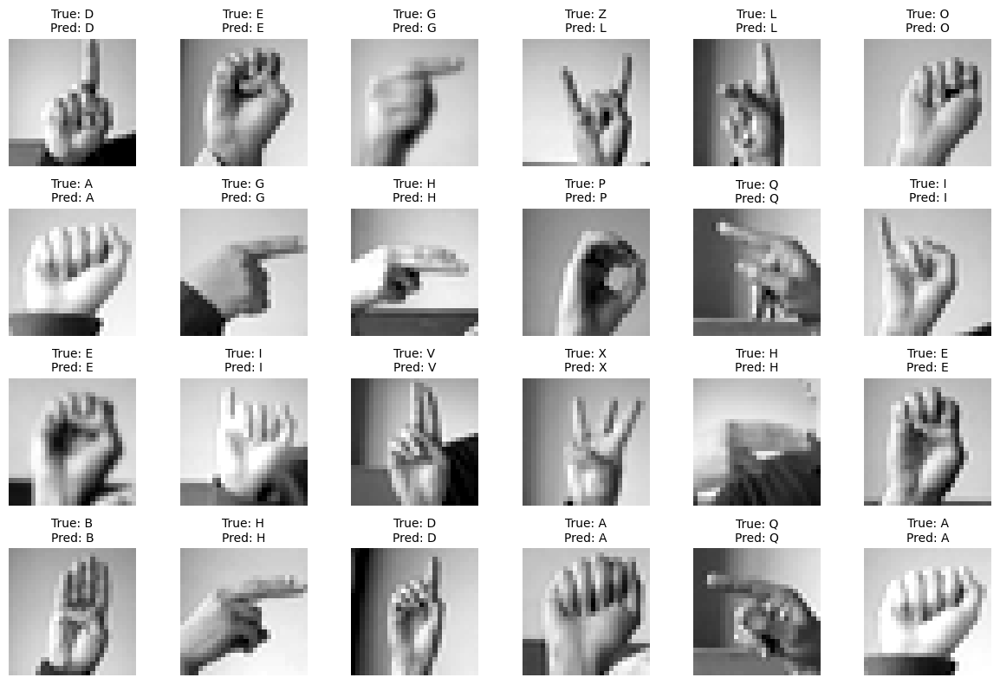

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate predictions for the test set
predictions = model.predict(x_test)

# Select 24 random samples from the test set
num_samples = 24
random_indices = np.random.choice(len(x_test), num_samples, replace=False)
sample_images = x_test[random_indices]
sample_labels = y_test[random_indices]
sample_predictions = np.argmax(predictions[random_indices], axis=1)

# Map the numeric labels to letters (A-Z, skipping J)
def label_to_letter(label):
    return chr(label + 65) if label < 9 else chr(label + 66)

# Plot the 24 images in a grid
plt.figure(figsize=(12, 8))
for i in range(num_samples):
    plt.subplot(4, 6, i + 1)
    plt.imshow(sample_images[i].reshape(28, 28), cmap='gray')
    true_label = label_to_letter(sample_labels[i])
    pred_label = label_to_letter(sample_predictions[i])
    plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

**Conclusions on the MLP**

While the MLP is not the ideal choice for image classification tasks, as we expected, the final results were encouraging. More importantly, they provided valuable insights that helped us design our CNNs. Data augmentation proved to be an excellent strategy for improving generalization in this model and Early Stopping allowed us to stop when the model wasn't learning anymore

##CNN

The goal was to classify hand signs from the Sign Language MNIST dataset using Convolutional Neural Networks (CNNs). This involved designing, training, and optimizing the CNN architecture to achieve high accuracy while minimizing overfitting. A secondary aim was to explore the impact of various hyperparameter configurations on the model's performance.

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Reshape and normalize the images
X_train = X_train.reshape(-1, 28, 28, 1) / 255.0
X_test = X_test.reshape(-1, 28, 28, 1) / 255.0

# Convert labels to categorical (one-hot encoding)
y_train = to_categorical(y_train, num_classes=25)  # Adjust for 26 classes (A-Z)
y_test = to_categorical(y_test, num_classes=25)

# Define the data augmentation generator
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Fit the generator on training data
data_gen.fit(X_train)

# Define the CNN model with all your optimized parameters
model = Sequential([
    Conv2D(32, (3, 3), activation='sigmoid', input_shape=(28, 28, 1)),  # Optimal activation function
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='sigmoid'),  # Continue with optimal activation
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='sigmoid'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='sigmoid'),  # Increased layer size for better learning
    Dropout(0.5),  # Regularization
    Dense(25, activation='softmax')  # Final layer for classification
])

# Compile the model with the best learning rate
model.compile(optimizer=Adam(learning_rate=0.001),  # Optimized learning rate
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implement early stopping for better generalization
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model using the data generator
history = model.fit(data_gen.flow(X_train, y_train, batch_size=32),
                    epochs=30,  # Allow sufficient epochs, stop early if needed
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping],
                    verbose=1)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy:.4f}')


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30
  1/858 ━━━━━━━━━━━━━━━━━━━━ 1:20:11 6s/step - accuracy: 0.0312 - loss: 3.7134

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


858/858 ━━━━━━━━━━━━━━━━━━━━ 67s 71ms/step - accuracy: 0.1911 - loss: 2.7139 - val_accuracy: 0.6216 - val_loss: 1.1203
Epoch 2/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 81s 70ms/step - accuracy: 0.5567 - loss: 1.3531 - val_accuracy: 0.7637 - val_loss: 0.6777
Epoch 3/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 82s 70ms/step - accuracy: 0.6703 - loss: 0.9878 - val_accuracy: 0.7971 - val_loss: 0.5672
Epoch 4/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 90s 79ms/step - accuracy: 0.7245 - loss: 0.8140 - val_accuracy: 0.8875 - val_loss: 0.3094
Epoch 5/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 88s 86ms/step - accuracy: 0.7675 - loss: 0.6932 - val_accuracy: 0.6905 - val_loss: 1.0609
Epoch 6/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 61s 70ms/step - accuracy: 0.7896 - loss: 0.6170 - val_accuracy: 0.8882 - val_loss: 0.2898
Epoch 7/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 82s 71ms/step - accuracy: 0.8131 - loss: 0.5662 - val_accuracy: 0.8296 - val_loss: 0.4399
Epoch 8/30
858/858 ━━━━━━━━━━━━━━━━━━━━ 82s 71ms/step - accuracy: 0.8273 - loss: 0.5247 - val_accurac

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

def create_cnn_model(conv_layers, dense_layers, kernel_size, pool_size, dropout_rate, learning_rate):
    model = Sequential()

    # Add convolutional and pooling layers
    for i, filters in enumerate(conv_layers):
        if i == 0:
            model.add(Conv2D(filters, kernel_size, activation='sigmoid', input_shape=(28, 28, 1)))
        else:
            model.add(Conv2D(filters, kernel_size, activation='sigmoid'))
        model.add(BatchNormalization())  # Add Batch Normalization
        model.add(MaxPooling2D(pool_size))

    model.add(Flatten())

    # Add fully connected layers
    for units in dense_layers:
        model.add(Dense(units, activation='sigmoid'))

    if dropout_rate > 0:
        model.add(Dropout(dropout_rate))

    # Output layer
    model.add(Dense(26, activation='softmax'))  # Assuming 26 classes (A-Z)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

In [ ]:
# Load and preprocess data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

X_train = train_data.drop(columns=['label']).values.reshape(-1, 28, 28, 1) / 255.0
y_train = tf.keras.utils.to_categorical(train_data['label'], num_classes=25)

X_test = test_data.drop(columns=['label']).values.reshape(-1, 28, 28, 1) / 255.0
y_test = tf.keras.utils.to_categorical(test_data['label'], num_classes=25)

# Data augmentation
data_gen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Hyperparameter configurations
hyperparameters = [
    {
        'conv_layers': [32, 64],
        'dense_layers': [64],
        'kernel_size': (3, 3),
        'pool_size': (2, 2),
        'dropout_rate': 0.2,
        'learning_rate': 0.001
    },
    {
        'conv_layers': [32, 64, 128],
        'dense_layers': [128],
        'kernel_size': (3, 3),
        'pool_size': (2, 2),
        'dropout_rate': 0.3,
        'learning_rate': 0.0005
    }
]

# Evaluate models with different hyperparameters
best_accuracy = 0
best_params = None

for params in hyperparameters:
    print(f"Training with hyperparameters: {params}")

    model = create_cnn_model(**params)
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

    history = model.fit(data_gen.flow(X_train, y_train, batch_size=32),
                        validation_data=(X_test, y_test),
                        epochs=20,
                        callbacks=[early_stopping],
                        verbose=1)

    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    print(f"Test accuracy: {test_accuracy:.2f}\n")

    if test_accuracy > best_accuracy:
        best_accuracy = test_accuracy
        best_params = params

print(f"Best Accuracy: {best_accuracy:.2f}")
print(f"Best Hyperparameters: {best_params}")

Training with hyperparameters: {'conv_layers': [32, 64], 'dense_layers': [64], 'kernel_size': (3, 3), 'pool_size': (2, 2), 'dropout_rate': 0.2, 'learning_rate': 0.001}


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
  1/858 ━━━━━━━━━━━━━━━━━━━━ 43:49 3s/step - accuracy: 0.0312 - loss: 3.6081

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


858/858 ━━━━━━━━━━━━━━━━━━━━ 61s 68ms/step - accuracy: 0.1885 - loss: 2.7414 - val_accuracy: 0.3197 - val_loss: 2.5120
Epoch 2/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 82s 67ms/step - accuracy: 0.4721 - loss: 1.7089 - val_accuracy: 0.7178 - val_loss: 0.9772
Epoch 3/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - accuracy: 0.5854 - loss: 1.2998 - val_accuracy: 0.7227 - val_loss: 0.8233
Epoch 4/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.6724 - loss: 1.0454 - val_accuracy: 0.6948 - val_loss: 0.9775
Epoch 5/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.7020 - loss: 0.9279 - val_accuracy: 0.7791 - val_loss: 0.6979
Epoch 6/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 80s 64ms/step - accuracy: 0.7472 - loss: 0.7904 - val_accuracy: 0.8931 - val_loss: 0.3702
Epoch 7/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 83s 65ms/step - accuracy: 0.7694 - loss: 0.7205 - val_accuracy: 0.8139 - val_loss: 0.5921
Epoch 8/20
858/858 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - accuracy: 0.7859 - loss: 0.6492 - val_accurac

Training CNN with Conv: (32, (3, 3), 'relu'), Pooling: (2, 2), Dense: 64, Batch: 32


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - accuracy: 0.1816 - loss: 2.7002
Epoch 2/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - accuracy: 0.6593 - loss: 0.9908
Epoch 3/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - accuracy: 0.7763 - loss: 0.6407
Epoch 4/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - accuracy: 0.8295 - loss: 0.4794
Epoch 5/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - accuracy: 0.8634 - loss: 0.3804
Epoch 6/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - accuracy: 0.8858 - loss: 0.3194
Epoch 7/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - accuracy: 0.9025 - loss: 0.2736
Epoch 8/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - accuracy: 0.9185 - loss: 0.2329
Epoch 9/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - accuracy: 0.9222 - loss: 0.2165
Epoch 10/10
858/858 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - accuracy: 0.9290 - loss: 0.1976
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9416 - loss: 0.1824
Test accuracy with Conv: (32, (3, 3), 'relu'

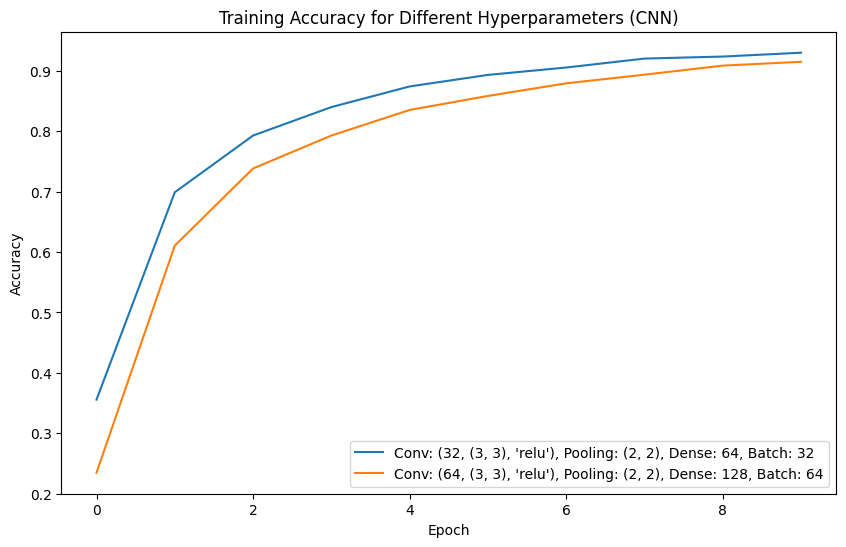

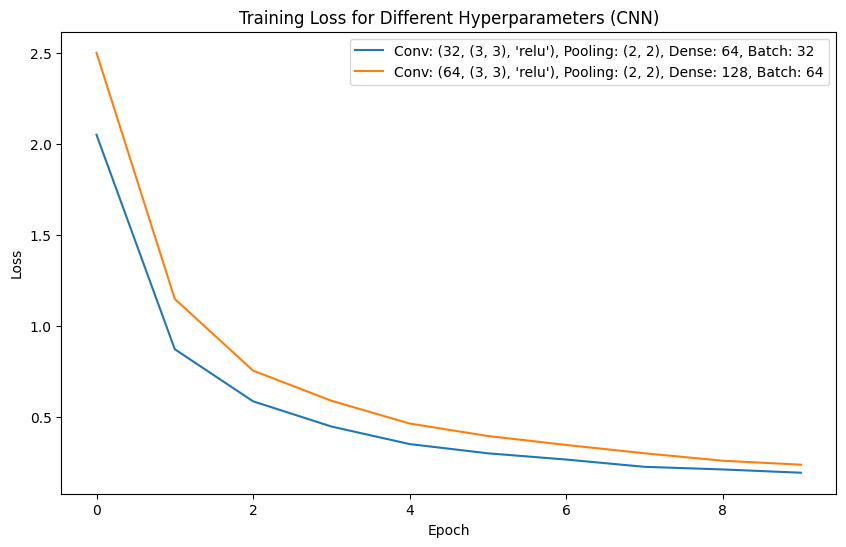

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import pandas as pd
import matplotlib.pyplot as plt

# Load and preprocess data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

x_train = train_data.drop(columns=['label']).values.reshape(-1, 28, 28, 1) / 255.0
y_train = tf.keras.utils.to_categorical(train_data['label'], num_classes=25)

x_test = test_data.drop(columns=['label']).values.reshape(-1, 28, 28, 1) / 255.0
y_test = tf.keras.utils.to_categorical(test_data['label'], num_classes=25)

# Define lists of hyperparameters to experiment with
conv_layers = [(32, (3, 3), 'relu'), (64, (3, 3), 'relu')]
pooling_layers = [(2, 2), (2, 2)]
dense_layers = [64, 128]
epochs = 10
batch_sizes = [32, 64]

# Initialize lists to store history for each set of hyperparameters
history_per_hyperparam = []

for conv_params in conv_layers:
    for pooling_params in pooling_layers:
        for dense_units in dense_layers:
            for batch_size in batch_sizes:
                print(f"Training CNN with Conv: {conv_params}, Pooling: {pooling_params}, Dense: {dense_units}, Batch: {batch_size}")

                # Define the CNN model with varying hyperparameters
                model = Sequential([
                    Conv2D(conv_params[0], conv_params[1], activation=conv_params[2], input_shape=(28, 28, 1)),
                    MaxPooling2D(pooling_params),
                    Dropout(0.2),  # Add Dropout layer after Conv2D
                    Conv2D(conv_params[0], conv_params[1], activation=conv_params[2]),
                    MaxPooling2D(pooling_params),
                    Dropout(0.2),
                    Flatten(),
                    Dense(dense_units, activation='relu'),
                    Dropout(0.5),
                    Dense(25, activation='softmax')
                ])

                # Compile the model
                model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

                # Train the model
                history = model.fit(x_train, y_train,
                                    epochs=epochs, batch_size=batch_size)

                # Evaluate the model on test data
                test_loss, test_accuracy = model.evaluate(x_test, y_test)
                print(f'Test accuracy with Conv: {conv_params}, Pooling: {pooling_params}, Dense: {dense_units}, Batch: {batch_size}: {test_accuracy}\n')

                # Store the history for this set of hyperparameters
                history_per_hyperparam.append(history.history)

# Plot accuracy for different hyperparameters
plt.figure(figsize=(10, 6))
for i, (conv_params, pooling_params, dense_units, batch_size) in enumerate(zip(conv_layers, pooling_layers, dense_layers, batch_sizes)):
    plt.plot(history_per_hyperparam[i]['accuracy'], label=f'Conv: {conv_params}, Pooling: {pooling_params}, Dense: {dense_units}, Batch: {batch_size}')

plt.title('Training Accuracy for Different Hyperparameters (CNN)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot loss for different hyperparameters
plt.figure(figsize=(10, 6))
for i, (conv_params, pooling_params, dense_units, batch_size) in enumerate(zip(conv_layers, pooling_layers, dense_layers, batch_sizes)):
    plt.plot(history_per_hyperparam[i]['loss'], label=f'Conv: {conv_params}, Pooling: {pooling_params}, Dense: {dense_units}, Batch: {batch_size}')

plt.title('Training Loss for Different Hyperparameters (CNN)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

###Best Optimizer

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize the data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Reshape the data
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
datagen.fit(X_train)

# Define the optimizers
optimizers = [
    Adam(learning_rate=0.001),
    SGD(learning_rate=0.01, momentum=0.9),
    RMSprop(learning_rate=0.0005),
]

results = []

for optimizer in optimizers:
    print(f"Training model with {optimizer.get_config()['name']} optimizer")

    # Define the model architecture
    model = Sequential([
        Conv2D(conv_params[0], conv_params[1], activation=conv_params[2], input_shape=(28, 28, 1)),
        MaxPooling2D(pooling_params),
        Dropout(0.2),  # Add Dropout layer after Conv2D
        Conv2D(conv_params[0], conv_params[1], activation=conv_params[2]),
        MaxPooling2D(pooling_params),
        Dropout(0.2),  # Add Dropout layer after Conv2D
        Flatten(),
        Dense(dense_units, activation='relu'),
        Dropout(0.5),
        Dense(25, activation='softmax')  # Assuming 10 classes
    ])

    # Compile the model
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model
    history = model.fit(
        datagen.flow(X_train, y_train, batch_size=64),
        validation_data=(X_val, y_val),
        epochs=20,
        verbose=1
    )

    # Evaluate the model
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=1)
    print(f"Test accuracy with {optimizer.get_config()['name']} optimizer: {test_acc}\n")

    # Store the results
    results.append({
        'optimizer_name': optimizer.get_config()['name'],
        'test_accuracy': test_acc,
        'training_loss': history.history['loss'],
        'training_accuracy': history.history['accuracy']
    })

# Find the best optimizer
best_optimizer = max(results, key=lambda x: x['test_accuracy'])
print(f"Best optimizer: {best_optimizer['optimizer_name']} with accuracy {best_optimizer['test_accuracy']}")


Training model with adam optimizer


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


344/344 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - accuracy: 0.0843 - loss: 3.0721 - val_accuracy: 0.7081 - val_loss: 1.2627
Epoch 2/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - accuracy: 0.4444 - loss: 1.7428 - val_accuracy: 0.8547 - val_loss: 0.5987
Epoch 3/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 83s 135ms/step - accuracy: 0.5911 - loss: 1.2205 - val_accuracy: 0.8845 - val_loss: 0.4056
Epoch 4/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - accuracy: 0.6674 - loss: 0.9862 - val_accuracy: 0.9248 - val_loss: 0.3027
Epoch 5/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 81s 132ms/step - accuracy: 0.7120 - loss: 0.8572 - val_accuracy: 0.9455 - val_loss: 0.2281
Epoch 6/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 81s 129ms/step - accuracy: 0.7458 - loss: 0.7478 - val_accuracy: 0.9628 - val_loss: 0.1774
Epoch 7/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 91s 154ms/step - accuracy: 0.7689 - loss: 0.6820 - val_accuracy: 0.9723 - val_loss: 0.1385
Epoch 8/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - accuracy: 0.7976 - loss: 0.5961 - val

###Best Learning Rate

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize the data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Reshape the data
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
datagen.fit(X_train)

# Define learning rates to experiment with
learning_rates = [0.001, 0.01, 0.0001]

results = []

for lr in learning_rates:
    print(f"Training model with Adam optimizer and learning rate: {lr}")

    # Define the model architecture
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)),
        MaxPooling2D((2, 2)),
        Dropout(0.2),  # Add Dropout layer after Conv2D
        Conv2D(32, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.2),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(25, activation='softmax')  # 25 classes for the Sign Language MNIST dataset
    ])

    # Compile the model
    optimizer = Adam(learning_rate=lr)
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model
    history = model.fit(
        datagen.flow(X_train, y_train, batch_size=64),
        validation_data=(X_val, y_val),
        epochs=20,
        verbose=1
    )

    # Evaluate the model
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=1)
    print(f"Test accuracy with learning rate {lr}: {test_acc}\n")

    # Store the results
    results.append({
        'learning_rate': lr,
        'test_accuracy': test_acc,
        'training_loss': history.history['loss'],
        'training_accuracy': history.history['accuracy']
    })

# Find the best learning rate
best_lr = max(results, key=lambda x: x['test_accuracy'])
print(f"Best learning rate: {best_lr['learning_rate']} with accuracy {best_lr['test_accuracy']}")


Training model with Adam optimizer and learning rate: 0.001


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


344/344 ━━━━━━━━━━━━━━━━━━━━ 31s 85ms/step - accuracy: 0.0900 - loss: 3.0605 - val_accuracy: 0.5891 - val_loss: 1.5851
Epoch 2/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 85ms/step - accuracy: 0.3891 - loss: 1.9662 - val_accuracy: 0.7760 - val_loss: 0.8032
Epoch 3/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.5460 - loss: 1.3983 - val_accuracy: 0.8598 - val_loss: 0.5009
Epoch 4/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - accuracy: 0.6411 - loss: 1.0846 - val_accuracy: 0.9268 - val_loss: 0.3705
Epoch 5/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - accuracy: 0.6890 - loss: 0.9208 - val_accuracy: 0.9435 - val_loss: 0.2867
Epoch 6/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - accuracy: 0.7311 - loss: 0.8021 - val_accuracy: 0.9698 - val_loss: 0.2092
Epoch 7/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - accuracy: 0.7463 - loss: 0.7411 - val_accuracy: 0.9727 - val_loss: 0.1768
Epoch 8/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.7727 - loss: 0.6711 - val_accurac

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Load the data
train_data = pd.read_csv('sign_mnist_train.csv')
test_data = pd.read_csv('sign_mnist_test.csv')

# Separate features and target
X_train = train_data.drop(columns=['label']).values
y_train = train_data['label'].values
X_test = test_data.drop(columns=['label']).values
y_test = test_data['label'].values

# Normalize the data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Reshape the data
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)
datagen.fit(X_train)

# Define learning rates to experiment with
lr = 0.001

# Define epochs to experiment with
epochs =  20

results = []


        # Define the model architecture
model = Sequential([
          Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)),
          MaxPooling2D((2, 2)),
          Dropout(0.2),  # Add Dropout layer after Conv2D
          Conv2D(32, (3, 3), activation='relu'),
          MaxPooling2D((2, 2)),
          Dropout(0.2),
          Flatten(),
          Dense(128, activation='relu'),
          Dropout(0.5),
          Dense(25, activation='softmax')  # 25 classes for the Sign Language MNIST dataset
])

        # Compile the model
optimizer = Adam(learning_rate=lr)
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

        # Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=64),
    validation_data=(X_val, y_val),
    epochs=epochs,
    verbose=1
)

        # Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=1)
print(f"Test accuracy with learning rate {lr} and epochs {epochs}: {test_acc}\n")

# Store the results
results.append({
    'learning_rate': lr,
    'epochs': epochs,
    'test_accuracy': test_acc,
    'training_loss': history.history['loss'],
    'training_accuracy': history.history['accuracy']
})

# Find the best combination of learning rate and epochs
best_combination = max(results, key=lambda x: x['test_accuracy'])
print(f"Best combination: Learning rate {best_combination['learning_rate']} with {best_combination['epochs']} epochs, achieving accuracy {best_combination['test_accuracy']}")

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


344/344 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.0788 - loss: 3.0905 - val_accuracy: 0.5757 - val_loss: 1.6412
Epoch 2/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - accuracy: 0.3791 - loss: 1.9582 - val_accuracy: 0.8115 - val_loss: 0.7436
Epoch 3/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.5440 - loss: 1.3818 - val_accuracy: 0.8583 - val_loss: 0.5167
Epoch 4/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - accuracy: 0.6224 - loss: 1.1269 - val_accuracy: 0.9150 - val_loss: 0.3650
Epoch 5/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - accuracy: 0.6753 - loss: 0.9659 - val_accuracy: 0.9397 - val_loss: 0.2548
Epoch 6/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - accuracy: 0.7154 - loss: 0.8364 - val_accuracy: 0.9517 - val_loss: 0.2257
Epoch 7/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - accuracy: 0.7428 - loss: 0.7585 - val_accuracy: 0.9720 - val_loss: 0.1589
Epoch 8/20
344/344 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - accuracy: 0.7636 - loss: 0.6976 - val_accurac

225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


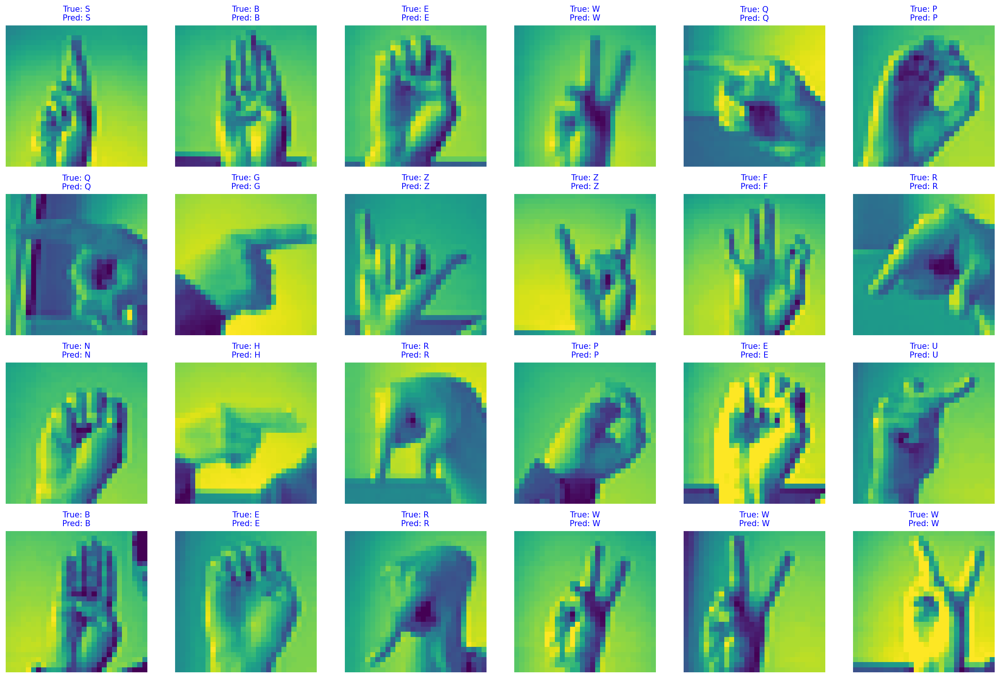

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate predictions for the test set
predictions = model.predict(X_test)

# Select 24 random samples from the test set
num_samples = 24
random_indices = np.random.choice(len(X_test), num_samples, replace=False)
sample_images = X_test[random_indices]
sample_labels = y_test[random_indices]
sample_predictions = np.argmax(predictions[random_indices], axis=1)

# Map the numeric labels to letters (A-Z, skipping J)
def label_to_letter(label):
    return chr(label + 65) if label < 9 else chr(label + 66)

# Plot the 24 images in a grid
plt.figure(figsize=(18, 12), dpi=150)  # Higher resolution and larger figure
for i in range(num_samples):
    plt.subplot(4, 6, i + 1)
    plt.imshow(sample_images[i].reshape(28, 28), cmap='viridis')  # Vibrant colormap
    true_label = label_to_letter(sample_labels[i])
    pred_label = label_to_letter(sample_predictions[i])
    plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=10, color='blue')
    plt.axis('off')

plt.tight_layout()
plt.show()


**Conclusions on CNN**

In the end, we achieved an optimal model with high accuracy on both the training and testing datasets. While the training results were slightly higher for smaller convolutional and hidden layer sizes, the overall performance remained consistent. The ReLU activation function proved to be the best choice for the CNN, as is commonly recognized. Batch normalization was not necessary in this case, as the model convergence was already fast. However, dropout played a crucial role in preventing overfitting.

Overall, we are highly satisfied with the final results and the experiments conducted to achieve them, as they allowed us to explore various techniques effectively

**REPORT CONCLUSION**

Dataset 1: Give Me Some Credit

How does monthly income affect financial distress?

Analysis revealed that Monthly Income is a key determinant of financial distress, with individuals earning lower incomes being more likely to experience delinquency. Techniques such as median imputation preserved the integrity of this feature despite missing values. Furthermore, feature importance analysis in Random Forest and XGBoost confirmed Monthly Income as one of the top predictors of financial risk.

Can clustering techniques such as K-Means be applied to segment individuals?

Clustering with K-Means proved effective in segmenting individuals based on their financial attributes. Using the Elbow Method and Silhouette Scores, we identified four optimal clusters representing distinct financial profiles, such as low-income, high-debt individuals and high-income, low-debt customers.

Dataset 2: Sign Language MNIST

How can sign language recognition models generalize across different individuals with varying hand shapes, speeds, and styles?

Generalization was achieved by employing data augmentation techniques, such as rotations, flips, and zooms, to simulate real-world variations in hand gestures. Convolutional Neural Networks (CNNs) demonstrated superior performance in recognizing diverse hand shapes and styles, achieving high accuracy with minimal overfitting. This approach ensures robustness across different user profiles, paving the way for broader adoption.

Can a unified machine learning model be trained to recognize signs from multiple sign languages and differentiate between them?

While this dataset focused on American Sign Language (ASL), the results suggest that CNNs, combined with transfer learning from pre-trained models, could be extended to recognize signs from multiple languages

How can machine learning algorithms be developed to automatically recognize and translate sign language gestures into text?

The CNN-based model, paired with a softmax output for classification, forms the foundation for real-time gesture-to-text translation. With additional training on dynamic gestures and integration into mobile or wearable devices, this solution could enable seamless translation of sign language into text for communication.

**BEST SOLUTIONS**

For Dataset 1 (Financial Distress Prediction):

The Random Forest and XGBoost models, optimized with SMOTE to address class imbalance, emerged as the best classifiers. These models achieved high accuracy, precision, and AUC-ROC scores, effectively predicting delinquency while handling imbalanced datasets. Feature importance analysis provided actionable insights, identifying NumberOfTimes90DaysLate and DebtRatio as other key predictors alongside Monthly Income.

For Dataset 2 (Sign Language Recognition):

The CNN architecture, with data augmentation and ReLU activation, delivered the best results for sign language classification. This model achieved high accuracy on both training and test sets while maintaining robustness against overfitting.


**CONTRIBUTIONS**

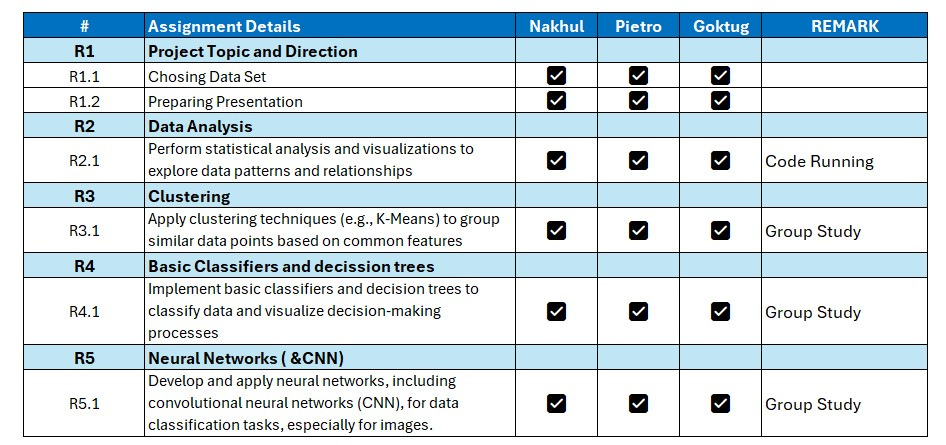